In [3]:
import os
import pandas as pd
import numpy as np
import math
import empyrical as empy

import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap, LinearSegmentedColormap


from sklearn.metrics import accuracy_score, precision_score, explained_variance_score, mean_squared_error

import warnings
warnings.filterwarnings("ignore")

In [4]:
csv = './data/XAU_USD.csv'
start = '1985'
end = '2021'


In [5]:
def print_clustermap(data, title='', figsize=(12,12)):
    
    corr = data.corr()
    '''data_clean = data.applymap(lambda x: x if x!=0 else np.nan)
    for n in ['Growth','Mod','FICon','Con']:
        data_clean[n] = data_clean[n].fillna(0)
    corr = data_clean.corr()
    '''
    g = sns.clustermap(corr, method="complete", cmap='PuOr', annot=True, 
                   annot_kws={"size": 10}, vmin=-1, vmax=1, figsize=figsize)
    g.fig.suptitle(title)
    plt.show()

In [6]:
def drawdown_from_price(price):
    if isinstance(price, pd.Series):
        return _drawdown_from_price(price)
    elif isinstance(price, pd.DataFrame):
        return price.apply(_drawdown_from_price)
    else:
        raise non_pd_error

def _drawdown_from_price(price):
    shift_max = price.copy()
    _max = price.iloc[0]
    for i, j in price.items():
        #print('i', i)
        #print('j', j)
        _max = max(_max, j)
        shift_max[i] = _max
    return price / shift_max - 1

def return_to_price(ret, ini=100):
    price_0 = ret.iloc[:1] * 0 + ini
    price_0.index = [0]
    price = (1+ret).cumprod() * ini
    return pd.concat([price_0, price])

def drawdown_from_return(ret, ini=100):
    price = return_to_price(ret, ini)
    return drawdown_from_price(price).iloc[1:]

def avg_drawdown(ret):
    dd = drawdown_from_return(ret)
    return dd.mean()


In [7]:
def empy_metric(ret):
    if isinstance(ret, pd.DataFrame):
        return ret.apply(empy_metric).T
    total_return = lambda x: (1+x).prod()-1
    met_func = [total_return, empy.annual_return, empy.sharpe_ratio, empy.annual_volatility, 
                empy.max_drawdown, avg_drawdown]
    
    met_func_names = ['total_return', 'annual_return', 'sharpe_ratio', 'annual_volatility', 
                      'max_drawdown', 'avg_drawdown',]
    
    se = pd.Series([f(ret) for f in met_func], met_func_names)
    
    se['return/maxdd'] = -se.annual_return/se.max_drawdown
    se['return/avgdd'] = -se.annual_return/se.avg_drawdown
    
    return se


In [8]:
def predict_freq(pred, freq='M'):
    
    #print(pred)
    #print(pred[pred.index.duplicated()])
    
    idx = pred.index.to_series()
    idx_m = idx.groupby(pd.Grouper(freq=freq)).first()
    pred_m = pred.groupby(pd.Grouper(freq=freq)).first()
    pred_m.index = idx_m
    
    #print(idx)
    #print(idx[idx.index.duplicated()])
    #print(pred_m)
    #print(pred_m[pred_m.index.duplicated()])
    
    pred_m = pred_m.dropna().reindex(idx).ffill()
    
    return pred_m


In [9]:
sma = lambda x, y: x.rolling(int(y)).mean()

ewma = lambda x, y: x.ewm(span=y).mean()

def s(x,x0,x1,y0=0,y1=1,d=np.nan):
    if x>=x1:
        return y1
    if x<x0:
        return y0
    return d


In [10]:
def exp_sum(se):
    _sum = 0
    for i,v in enumerate(se):
        _sum += v*(2**i)
    return _sum
def cont_n_01(x, n):
    if x <= 0:
        return 0
    if x >= 2**n - 1:
        return 1
    return np.nan
def predict_cont_n(vote, n, rb_lookback=True):
    if not rb_lookback:
        v_tmp = vote.groupby(pd.Grouper(freq='M')).apply(lambda x: predict_cont_n(x, n)).values
        return pd.Series(v_tmp, index=vote.index)
    vres = vote.rolling(n).apply(lambda x: exp_sum(x))
    vote_c = vres.apply(lambda x: cont_n_01(x, n))
    if np.isnan(vote_c.iloc[0]):
        vote_c.iloc[0] = vote.iloc[0]
    vote_c = vote_c.ffill()
    return vote_c

In [37]:
price = pd.read_csv(csv, index_col=0)['adj_close']
price.index = pd.to_datetime(price.index)

In [38]:
true_ret = price.pct_change()
true_yret = empy.aggregate_returns(true_ret, convert_to='yearly')
true_mret = empy.aggregate_returns(true_ret, convert_to='monthly')
true_ret = true_ret[start:end]
true_ret

date
1985-01-02   -0.009082
1985-01-03   -0.010475
1985-01-04    0.002646
1985-01-07   -0.016166
1985-01-08    0.012743
                ...   
2021-12-27    0.001543
2021-12-28   -0.003054
2021-12-29   -0.000947
2021-12-30    0.006293
2021-12-31    0.007372
Name: adj_close, Length: 9612, dtype: float64

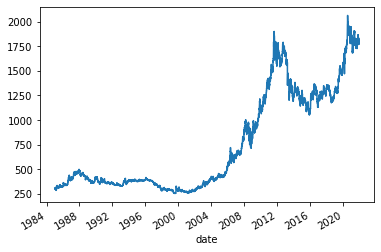

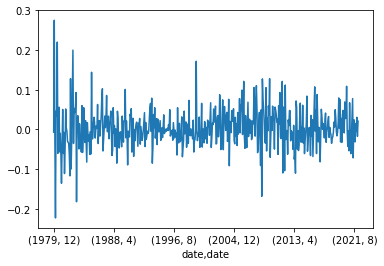

<AxesSubplot:xlabel='date'>

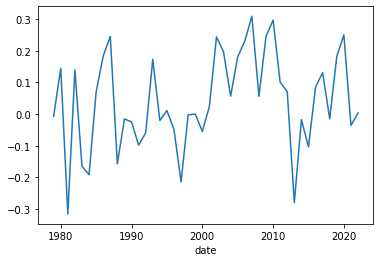

In [39]:
price[start:end].plot()
plt.show()
true_mret.plot()
plt.show()
true_yret.plot()

In [13]:
true_up = (true_ret>=0)
true_up

date
1985-01-02    False
1985-01-03    False
1985-01-04     True
1985-01-07    False
1985-01-08     True
              ...  
2021-12-27     True
2021-12-28    False
2021-12-29    False
2021-12-30     True
2021-12-31     True
Name: adj_close, Length: 9612, dtype: bool

In [14]:
def other_metric(ret):
    if isinstance(ret, pd.DataFrame):
        return ret.apply(other_metric).T
    
    pred_up = (ret!=0)*1
    
    highlight_ratio = pred_up.mean()
    flip_ratio = (pred_up - pred_up.shift()).abs().mean()
    
    idx_tmp = pred_up.index & true_up.index
    true_up_tmp = true_up.reindex(idx_tmp) * 1
    pred_up = pred_up.reindex(idx_tmp) * 1
    accu = accuracy_score(true_up_tmp, pred_up)
    prec = precision_score(true_up_tmp, pred_up)
    
    true_up_pct = true_ret.reindex(idx_tmp)
    true_up_pct_scaled = true_up_pct/true_up_pct.std() + 0.5
    
    mse = mean_squared_error(true_up_pct_scaled, pred_up)
    
    se = pd.Series(dtype='float64')
    
    se['highlight_ratio'] = highlight_ratio
    se['flip_ratio'] = flip_ratio
    se['accu'] = accu
    se['prec'] = prec
    se['mse'] = mse
    
    return se


In [15]:
def ret_short_once_every_interval(ret, shorting_interval):
    
    ret_short = ret.copy()
    
    t_prev = ret.index[0]
    cum_prod_prev = 1
    t_start_short = ret.index[0]
    cum_prod = 1
    
    for t in ret.index[1:]:
        if shorting_interval[t]:
            if not shorting_interval[t_prev]:
                t_start_short = t
                
            cum_prod = 2 - (1+ret[t_start_short:t]).prod()
            if cum_prod <= 0:
                ret_short[t:] = 0
                ret_short[t] = -1
                
                print('t_start_short', t_start_short)
                print('price', price[t_start_short])
                print('t', t)
                print('price', price[t])
                
                print('broke on', t)
                
                break
            ret_short[t] = cum_prod / cum_prod_prev - 1
                
                
        else:
            cum_prod = 1
        
        t_prev = t
        cum_prod_prev = cum_prod
    
    return ret_short
    

In [16]:
def sim_indicator(pred_up, name, plot=False):
    
    pred_up = pred_up.reindex(true_ret.index).ffill()
    
    indicator = pred_up[pred_up==1].index
    
    
    ret_df = pd.DataFrame()

    #ret_df['buy_and_hold'] = ret[start:]

    ret_i = true_ret.copy()
    ret_i.loc[~ret_i.index.isin(indicator)] = 0
    ret_df['hold_only_pred_up_{}'.format(name)] = ret_i
    
    #highlight_ratio = ret_i.apply(lambda x: 1 if x!=0 else 0).mean()
    
    highlight_ratio = pred_up.mean()
    flip_ratio = (pred_up - pred_up.shift()).abs().mean()
    
    
    
    #print('highlight_ratio', highlight_ratio)
    #print('flip_ratio', flip_ratio)
    
    
    empy_met = empy_metric(ret_df)
    
    
    other_met = other_metric(ret_df)
    
    """
    for k in [5,10,21]:
        pct_change = (price.shift(1-k) - price.shift(1))/price.shift(1)
        pct_change = pct_change.reindex(idx_tmp)
        true_up_k = (pct_change>=0)*1
        other_met['accu{}'.format(k)] = [accuracy_score(true_up_k, pred_up)]
        other_met['prec{}'.format(k)] = [precision_score(true_up_k, pred_up)]
        
        #true_up_pct_scaled = (pct_change-pct_change.min())/(pct_change.max()-pct_change.min())
        true_up_pct_scaled = pct_change/pct_change.std() + 0.5
        #other_met['expvar{}'.format(k)] = [explained_variance_score(true_up_pct_scaled, pred_up)]
        other_met['mse{}'.format(k)] = [mean_squared_error(true_up_pct_scaled, pred_up)]
        
    """
    
    if plot:
        fig, ax = plt.subplots()
        (1+ret_df).cumprod().plot(ax=ax)
        ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
        ax.set_yscale("log")
        plt.show()
    
    res = {}
    res['ret_df'] = ret_df
    res['empy_metric'] = empy_met
    res['other_metric'] = other_met
    
    return res
    

In [17]:
def sim_indicator_prob(prob_up, name, plot=False):
    
    #indicator = pred_up[pred_up==1].index
    
    
    ret_df = pd.DataFrame()

    #ret_df['buy_and_hold'] = ret[start:]

    ret_i = ret[start:end].copy()
    #ret_i.loc[~ret_i.index.isin(indicator)] = 0
    ret_df['hold_only_pred_up_{}'.format(name)] = ret_i*prob_up[start:end]
    
    #highlight_ratio = ret_i.apply(lambda x: 1 if x!=0 else 0).mean()
    
    highlight_ratio = prob_up.mean()
    #flip_ratio = (pred_up - pred_up.shift()).abs().mean()
    flip_ratio = (prob_up - prob_up.shift()).abs().mean()
    
    
    
    #print('highlight_ratio', highlight_ratio)
    #print('flip_ratio', flip_ratio)
    
    
    empy_met = empy_metric(ret_df)
    
    pred_up = prob_up.apply(lambda x: 0 if x<0.5 else 1)
    
    
    true_up = (ret[start:]>=0).dropna()
    idx_tmp = pred_up.index & true_up.index
    true_up = true_up.reindex(idx_tmp) * 1
    pred_up = pred_up.reindex(idx_tmp) * 1
    prob_up = prob_up.reindex(idx_tmp) * 1
    accu = accuracy_score(true_up, pred_up)
    prec = precision_score(true_up, pred_up)
    '''
    true_up21 = (price.shift(-20) - price.shift(1))>=0
    true_up21 = true_up21.reindex(idx_tmp) * 1
    accu21 = accuracy_score(true_up21, pred_up)
    '''
    
    true_up_pct = ret.reindex(idx_tmp)
    #true_up_pct_scaled = (true_up_pct-true_up_pct.min())/(true_up_pct.max()-true_up_pct.min())
    true_up_pct_scaled = true_up_pct/true_up_pct.std() + 0.5
    
    expvar = explained_variance_score(true_up_pct_scaled, prob_up)
    mse = mean_squared_error(true_up_pct_scaled, prob_up)
    
    
    other_met = pd.DataFrame()
    other_met['highlight_ratio'] = [highlight_ratio]
    other_met['flip_ratio'] = [flip_ratio]
    other_met['accu'] = [accu]
    other_met['prec'] = [prec]
    other_met['expvar'] = [expvar]
    other_met['mse'] = [mse]
    
    
    #other_met['accu21'] = [accu21]
    
    for k in [5,10,21]:
        pct_change = (price.shift(1-k) - price.shift(1))/price.shift(1)
        pct_change = pct_change.reindex(idx_tmp)
        true_up_k = (pct_change>=0)*1
        other_met['accu{}'.format(k)] = [accuracy_score(true_up_k, pred_up)]
        other_met['prec{}'.format(k)] = [precision_score(true_up_k, pred_up)]
        
        #true_up_pct_scaled = (pct_change-pct_change.min())/(pct_change.max()-pct_change.min())
        true_up_pct_scaled = pct_change/pct_change.std() + 0.5
        other_met['expvar{}'.format(k)] = [explained_variance_score(true_up_pct_scaled, prob_up)]
        other_met['mse{}'.format(k)] = [mean_squared_error(true_up_pct_scaled, prob_up)]
        
    
    
    
    
    
    #other_met['accu'] = [accu]
    #other_met['accu21'] = [accu21]
    
    #display(empy_met)
    
    if plot:
        fig, ax = plt.subplots()
        (1+ret_df).cumprod().plot(ax=ax)
        ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
        ax.set_yscale("log")
        plt.show()
    
    res = {}
    res['ret_df'] = ret_df
    res['empy_metric'] = empy_met
    res['other_metric'] = other_met
    
    return res
    

In [18]:
def print_all_result(ret_df, proba_df=None, topn=10, strategy_list_sel=None, base_case=None):
    
    display('{} to {}'.format(ret_df.index[0], ret_df.index[-1]))
    
    column_selected = ['annual_return', 'sharpe_ratio', 'max_drawdown', 'avg_drawdown', 'return/avgdd',]
    empy_metric_tmp = empy_metric(ret_df).sort_values('sharpe_ratio')
    if strategy_list_sel is None:

        strategy_list_sel = list(empy_metric_tmp.index)

        strategy_list_sel = strategy_list_sel[-topn:]

    if 'buy_and_hold' in strategy_list_sel:
        strategy_list_sel = [x for x in strategy_list_sel if x !='buy_and_hold']
    
    base_list = ['buy_and_hold']
    if base_case is not None:
        for bc in base_case:
            if bc == 'buy_and_hold':
                continue
            else:
                if bc not in strategy_list_sel:
                    base_list.append(bc)
    strategy_list_sel = base_list+strategy_list_sel
    
    other_metric_tmp = other_metric(ret_df)
    
    display(other_metric_tmp.loc[strategy_list_sel[1:]].iloc[:,:5])
    display(empy_metric_tmp.loc[strategy_list_sel][column_selected])
    
    fig, ax = plt.subplots(figsize=(20,15))
    
    cm = plt.get_cmap('gist_rainbow')
    NUM_COLORS = ret_df[strategy_list_sel].shape[1]
    ax.set_prop_cycle(color=[cm(1.*i/NUM_COLORS) for i in range(NUM_COLORS)])


    (1+ret_df[strategy_list_sel]).cumprod().plot(ax=ax)
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    ax.set_yscale("log")
    plt.show()
    
#     cvals  = [0, 0.5, 1]
#     colors = ["red", 'white', "lawngreen"]
#     cmap = LinearSegmentedColormap.from_list("", colors)
#     norm=plt.Normalize(min(cvals),max(cvals))
#     tuples = list(zip(map(norm,cvals), colors))
#     cmap = LinearSegmentedColormap.from_list("", tuples)
#     sm = plt.cm.ScalarMappable(cmap=cmap)#, norm=norm
#     sm.set_array([])

    
    if proba_df is None:
        return strategy_list_sel

    alpha = 1
    dot_size = 20
    
    base_cumret = (1+ret_df['buy_and_hold']).cumprod().apply(math.log)
    base_cumret.name = 'buy_and_hold'
    
    for case in strategy_list_sel:
        if case not in proba_df.columns:
            continue
        print("====================================", case)
#         try:
        if True:
            df_temp = pd.concat([ret_df[case], proba_df[case]],1,keys=['return','pred prob']).dropna()

    #         df_temp['log return'] = (1+df_temp['return']).apply(math.log)
    #         df_temp['cumulative return'] = (1+df_temp['return']).cumprod()-1
            df_temp['log cumulative return'] = (1+df_temp['return']).cumprod().apply(math.log)

            z_ret = ret_df[case]/ret_df[case].std()
            z_prod = (proba_df[case]-0.5)/proba_df[case].std()
            df_temp['score'] = 3-abs(z_ret-z_prod)

            df_temp = df_temp.reset_index()
            df_temp['date'] = pd.to_datetime(df_temp['date'])
            
#             display(df_temp)
            
            plot_hue = 'pred prob'
        
            cvals  = [0,0.5,1]
            colors = ["red","white","lawngreen"]
            norm = plt.Normalize(min(cvals),max(cvals))
            tuples = list(zip(map(norm,cvals), colors))
            cmap_prob = LinearSegmentedColormap.from_list("", tuples)
            sm_prob = plt.cm.ScalarMappable(cmap=cmap_prob, norm=norm)
            sm_prob.set_array([])
            
            fig, ax = plt.subplots(figsize=(20,15))
            ax = sns.scatterplot(data=df_temp, x='date', y='log cumulative return', hue=plot_hue,
                                 #hue='score', alpha=0.5, palette=cmap, s=20)
                                 alpha=0.5, palette=cmap_prob, s=dot_size
#                                  cmap=cmap_prob
                                )
            base_cumret.plot(ax=ax)

            ax.set_xlim([df_temp['date'].iloc[0], df_temp['date'].iloc[-1]])
            ax.get_legend()#.remove()
#             ax.set_yscale("log")
            ax.figure.colorbar(sm_prob)
            ax.set_title("{} {}".format(case, plot_hue))
            plt.show()
            
            fig, ax = plt.subplots(figsize=(12,10))
            proba_df.loc[ret_df.index, case].plot(kind='bar', ax=ax, legend=False)
#             ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
            ax.set_title(case + ' proba')
            plt.show()
#         except Exception as e:
#             print(e)
#             continue
    
    
    return strategy_list_sel
    

In [19]:
ll = [34 + n*8 for n in range(0, 8)]
ll.sort()
sma_all = {'sma{}'.format(span): sma(price.shift(), span) for span in ll}
sma_all = pd.DataFrame(sma_all)

In [20]:
pred_sma_cross = pd.DataFrame(1, index=true_ret.index, columns=['buy_and_hold'])
for fast in ll:
    name_fast = 'sma{}'.format(fast)
    for slow1 in ll:
        name_slow1 = 'sma{}'.format(slow1)
        if slow1 > fast:
            name_pred = 'cross_sma_{}_{}'.format(fast, slow1)
            pred_tmp = ((sma_all[name_fast] > sma_all[name_slow1])*1)
            pred_sma_cross[name_pred] = pred_tmp[start:end]
pred_sma_cross.shape

(9612, 29)

In [21]:
proba_sma_cross = pd.DataFrame(1, columns=pred_sma_cross.columns, index=pred_sma_cross.index)

In [22]:
ret_sma_cross = pred_sma_cross.multiply(true_ret, 0)
ret_sma_cross.shape

(9612, 29)

'1985-01-02 00:00:00 to 2021-12-31 00:00:00'

,highlight_ratio,flip_ratio,accu,prec,mse
cross_sma_34_50,0.512276,0.035376,0.498023,0.514622,1.239169


,annual_return,sharpe_ratio,max_drawdown,avg_drawdown,return/avgdd
buy_and_hold,0.047776,0.378081,-0.493126,-0.224901,0.212431
cross_sma_34_50,0.036794,0.361685,-0.307022,-0.133425,0.275767


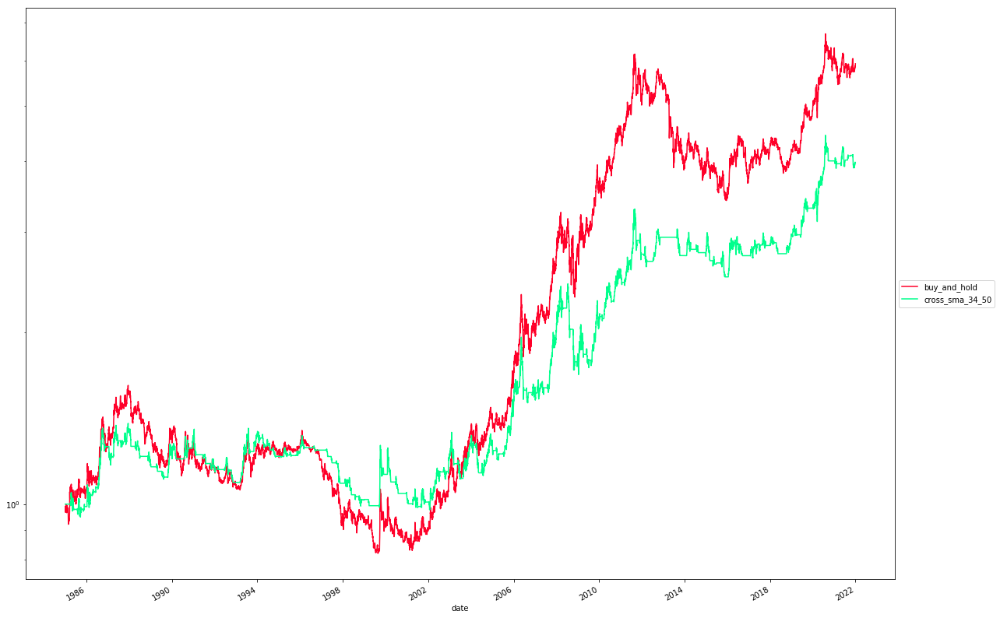

==================================== buy_and_hold


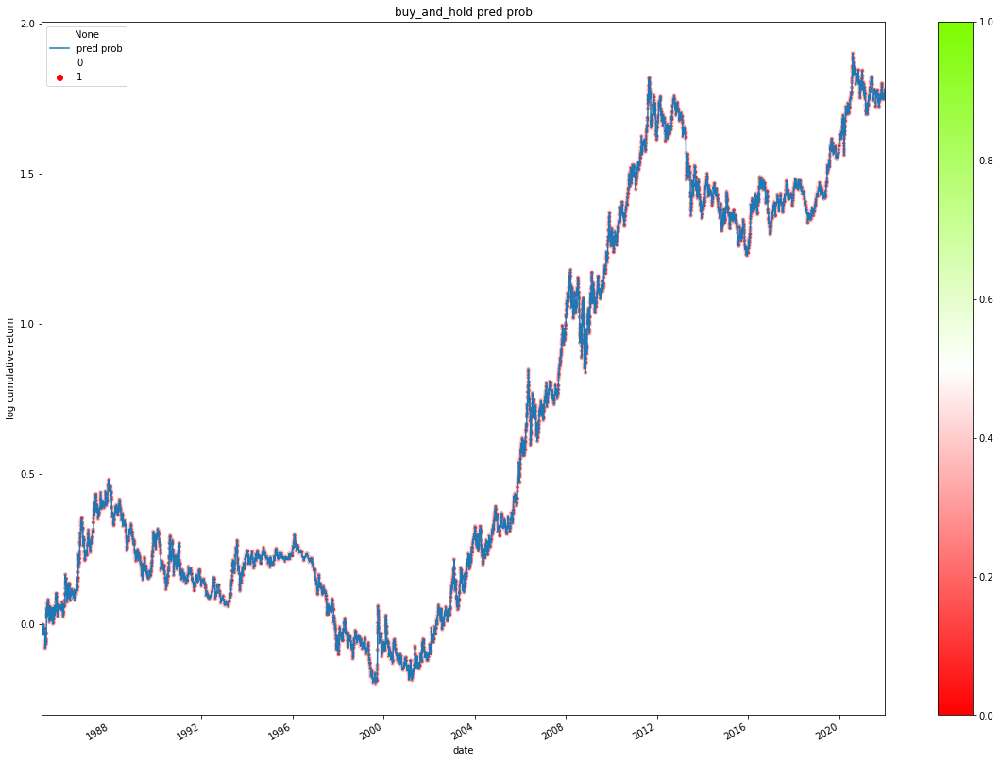

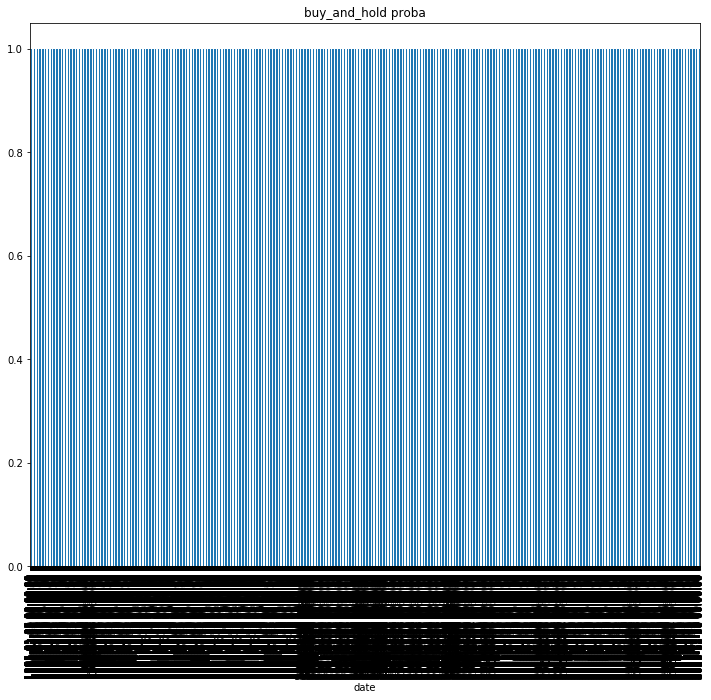

==================================== cross_sma_34_50


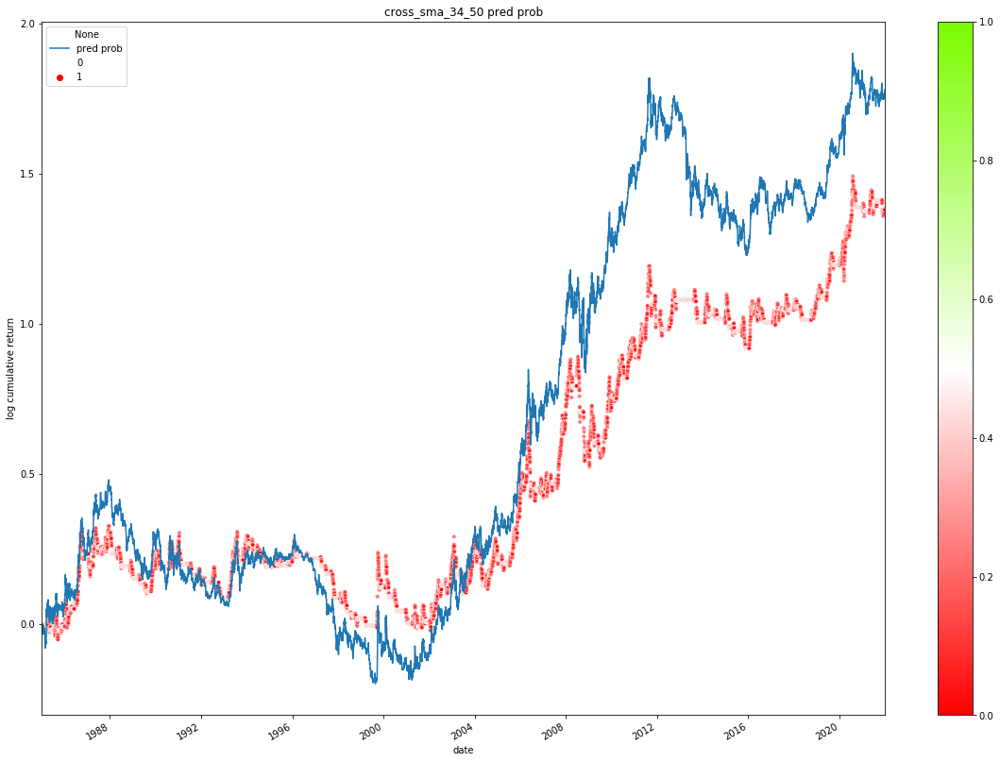

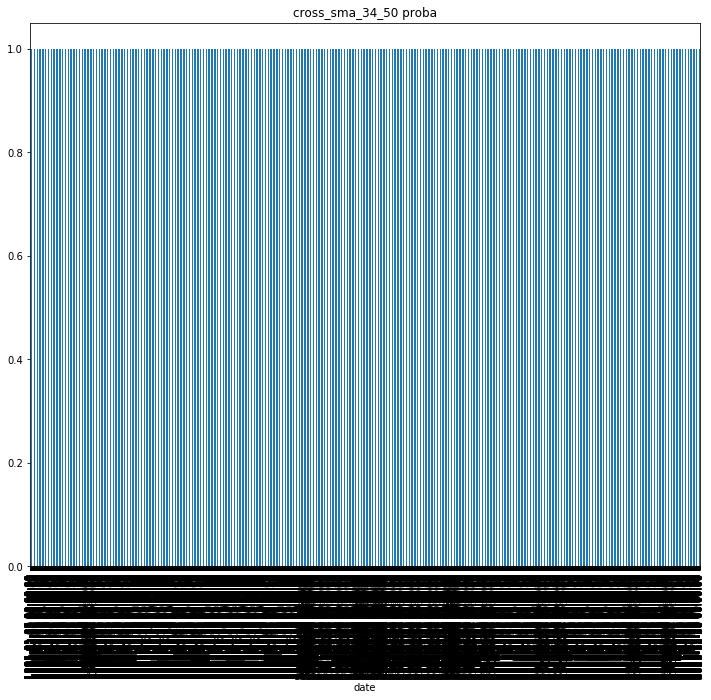

In [98]:
strategy_list_sel = print_all_result(ret_sma_cross, proba_sma_cross, topn=2)

'1985-01-02 00:00:00 to 2021-12-31 00:00:00'

,highlight_ratio,flip_ratio,accu,prec,mse
cross_sma_42_58,0.515710,0.034024,0.492926,0.509582,1.260116
cross_sma_34_66,0.511340,0.028405,0.491885,0.508647,1.259812
cross_sma_50_58,0.513629,0.039434,0.494174,0.510837,1.257087
cross_sma_58_74,0.519143,0.031110,0.496151,0.512625,1.256651
cross_sma_58_66,0.520807,0.037977,0.496151,0.512585,1.256377
cross_sma_50_82,0.511028,0.024035,0.495943,0.512622,1.255282
cross_sma_50_66,0.516542,0.032151,0.495839,0.512387,1.254945
cross_sma_42_66,0.513629,0.029029,0.496047,0.512660,1.253825
cross_sma_42_74,0.510508,0.026324,0.496879,0.513552,1.252998
cross_sma_50_74,0.515710,0.027156,0.495422,0.512003,1.252946


,annual_return,sharpe_ratio,max_drawdown,avg_drawdown,return/avgdd
buy_and_hold,0.047776,0.378081,-0.493126,-0.224901,0.212431
cross_sma_42_58,0.010413,0.146593,-0.599356,-0.305047,0.034136
cross_sma_34_66,0.010850,0.150334,-0.497549,-0.246780,0.043967
cross_sma_50_58,0.014261,0.178759,-0.577010,-0.290460,0.049099
cross_sma_58_74,0.015041,0.186498,-0.489861,-0.254635,0.059068
cross_sma_58_66,0.015487,0.190831,-0.472377,-0.213213,0.072636
cross_sma_50_82,0.016903,0.203103,-0.491591,-0.240638,0.070241
cross_sma_50_66,0.017227,0.205281,-0.511781,-0.249903,0.068934
cross_sma_42_66,0.018313,0.212151,-0.504519,-0.235462,0.077775
cross_sma_42_74,0.019494,0.222942,-0.526566,-0.249818,0.078032


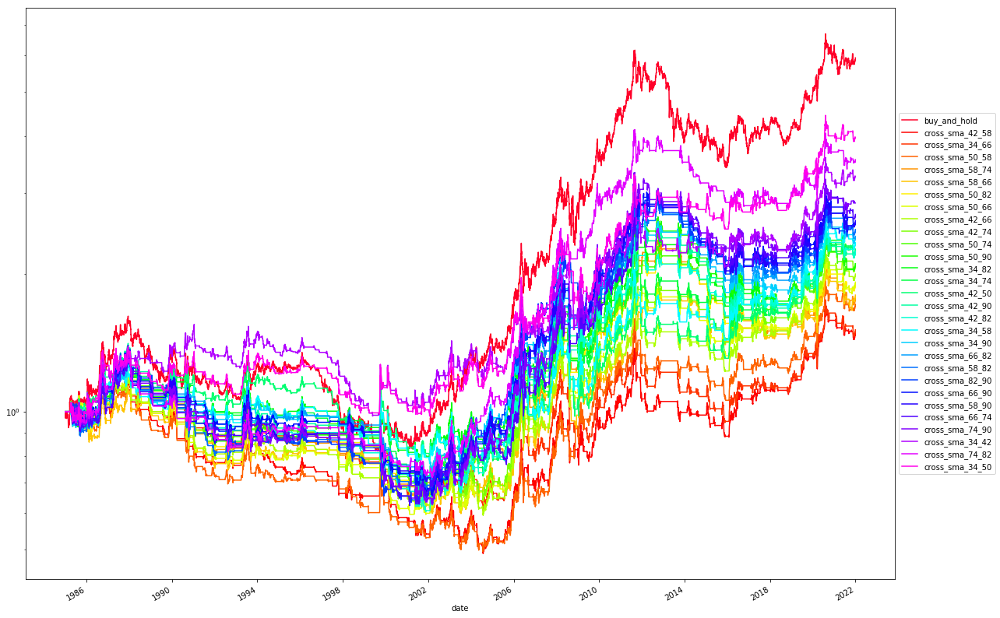

==================================== buy_and_hold
==================================== cross_sma_42_58
==================================== cross_sma_34_66
==================================== cross_sma_50_58
==================================== cross_sma_58_74
==================================== cross_sma_58_66
==================================== cross_sma_50_82
==================================== cross_sma_50_66
==================================== cross_sma_42_66
==================================== cross_sma_42_74
==================================== cross_sma_50_74
==================================== cross_sma_50_90
==================================== cross_sma_34_82
==================================== cross_sma_34_74
==================================== cross_sma_42_50
==================================== cross_sma_42_90
==================================== cross_sma_42_82
==================================== cross_sma_34_58
==================================== cross_sma_34

'1988-01-04 00:00:00 to 2000-12-29 00:00:00'

,highlight_ratio,flip_ratio,accu,prec,mse
cross_sma_42_58,0.385617,0.038780,0.485351,0.465081,1.279196
cross_sma_34_66,0.366972,0.033748,0.487422,0.466129,1.270172
cross_sma_50_58,0.377035,0.044701,0.488014,0.467818,1.278092
cross_sma_58_74,0.369044,0.031083,0.489494,0.469126,1.274902
cross_sma_58_66,0.381770,0.038780,0.492749,0.474419,1.265386
cross_sma_50_82,0.356022,0.026347,0.488902,0.467165,1.273286
cross_sma_50_66,0.375851,0.034044,0.488606,0.468504,1.278471
cross_sma_42_66,0.372595,0.032860,0.490678,0.471009,1.271851
cross_sma_42_74,0.359278,0.031083,0.490382,0.469522,1.277700
cross_sma_50_74,0.369932,0.030491,0.488606,0.468000,1.273505


,annual_return,sharpe_ratio,max_drawdown,avg_drawdown,return/avgdd
buy_and_hold,-0.042235,-0.283945,-0.481481,-0.272448,-0.155021
cross_sma_42_58,-0.049399,-0.514971,-0.497783,-0.325200,-0.151903
cross_sma_34_66,-0.040614,-0.430412,-0.427894,-0.242417,-0.167536
cross_sma_50_58,-0.048319,-0.505675,-0.493766,-0.331775,-0.145638
cross_sma_58_74,-0.044737,-0.511496,-0.471211,-0.304868,-0.146743
cross_sma_58_66,-0.035752,-0.394339,-0.392699,-0.246039,-0.145309
cross_sma_50_82,-0.043021,-0.506100,-0.452897,-0.287835,-0.149463
cross_sma_50_66,-0.048210,-0.545544,-0.488943,-0.302914,-0.159154
cross_sma_42_66,-0.042370,-0.439987,-0.449646,-0.276958,-0.152982
cross_sma_42_74,-0.047713,-0.517776,-0.484016,-0.300873,-0.158581


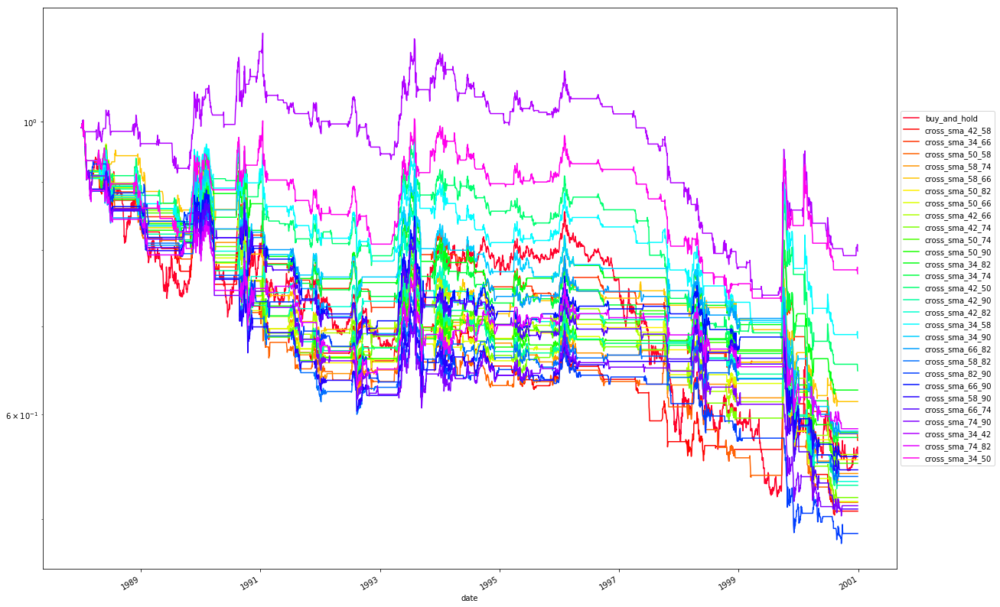

==================================== buy_and_hold
==================================== cross_sma_42_58
==================================== cross_sma_34_66
==================================== cross_sma_50_58
==================================== cross_sma_58_74
==================================== cross_sma_58_66
==================================== cross_sma_50_82
==================================== cross_sma_50_66
==================================== cross_sma_42_66
==================================== cross_sma_42_74
==================================== cross_sma_50_74
==================================== cross_sma_50_90
==================================== cross_sma_34_82
==================================== cross_sma_34_74
==================================== cross_sma_42_50
==================================== cross_sma_42_90
==================================== cross_sma_42_82
==================================== cross_sma_34_58
==================================== cross_sma_34

'2001-01-02 00:00:00 to 2005-12-30 00:00:00'

,highlight_ratio,flip_ratio,accu,prec,mse
cross_sma_42_58,0.654881,0.043846,0.495004,0.529343,1.293350
cross_sma_34_66,0.660261,0.036923,0.494235,0.528522,1.279683
cross_sma_50_58,0.643351,0.050000,0.489623,0.525687,1.296178
cross_sma_58_74,0.671791,0.042308,0.514988,0.543478,1.249781
cross_sma_58_66,0.667179,0.053077,0.495004,0.528802,1.286119
cross_sma_50_82,0.651038,0.031538,0.511145,0.541913,1.251679
cross_sma_50_66,0.663336,0.045385,0.503459,0.535342,1.260521
cross_sma_42_66,0.665642,0.037692,0.502690,0.534642,1.273389
cross_sma_42_74,0.661030,0.034615,0.504228,0.536047,1.270821
cross_sma_50_74,0.658724,0.036154,0.504996,0.536756,1.256734


,annual_return,sharpe_ratio,max_drawdown,avg_drawdown,return/avgdd
buy_and_hold,0.132401,0.936292,-0.154450,-0.042569,3.110238
cross_sma_42_58,0.013847,0.174619,-0.248447,-0.114660,0.120765
cross_sma_34_66,0.029497,0.298679,-0.246720,-0.108960,0.270713
cross_sma_50_58,0.011241,0.155038,-0.207712,-0.101197,0.111080
cross_sma_58_74,0.065325,0.580349,-0.183725,-0.065229,1.001471
cross_sma_58_66,0.022648,0.250369,-0.193478,-0.087977,0.257436
cross_sma_50_82,0.063554,0.583085,-0.204660,-0.074746,0.850277
cross_sma_50_66,0.052754,0.493251,-0.178205,-0.068649,0.768465
cross_sma_42_66,0.036955,0.358186,-0.224544,-0.092703,0.398639
cross_sma_42_74,0.040121,0.385192,-0.203789,-0.091099,0.440411


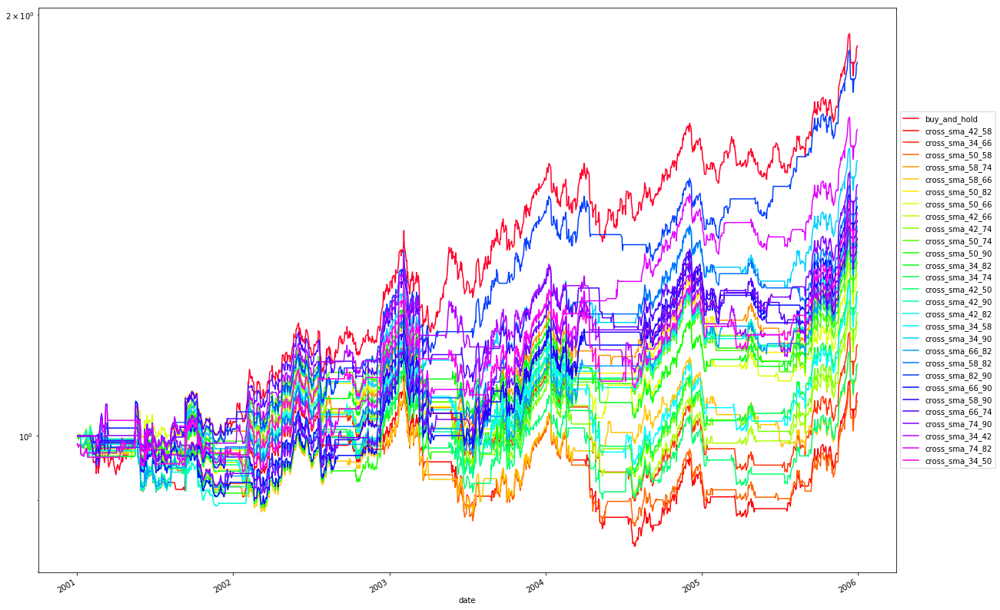

==================================== buy_and_hold
==================================== cross_sma_42_58
==================================== cross_sma_34_66
==================================== cross_sma_50_58
==================================== cross_sma_58_74
==================================== cross_sma_58_66
==================================== cross_sma_50_82
==================================== cross_sma_50_66
==================================== cross_sma_42_66
==================================== cross_sma_42_74
==================================== cross_sma_50_74
==================================== cross_sma_50_90
==================================== cross_sma_34_82
==================================== cross_sma_34_74
==================================== cross_sma_42_50
==================================== cross_sma_42_90
==================================== cross_sma_42_82
==================================== cross_sma_34_58
==================================== cross_sma_34

'2006-01-03 00:00:00 to 2008-12-31 00:00:00'

,highlight_ratio,flip_ratio,accu,prec,mse
cross_sma_42_58,0.661972,0.035897,0.490397,0.516441,1.248997
cross_sma_34_66,0.665813,0.028205,0.481434,0.509615,1.268546
cross_sma_50_58,0.661972,0.039744,0.503201,0.526112,1.223591
cross_sma_58_74,0.664533,0.032051,0.505762,0.527938,1.251469
cross_sma_58_66,0.669654,0.037179,0.505762,0.527725,1.252267
cross_sma_50_82,0.672215,0.021795,0.503201,0.525714,1.257170
cross_sma_50_66,0.682458,0.026923,0.503201,0.525328,1.242165
cross_sma_42_66,0.673496,0.026923,0.499360,0.522814,1.243603
cross_sma_42_74,0.665813,0.021795,0.507042,0.528846,1.239151
cross_sma_50_74,0.673496,0.021795,0.507042,0.528517,1.244584


,annual_return,sharpe_ratio,max_drawdown,avg_drawdown,return/avgdd
buy_and_hold,0.186867,0.824008,-0.290117,-0.090528,2.064197
cross_sma_42_58,0.092231,0.571391,-0.268450,-0.131545,0.701135
cross_sma_34_66,0.052400,0.373767,-0.289056,-0.163079,0.321314
cross_sma_50_58,0.147158,0.834551,-0.238331,-0.122309,1.203163
cross_sma_58_74,0.087445,0.552329,-0.258313,-0.135937,0.643274
cross_sma_58_66,0.085544,0.540391,-0.328927,-0.123695,0.691575
cross_sma_50_82,0.075497,0.491461,-0.290239,-0.136493,0.553123
cross_sma_50_66,0.107701,0.660059,-0.287710,-0.104263,1.032973
cross_sma_42_66,0.104398,0.640517,-0.269800,-0.118444,0.881411
cross_sma_42_74,0.114542,0.699648,-0.276156,-0.115247,0.993883


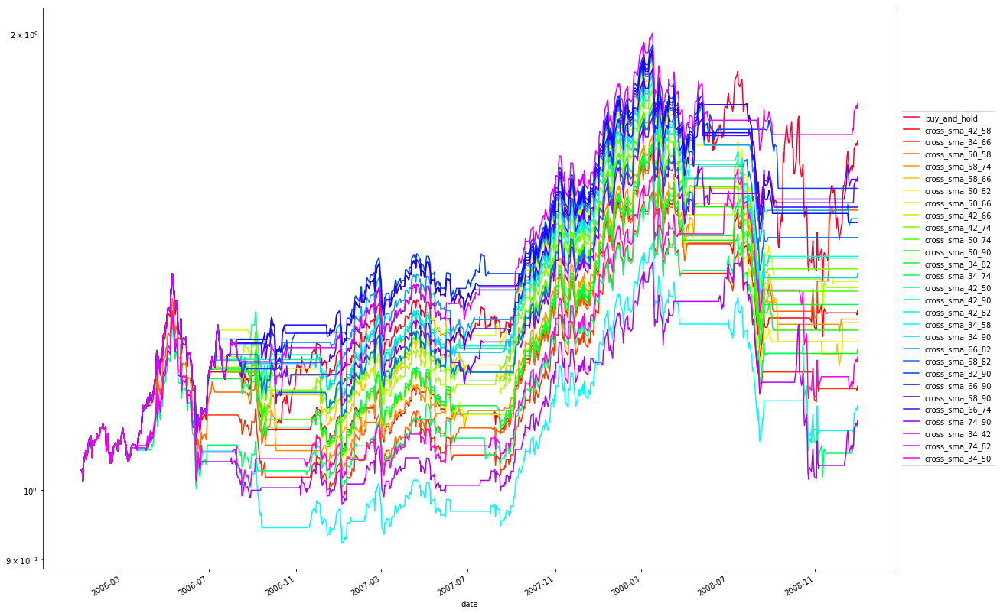

==================================== buy_and_hold
==================================== cross_sma_42_58
==================================== cross_sma_34_66
==================================== cross_sma_50_58
==================================== cross_sma_58_74
==================================== cross_sma_58_66
==================================== cross_sma_50_82
==================================== cross_sma_50_66
==================================== cross_sma_42_66
==================================== cross_sma_42_74
==================================== cross_sma_50_74
==================================== cross_sma_50_90
==================================== cross_sma_34_82
==================================== cross_sma_34_74
==================================== cross_sma_42_50
==================================== cross_sma_42_90
==================================== cross_sma_42_82
==================================== cross_sma_34_58
==================================== cross_sma_34

'2009-01-01 00:00:00 to 2011-12-30 00:00:00'

,highlight_ratio,flip_ratio,accu,prec,mse
cross_sma_42_58,0.758312,0.017926,0.516624,0.548061,1.257457
cross_sma_34_66,0.750639,0.016645,0.524297,0.553663,1.255088
cross_sma_50_58,0.757033,0.026889,0.505115,0.540541,1.241556
cross_sma_58_74,0.759591,0.024328,0.515345,0.547138,1.199017
cross_sma_58_66,0.755754,0.026889,0.521739,0.551607,1.206865
cross_sma_50_82,0.768542,0.015365,0.516624,0.547421,1.195580
cross_sma_50_66,0.755754,0.024328,0.516624,0.548223,1.209955
cross_sma_42_66,0.742967,0.016645,0.514066,0.547332,1.245122
cross_sma_42_74,0.755754,0.016645,0.519182,0.549915,1.217951
cross_sma_50_74,0.744246,0.016645,0.512788,0.546392,1.215618


,annual_return,sharpe_ratio,max_drawdown,avg_drawdown,return/avgdd
buy_and_hold,0.203590,1.084884,-0.186157,-0.044423,4.583029
cross_sma_42_58,0.084485,0.564627,-0.234398,-0.067784,1.246388
cross_sma_34_66,0.088094,0.581593,-0.220738,-0.068767,1.281059
cross_sma_50_58,0.110111,0.698393,-0.203325,-0.060287,1.826439
cross_sma_58_74,0.182815,1.081198,-0.153481,-0.049733,3.675921
cross_sma_58_66,0.169090,1.010922,-0.153481,-0.057190,2.956647
cross_sma_50_82,0.188750,1.107695,-0.153481,-0.055348,3.410263
cross_sma_50_66,0.163898,0.988295,-0.153481,-0.056172,2.917772
cross_sma_42_66,0.104388,0.670186,-0.187800,-0.065242,1.600013
cross_sma_42_74,0.150131,0.916462,-0.153481,-0.055335,2.713129


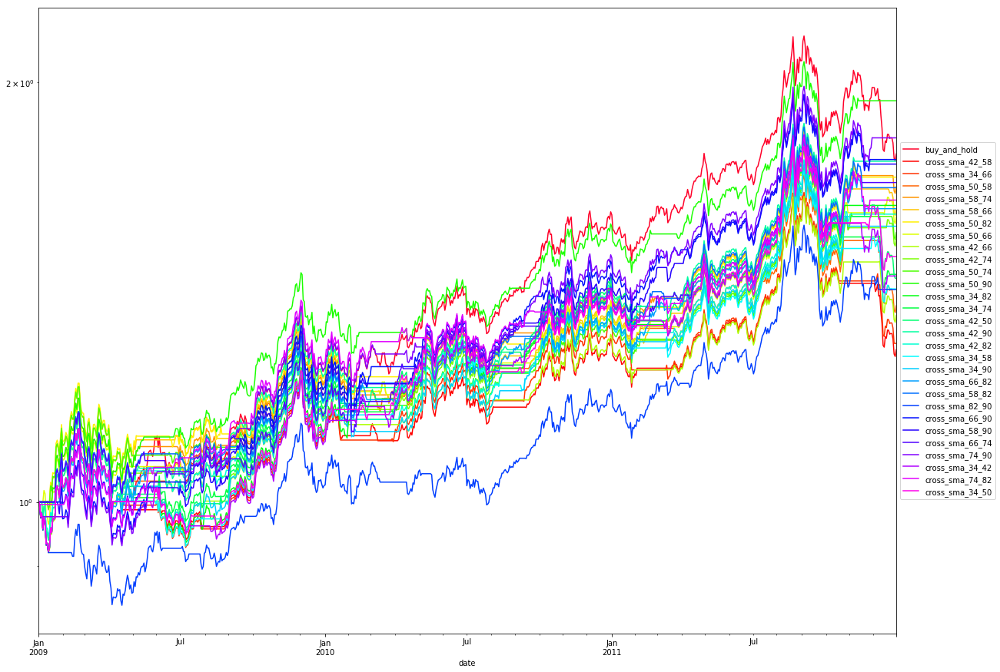

==================================== buy_and_hold
==================================== cross_sma_42_58
==================================== cross_sma_34_66
==================================== cross_sma_50_58
==================================== cross_sma_58_74
==================================== cross_sma_58_66
==================================== cross_sma_50_82
==================================== cross_sma_50_66
==================================== cross_sma_42_66
==================================== cross_sma_42_74
==================================== cross_sma_50_74
==================================== cross_sma_50_90
==================================== cross_sma_34_82
==================================== cross_sma_34_74
==================================== cross_sma_42_50
==================================== cross_sma_42_90
==================================== cross_sma_42_82
==================================== cross_sma_34_58
==================================== cross_sma_34

'2012-01-02 00:00:00 to 2015-12-31 00:00:00'

,highlight_ratio,flip_ratio,accu,prec,mse
cross_sma_42_58,0.330134,0.017291,0.486564,0.456395,1.251000
cross_sma_34_66,0.336852,0.015370,0.487524,0.458689,1.258944
cross_sma_50_58,0.331094,0.024015,0.502879,0.481159,1.252420
cross_sma_58_74,0.343570,0.020173,0.480806,0.449721,1.266342
cross_sma_58_66,0.342610,0.024015,0.495202,0.470588,1.237565
cross_sma_50_82,0.338772,0.015370,0.476008,0.441926,1.270790
cross_sma_50_66,0.338772,0.020173,0.497121,0.473088,1.269251
cross_sma_42_66,0.342610,0.018252,0.493282,0.467787,1.248368
cross_sma_42_74,0.343570,0.016330,0.486564,0.458101,1.261958
cross_sma_50_74,0.352207,0.018252,0.485605,0.457766,1.259900


,annual_return,sharpe_ratio,max_drawdown,avg_drawdown,return/avgdd
buy_and_hold,-0.089555,-0.494734,-0.412616,-0.229167,-0.390783
cross_sma_42_58,-0.044382,-0.472553,-0.197396,-0.087895,-0.504941
cross_sma_34_66,-0.054057,-0.596279,-0.250270,-0.108059,-0.500251
cross_sma_50_58,-0.045976,-0.504563,-0.206620,-0.075504,-0.608914
cross_sma_58_74,-0.062287,-0.796967,-0.325816,-0.124714,-0.499436
cross_sma_58_66,-0.027053,-0.299637,-0.241895,-0.086440,-0.312963
cross_sma_50_82,-0.067784,-0.852075,-0.301052,-0.100202,-0.676475
cross_sma_50_66,-0.066452,-0.762300,-0.287540,-0.113836,-0.583752
cross_sma_42_66,-0.041189,-0.430320,-0.213037,-0.084496,-0.487472
cross_sma_42_74,-0.057754,-0.639147,-0.265742,-0.099767,-0.578884


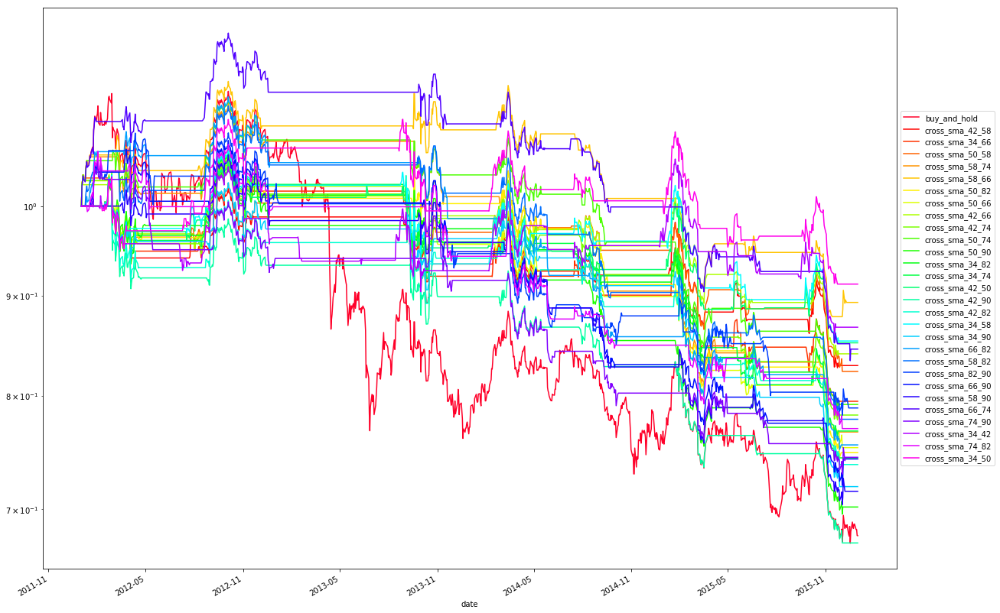

==================================== buy_and_hold
==================================== cross_sma_42_58
==================================== cross_sma_34_66
==================================== cross_sma_50_58
==================================== cross_sma_58_74
==================================== cross_sma_58_66
==================================== cross_sma_50_82
==================================== cross_sma_50_66
==================================== cross_sma_42_66
==================================== cross_sma_42_74
==================================== cross_sma_50_74
==================================== cross_sma_50_90
==================================== cross_sma_34_82
==================================== cross_sma_34_74
==================================== cross_sma_42_50
==================================== cross_sma_42_90
==================================== cross_sma_42_82
==================================== cross_sma_34_58
==================================== cross_sma_34

'2016-01-01 00:00:00 to 2021-12-31 00:00:00'

,highlight_ratio,flip_ratio,accu,prec,mse
cross_sma_42_58,0.576456,0.019846,0.509277,0.539401,1.212809
cross_sma_34_66,0.570697,0.014725,0.497121,0.529148,1.221496
cross_sma_50_58,0.585413,0.023688,0.509277,0.538798,1.218081
cross_sma_58_74,0.584133,0.017286,0.488804,0.521358,1.276887
cross_sma_58_66,0.575816,0.022407,0.492003,0.524444,1.255966
cross_sma_50_82,0.578375,0.010883,0.493282,0.525442,1.261682
cross_sma_50_66,0.573257,0.018566,0.497121,0.529018,1.235190
cross_sma_42_66,0.570697,0.016005,0.500960,0.532511,1.217434
cross_sma_42_74,0.571977,0.012164,0.498401,0.530201,1.232625
cross_sma_50_74,0.574536,0.013444,0.492003,0.524499,1.250128


,annual_return,sharpe_ratio,max_drawdown,avg_drawdown,return/avgdd
buy_and_hold,0.091659,0.718013,-0.185126,-0.066784,1.372467
cross_sma_42_58,0.087347,0.821724,-0.174426,-0.049832,1.752839
cross_sma_34_66,0.077199,0.731538,-0.168379,-0.047381,1.629330
cross_sma_50_58,0.081044,0.759241,-0.142715,-0.053863,1.504624
cross_sma_58_74,0.015123,0.191046,-0.206142,-0.082083,0.184245
cross_sma_58_66,0.038244,0.397615,-0.202986,-0.061080,0.626130
cross_sma_50_82,0.032022,0.344902,-0.164591,-0.078167,0.409667
cross_sma_50_66,0.061596,0.601280,-0.184695,-0.052127,1.181640
cross_sma_42_66,0.081927,0.773203,-0.150692,-0.044720,1.832018
cross_sma_42_74,0.064539,0.627554,-0.166145,-0.046166,1.397983


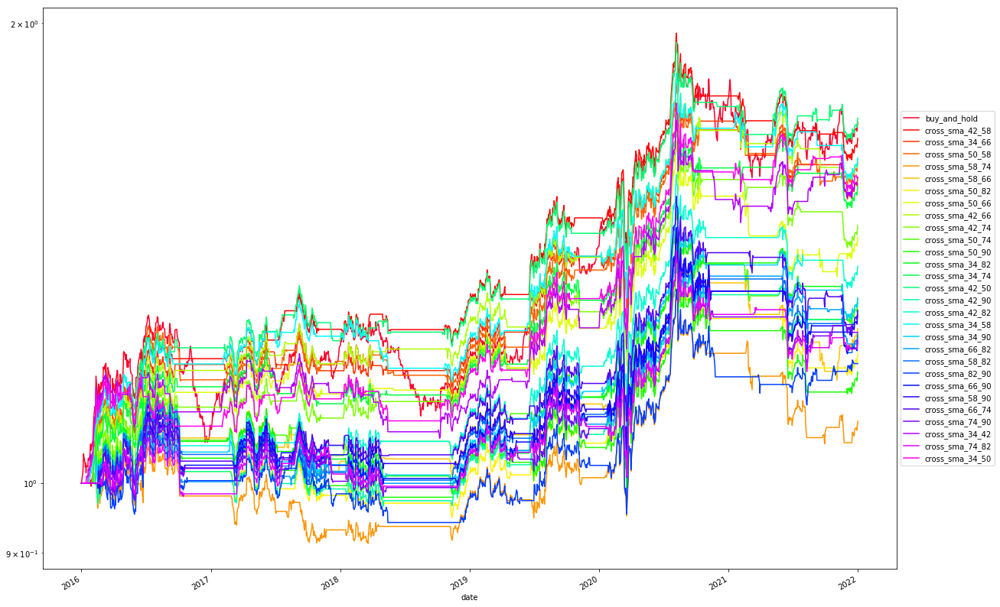

==================================== buy_and_hold
==================================== cross_sma_42_58
==================================== cross_sma_34_66
==================================== cross_sma_50_58
==================================== cross_sma_58_74
==================================== cross_sma_58_66
==================================== cross_sma_50_82
==================================== cross_sma_50_66
==================================== cross_sma_42_66
==================================== cross_sma_42_74
==================================== cross_sma_50_74
==================================== cross_sma_50_90
==================================== cross_sma_34_82
==================================== cross_sma_34_74
==================================== cross_sma_42_50
==================================== cross_sma_42_90
==================================== cross_sma_42_82
==================================== cross_sma_34_58
==================================== cross_sma_34

['buy_and_hold',
 'cross_sma_42_58',
 'cross_sma_34_66',
 'cross_sma_50_58',
 'cross_sma_58_74',
 'cross_sma_58_66',
 'cross_sma_50_82',
 'cross_sma_50_66',
 'cross_sma_42_66',
 'cross_sma_42_74',
 'cross_sma_50_74',
 'cross_sma_50_90',
 'cross_sma_34_82',
 'cross_sma_34_74',
 'cross_sma_42_50',
 'cross_sma_42_90',
 'cross_sma_42_82',
 'cross_sma_34_58',
 'cross_sma_34_90',
 'cross_sma_66_82',
 'cross_sma_58_82',
 'cross_sma_82_90',
 'cross_sma_66_90',
 'cross_sma_58_90',
 'cross_sma_66_74',
 'cross_sma_74_90',
 'cross_sma_34_42',
 'cross_sma_74_82',
 'cross_sma_34_50']

In [84]:
strategy_list_sel = print_all_result(ret_sma_cross, proba_sma_cross, topn=len(ret_sma_cross))

print_all_result(ret_sma_cross['1988':'2000'], proba_sma_cross, strategy_list_sel=strategy_list_sel)
print_all_result(ret_sma_cross['2001':'2005'], proba_sma_cross, strategy_list_sel=strategy_list_sel)
print_all_result(ret_sma_cross['2006':'2008'], proba_sma_cross, strategy_list_sel=strategy_list_sel)
print_all_result(ret_sma_cross['2009':'2011'], proba_sma_cross, strategy_list_sel=strategy_list_sel)
print_all_result(ret_sma_cross['2012':'2015'], proba_sma_cross, strategy_list_sel=strategy_list_sel)
print_all_result(ret_sma_cross['2016':'2021'], proba_sma_cross, strategy_list_sel=strategy_list_sel)

In [23]:
sma_all['average_sma'] = sma_all.mean(axis=1)
sma_all['min_sma'] = sma_all.min(axis=1)
sma_all['max_sma'] = sma_all.max(axis=1)
sma_all['ema5(average_sma)'] = ewma(sma_all['average_sma'], 5)
sma_all['ema25(average_sma)'] = ewma(sma_all['average_sma'], 25)

In [24]:
sma_all = pd.DataFrame(sma_all)[start:end]
sma_all.shape
# sma_all

(9612, 13)

In [26]:
df = pd.concat([sma_all, price.shift()],axis=1)
df.index = pd.to_datetime(df.index)

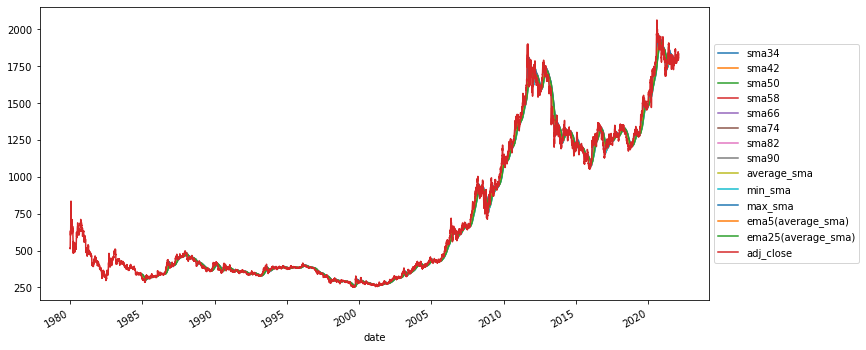

In [27]:
fig, ax = plt.subplots(figsize=(12,6))
df.plot(ax=ax)
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))

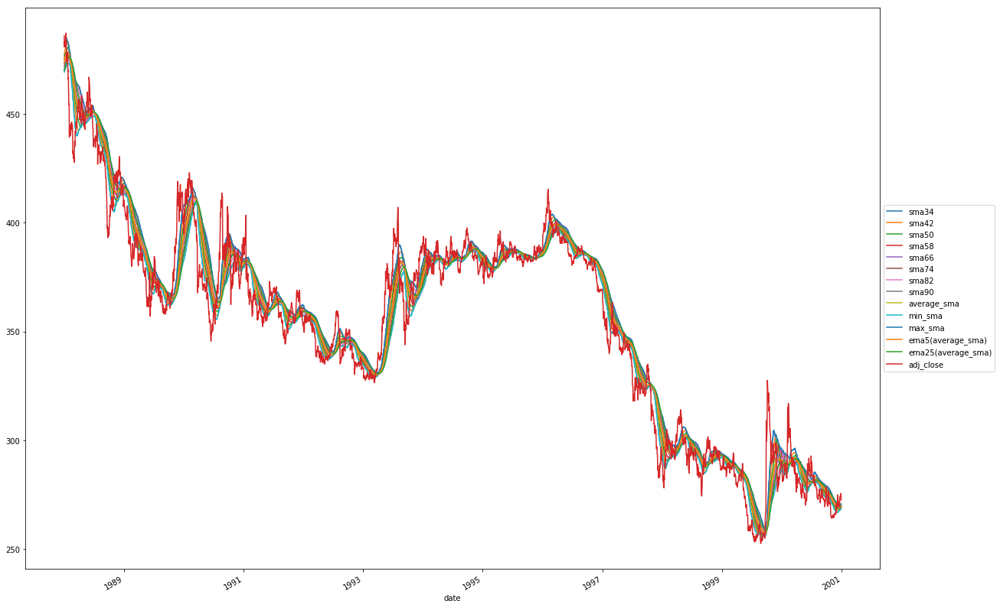

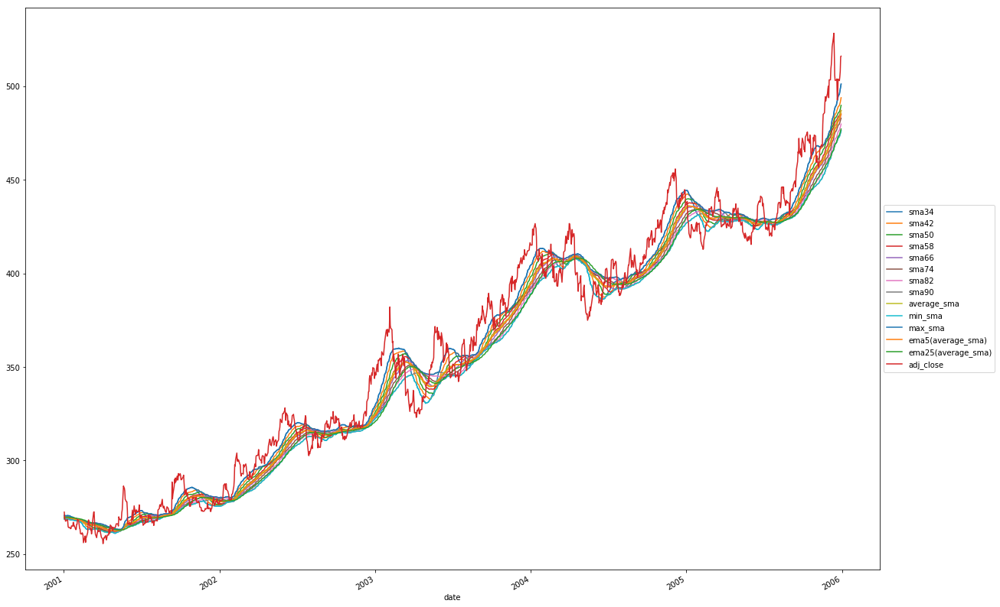

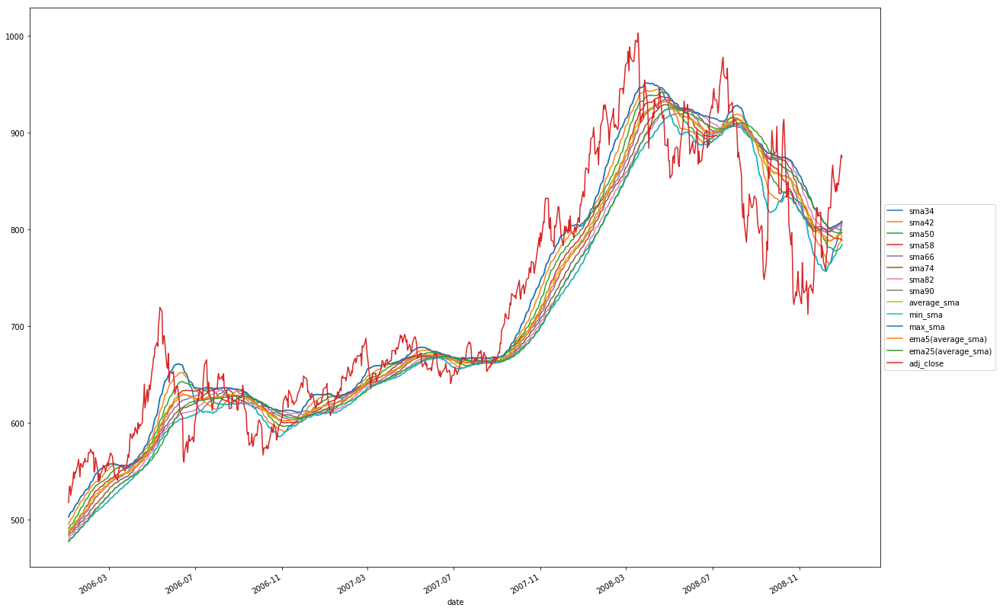

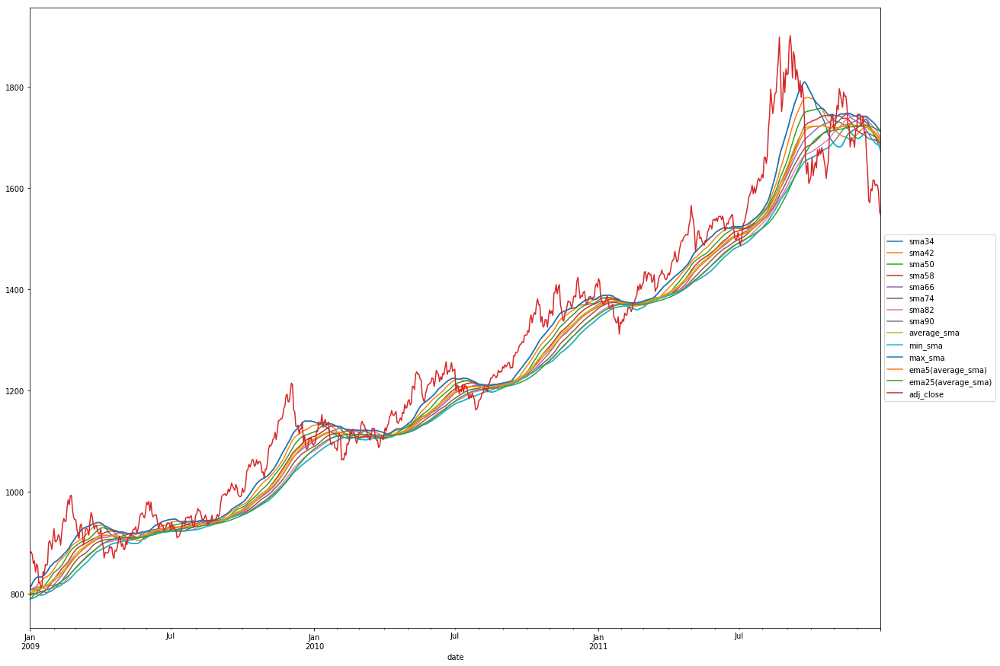

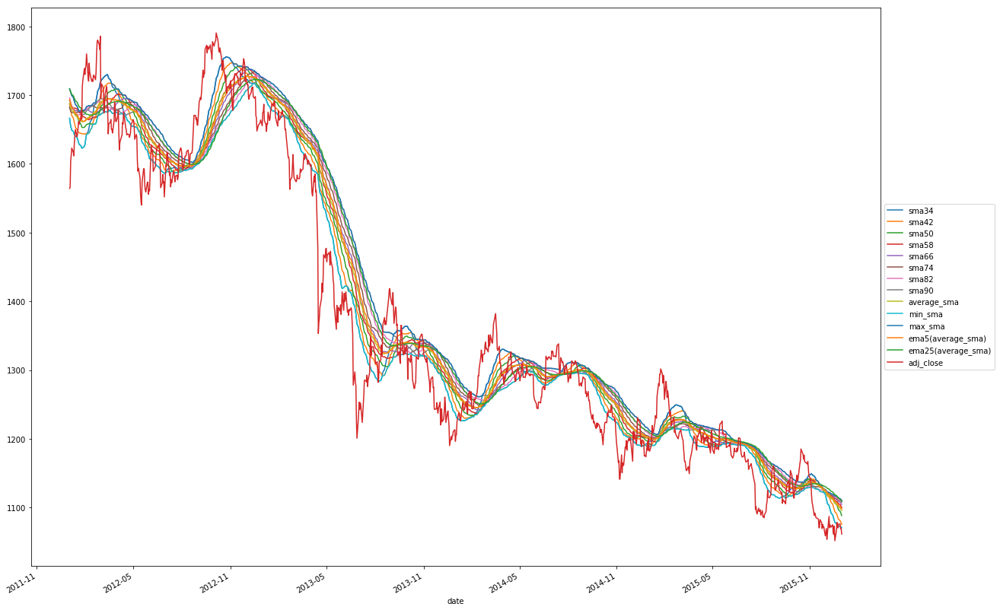

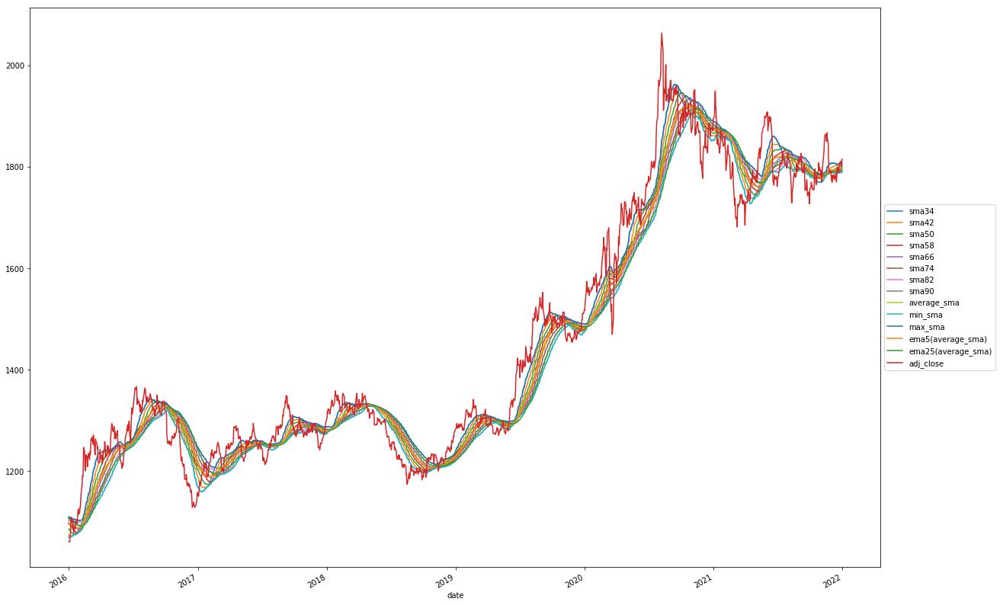

In [25]:
pps =  [('1988','2000'), ('2001','2005'), ('2006', '2008'), ('2009', '2011'), ('2012', '2015'), ('2016', '2021')]

for pp in pps:
    fig, ax = plt.subplots(figsize=(20,15))
    df[pp[0]:pp[1]].plot(ax=ax)
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.show()

In [26]:
pred_sma = pd.DataFrame(1, index=true_ret.index, columns=['buy_and_hold'])
pred_sma['average_sma_cross_ema25(average_sma)'] = sma_all['average_sma'] > sma_all['ema25(average_sma)']
pred_sma['average_sma_cross_ytd'] = sma_all['average_sma'] > sma_all['average_sma'].shift()
pred_sma['average_sma_cross_ema5(average_sma)'] = sma_all['average_sma'] > sma_all['ema5(average_sma)']
pred_sma['close_cross_average_sma'] = price.shift()[start:end] > sma_all['average_sma']
pred_sma['fast3sma_cross_average_sma'] = (sma_all['sma34'] > sma_all['average_sma']) & (sma_all['sma42'] > sma_all['average_sma']) & (sma_all['sma50'] > sma_all['average_sma'])
pred_sma['close_cross_min_sma'] = price.shift()[start:end] > sma_all['min_sma']
pred_sma['close_cross_max_sma'] = price.shift()[start:end] > sma_all['max_sma']
pred_sma.shape

(9612, 8)

In [27]:
pred_sma['average_sma_cross_ema25(average_sma)2'] = sma_all['average_sma'] < sma_all['ema25(average_sma)']
pred_sma['average_sma_cross_ytd2'] = sma_all['average_sma'] < sma_all['average_sma'].shift()
pred_sma['average_sma_cross_ema5(average_sma)2'] = sma_all['average_sma'] < sma_all['ema5(average_sma)']
pred_sma['close_cross_average_sma2'] = price.shift()[start:end] < sma_all['average_sma']
pred_sma['fast3sma_cross_average_sma2'] = (sma_all['sma34'] < sma_all['average_sma']) & (sma_all['sma42'] < sma_all['average_sma']) & (sma_all['sma50'] < sma_all['average_sma'])
pred_sma['close_cross_min_sma2'] = price.shift()[start:end] < sma_all['min_sma']
pred_sma['close_cross_max_sma2'] = price.shift()[start:end] < sma_all['max_sma']
pred_sma = pred_sma.astype(int)

In [79]:
proba_sma = pd.DataFrame(1, columns=pred_sma.columns, index=pred_sma.index)

,buy_and_hold,average_sma_cross_ema25(average_sma),average_sma_cross_ytd,average_sma_cross_ema5(average_sma),close_cross_average_sma,fast3sma_cross_average_sma,close_cross_min_sma,close_cross_max_sma,average_sma_cross_ema25(average_sma)2,average_sma_cross_ytd2,average_sma_cross_ema5(average_sma)2,close_cross_average_sma2,fast3sma_cross_average_sma2,close_cross_min_sma2,close_cross_max_sma2
date,,,,,,,,,,,,,,,
1985-01-02,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
1985-01-03,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
1985-01-04,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
1985-01-07,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
1985-01-08,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-27,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
2021-12-28,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
2021-12-29,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1


In [28]:
ret_sma = pred_sma.multiply(true_ret, 0)
ret_sma.shape

(9612, 15)

'1985-01-02 00:00:00 to 2021-12-31 00:00:00'

,highlight_ratio,flip_ratio,accu,prec,mse
average_sma_cross_ytd,0.523616,0.058995,0.495422,0.511822,1.255792
average_sma_cross_ema25(average_sma),0.536517,0.023203,0.499168,0.515028,1.254339
average_sma_cross_ema25(average_sma)2,0.449854,0.027573,0.487203,0.504625,1.246587
average_sma_cross_ytd2,0.462651,0.064093,0.491053,0.508658,1.244941
average_sma_cross_ema5(average_sma)2,0.460258,0.036937,0.489700,0.507233,1.244212
fast3sma_cross_average_sma2,0.362360,0.029237,0.492301,0.512776,1.246819
close_cross_max_sma2,0.605597,0.087504,0.497919,0.512283,1.237722
close_cross_average_sma2,0.479089,0.082510,0.501248,0.519001,1.241683
close_cross_min_sma2,0.355389,0.083342,0.499688,0.523419,1.246442


,annual_return,sharpe_ratio,max_drawdown,avg_drawdown,return/avgdd
buy_and_hold,0.047776,0.378081,-0.493126,-0.224901,0.212431
average_sma_cross_ytd,0.015721,0.190126,-0.439129,-0.192701,0.081581
average_sma_cross_ema25(average_sma),0.017561,0.205399,-0.464628,-0.229669,0.076461
average_sma_cross_ema25(average_sma)2,0.029694,0.344755,-0.329053,-0.071769,0.413744
average_sma_cross_ytd2,0.031806,0.366158,-0.324783,-0.115089,0.276359
average_sma_cross_ema5(average_sma)2,0.032750,0.375857,-0.325258,-0.111720,0.293140
fast3sma_cross_average_sma2,0.030309,0.377717,-0.326912,-0.079189,0.382747
close_cross_max_sma2,0.039365,0.395966,-0.370994,-0.132841,0.296335
close_cross_average_sma2,0.035742,0.398482,-0.318486,-0.102077,0.350151
close_cross_min_sma2,0.031237,0.406016,-0.263213,-0.054445,0.573745


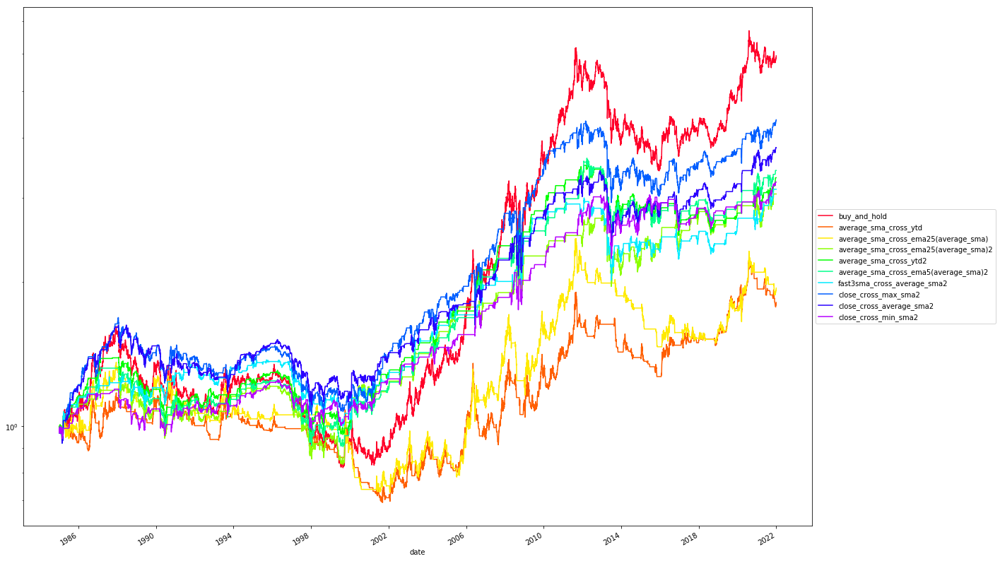

'1988-01-04 00:00:00 to 2000-12-29 00:00:00'

,highlight_ratio,flip_ratio,accu,prec,mse
average_sma_cross_ytd,0.335602,0.052694,0.489198,0.465608,1.259982
average_sma_cross_ema25(average_sma),0.335306,0.023979,0.497780,0.478376,1.273012
average_sma_cross_ema25(average_sma)2,0.642202,0.042333,0.479728,0.474654,1.227036
average_sma_cross_ytd2,0.641906,0.073416,0.488310,0.481328,1.240066
average_sma_cross_ema5(average_sma)2,0.638059,0.048549,0.485055,0.478664,1.241359
fast3sma_cross_average_sma2,0.507251,0.042037,0.492157,0.480163,1.231512
close_cross_max_sma2,0.729802,0.085258,0.486239,0.482157,1.250735
close_cross_average_sma2,0.621782,0.084073,0.497780,0.488339,1.245766
close_cross_min_sma2,0.493637,0.101835,0.506363,0.494005,1.234117


,annual_return,sharpe_ratio,max_drawdown,avg_drawdown,return/avgdd
buy_and_hold,-0.042235,-0.283945,-0.481481,-0.272448,-0.155021
average_sma_cross_ytd,-0.030695,-0.323554,-0.390300,-0.181527,-0.169095
average_sma_cross_ema25(average_sma),-0.042752,-0.503839,-0.444755,-0.201985,-0.211657
average_sma_cross_ema25(average_sma)2,0.000539,0.052921,-0.322644,-0.117189,0.004603
average_sma_cross_ytd2,-0.011905,-0.086157,-0.317428,-0.165784,-0.071813
average_sma_cross_ema5(average_sma)2,-0.013085,-0.101256,-0.314415,-0.153173,-0.085428
fast3sma_cross_average_sma2,-0.002613,0.007664,-0.273015,-0.079706,-0.032778
close_cross_max_sma2,-0.022886,-0.188556,-0.370994,-0.211281,-0.108322
close_cross_average_sma2,-0.017261,-0.151924,-0.318486,-0.171725,-0.100516
close_cross_min_sma2,-0.004754,-0.026184,-0.215496,-0.092516,-0.051387


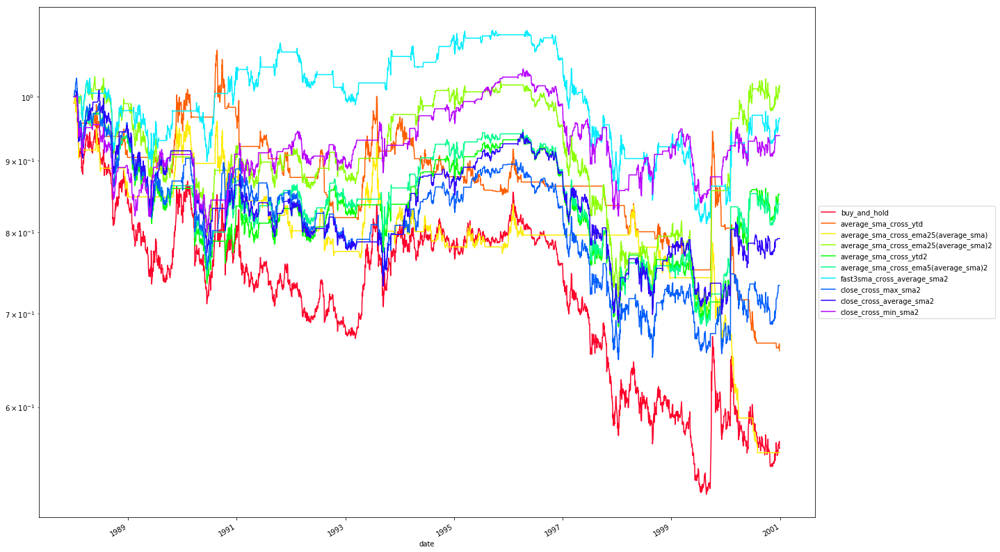

'2001-01-02 00:00:00 to 2005-12-30 00:00:00'

,highlight_ratio,flip_ratio,accu,prec,mse
average_sma_cross_ytd,0.670254,0.067692,0.498078,0.530963,1.261315
average_sma_cross_ema25(average_sma),0.700999,0.034615,0.499616,0.530702,1.262406
average_sma_cross_ema25(average_sma)2,0.282091,0.031538,0.483474,0.547684,1.243015
average_sma_cross_ytd2,0.312836,0.061538,0.485012,0.545455,1.244106
average_sma_cross_ema5(average_sma)2,0.304381,0.036923,0.488855,0.553030,1.238416
fast3sma_cross_average_sma2,0.192160,0.026154,0.479631,0.560000,1.248798
close_cross_max_sma2,0.471945,0.098462,0.502690,0.548860,1.224362
close_cross_average_sma2,0.336664,0.080000,0.493467,0.554795,1.250203
close_cross_min_sma2,0.235972,0.078462,0.494235,0.579805,1.254818


,annual_return,sharpe_ratio,max_drawdown,avg_drawdown,return/avgdd
buy_and_hold,0.132401,0.936292,-0.154450,-0.042569,3.110238
average_sma_cross_ytd,0.050892,0.457753,-0.162595,-0.073082,0.696364
average_sma_cross_ema25(average_sma),0.049441,0.444047,-0.199144,-0.081697,0.605171
average_sma_cross_ema25(average_sma)2,0.079052,1.147660,-0.062374,-0.008173,9.672255
average_sma_cross_ytd2,0.077562,1.098006,-0.078598,-0.005533,14.017403
average_sma_cross_ema5(average_sma)2,0.084609,1.195970,-0.063920,-0.003990,21.205736
fast3sma_cross_average_sma2,0.072518,1.194433,-0.062374,-0.013438,5.396570
close_cross_max_sma2,0.099826,1.043239,-0.094934,-0.011583,8.618149
close_cross_average_sma2,0.069719,0.936187,-0.079720,-0.007450,9.358479
close_cross_min_sma2,0.065232,1.098907,-0.078598,-0.004353,14.984730


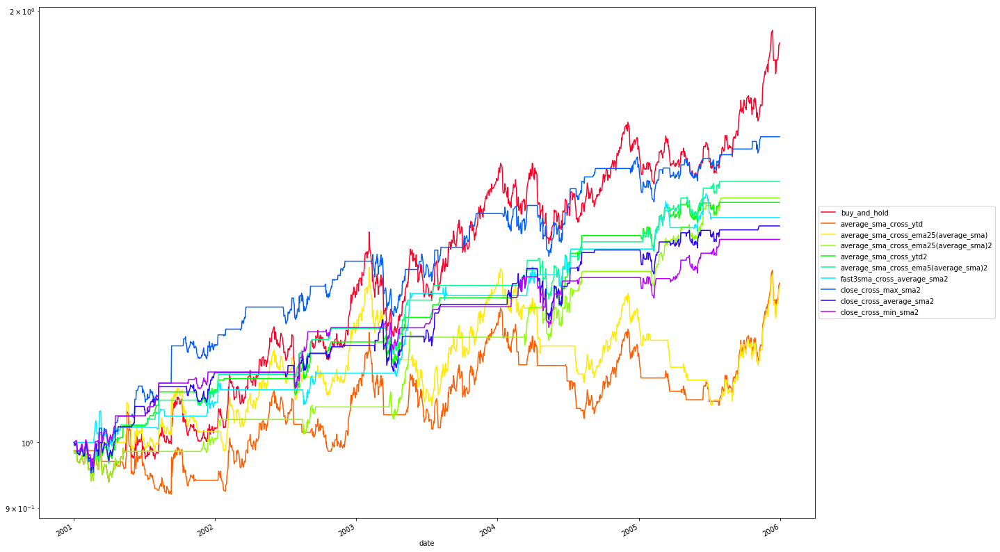

'2006-01-03 00:00:00 to 2008-12-31 00:00:00'

,highlight_ratio,flip_ratio,accu,prec,mse
average_sma_cross_ytd,0.669654,0.064103,0.485275,0.512428,1.269808
average_sma_cross_ema25(average_sma),0.669654,0.023077,0.495519,0.520076,1.247606
average_sma_cross_ema25(average_sma)2,0.323944,0.012821,0.498079,0.545455,1.255222
average_sma_cross_ytd2,0.323944,0.053846,0.508323,0.561265,1.233020
average_sma_cross_ema5(average_sma)2,0.334187,0.030769,0.500640,0.547893,1.234936
fast3sma_cross_average_sma2,0.227913,0.017949,0.499360,0.567416,1.234780
close_cross_max_sma2,0.487836,0.094872,0.503201,0.535433,1.231750
close_cross_average_sma2,0.336748,0.079487,0.508323,0.558935,1.243982
close_cross_min_sma2,0.230474,0.053846,0.494238,0.555556,1.254822


,annual_return,sharpe_ratio,max_drawdown,avg_drawdown,return/avgdd
buy_and_hold,0.186867,0.824008,-0.290117,-0.090528,2.064197
average_sma_cross_ytd,0.049913,0.361562,-0.324277,-0.179866,0.277501
average_sma_cross_ema25(average_sma),0.096455,0.607644,-0.272630,-0.110877,0.869932
average_sma_cross_ema25(average_sma)2,0.082458,0.555887,-0.220799,-0.020873,3.950536
average_sma_cross_ytd2,0.130443,0.822820,-0.163965,-0.014291,9.127359
average_sma_cross_ema5(average_sma)2,0.125917,0.791780,-0.163965,-0.015987,7.876258
fast3sma_cross_average_sma2,0.129528,0.891391,-0.220799,-0.021876,5.921037
close_cross_max_sma2,0.129758,0.757765,-0.185648,-0.021189,6.123769
close_cross_average_sma2,0.106574,0.692220,-0.178738,-0.017782,5.993332
close_cross_min_sma2,0.087827,0.666799,-0.164142,-0.012838,6.841060


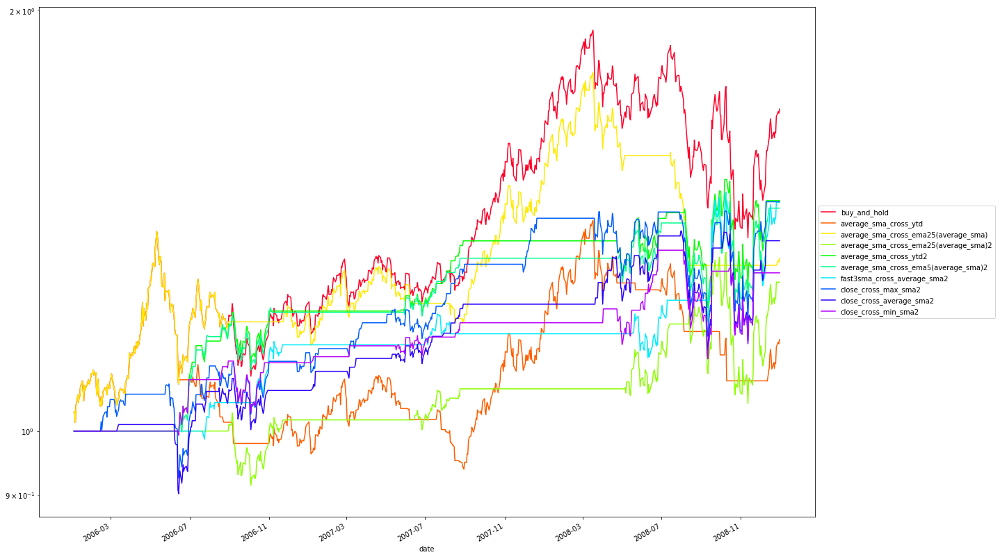

'2009-01-01 00:00:00 to 2011-12-30 00:00:00'

,highlight_ratio,flip_ratio,accu,prec,mse
average_sma_cross_ytd,0.835038,0.052497,0.534527,0.554364,1.235375
average_sma_cross_ema25(average_sma),0.933504,0.014085,0.546036,0.554795,1.197814
average_sma_cross_ema25(average_sma)2,0.065217,0.011524,0.452685,0.568627,1.308969
average_sma_cross_ytd2,0.163683,0.049936,0.464194,0.562500,1.271408
average_sma_cross_ema5(average_sma)2,0.166240,0.026889,0.466752,0.569231,1.259281
fast3sma_cross_average_sma2,0.109974,0.020487,0.461637,0.581395,1.294576
close_cross_max_sma2,0.368286,0.088348,0.484655,0.555556,1.249334
close_cross_average_sma2,0.237852,0.070423,0.474425,0.564516,1.273183
close_cross_min_sma2,0.139386,0.060179,0.468031,0.587156,1.260279


,annual_return,sharpe_ratio,max_drawdown,avg_drawdown,return/avgdd
buy_and_hold,0.203590,1.084884,-0.186157,-0.044423,4.583029
average_sma_cross_ytd,0.119771,0.739584,-0.157943,-0.074296,1.612088
average_sma_cross_ema25(average_sma),0.182025,1.008331,-0.153481,-0.053418,3.407583
average_sma_cross_ema25(average_sma)2,0.018244,0.456307,-0.057918,-0.002469,7.389791
average_sma_cross_ytd2,0.074854,1.055450,-0.096079,-0.002240,33.414707
average_sma_cross_ema5(average_sma)2,0.094178,1.267110,-0.072015,-0.002513,37.481095
fast3sma_cross_average_sma2,0.039824,0.803820,-0.064622,-0.011586,3.437309
close_cross_max_sma2,0.106448,0.959116,-0.097088,-0.009381,11.347371
close_cross_average_sma2,0.070470,0.810949,-0.096079,-0.003832,18.388496
close_cross_min_sma2,0.092960,1.340523,-0.071776,-0.001430,64.997722


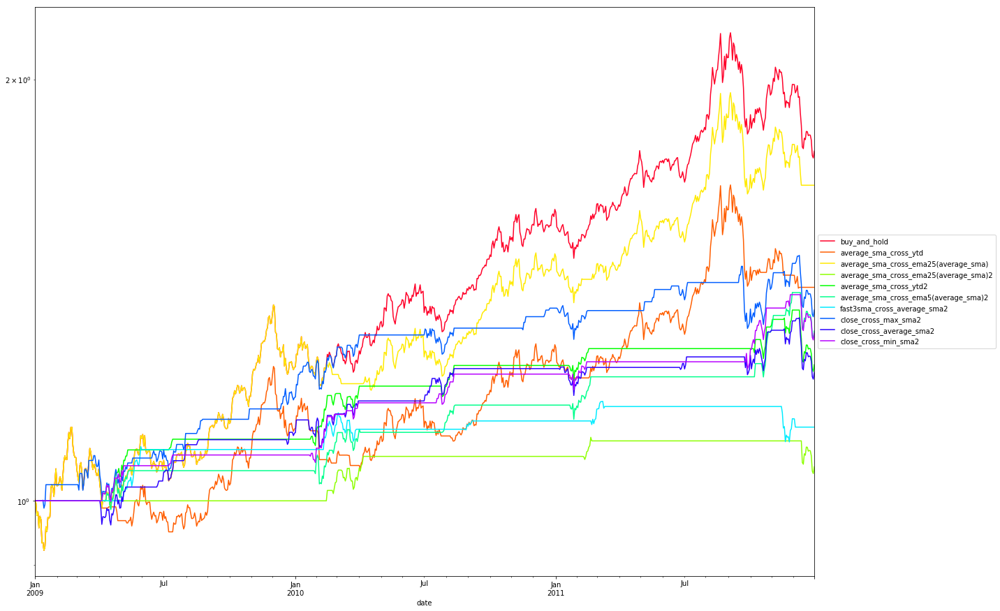

'2012-01-02 00:00:00 to 2015-12-31 00:00:00'

,highlight_ratio,flip_ratio,accu,prec,mse
average_sma_cross_ytd,0.312860,0.049952,0.486564,0.453988,1.260697
average_sma_cross_ema25(average_sma),0.296545,0.013449,0.474088,0.430421,1.285218
average_sma_cross_ema25(average_sma)2,0.702495,0.015370,0.524952,0.506831,1.214805
average_sma_cross_ytd2,0.686180,0.051873,0.512476,0.497902,1.239326
average_sma_cross_ema5(average_sma)2,0.697697,0.021134,0.512476,0.497937,1.246080
fast3sma_cross_average_sma2,0.546065,0.018252,0.514395,0.499121,1.249359
close_cross_max_sma2,0.791747,0.046110,0.500960,0.490909,1.257192
close_cross_average_sma2,0.692898,0.073007,0.517274,0.501385,1.230013
close_cross_min_sma2,0.522073,0.107589,0.542226,0.525735,1.196814


,annual_return,sharpe_ratio,max_drawdown,avg_drawdown,return/avgdd
buy_and_hold,-0.089555,-0.494734,-0.412616,-0.229167,-0.390783
average_sma_cross_ytd,-0.055725,-0.668733,-0.255167,-0.123972,-0.449500
average_sma_cross_ema25(average_sma),-0.085199,-1.054781,-0.333602,-0.155667,-0.547317
average_sma_cross_ema25(average_sma)2,-0.004761,0.037024,-0.290379,-0.124646,-0.038197
average_sma_cross_ytd2,-0.035826,-0.187239,-0.324783,-0.150926,-0.237372
average_sma_cross_ema5(average_sma)2,-0.044056,-0.250980,-0.325258,-0.170183,-0.258873
fast3sma_cross_average_sma2,-0.046818,-0.302729,-0.326912,-0.159810,-0.292957
close_cross_max_sma2,-0.058586,-0.337183,-0.324530,-0.175956,-0.332959
close_cross_average_sma2,-0.024010,-0.102888,-0.304074,-0.135594,-0.177072
close_cross_min_sma2,0.020541,0.224085,-0.263213,-0.074132,0.277084


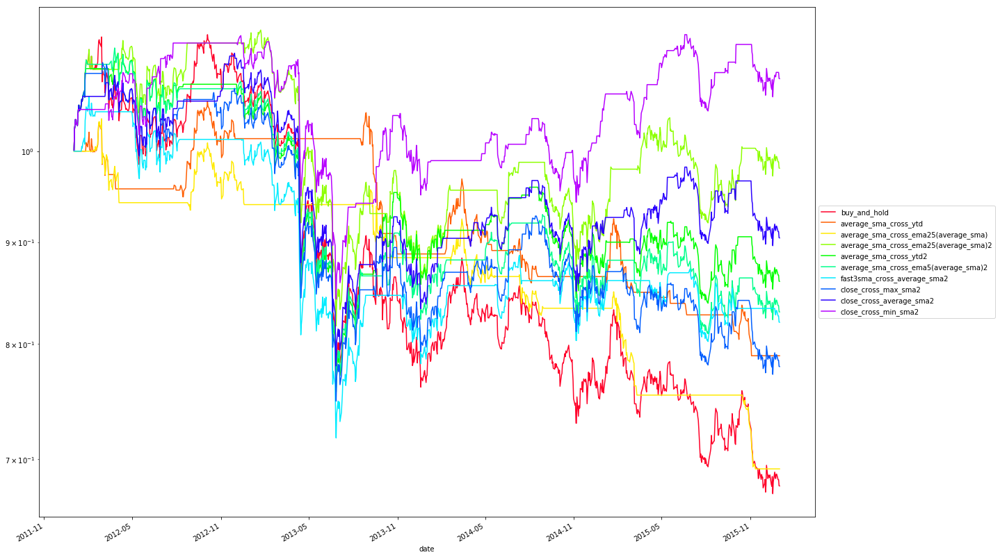

'2016-01-01 00:00:00 to 2021-12-31 00:00:00'

,highlight_ratio,flip_ratio,accu,prec,mse
average_sma_cross_ytd,0.615483,0.046735,0.506078,0.534304,1.236985
average_sma_cross_ema25(average_sma),0.630838,0.012164,0.498401,0.527383,1.248010
average_sma_cross_ema25(average_sma)2,0.369162,0.012164,0.501599,0.551127,1.254802
average_sma_cross_ytd2,0.384517,0.046735,0.493922,0.539101,1.265827
average_sma_cross_ema5(average_sma)2,0.374280,0.021127,0.496481,0.543590,1.256920
fast3sma_cross_average_sma2,0.326296,0.016005,0.508637,0.568627,1.248710
close_cross_max_sma2,0.551504,0.072343,0.506078,0.538283,1.238768
close_cross_average_sma2,0.417147,0.068502,0.504798,0.549080,1.244737
close_cross_min_sma2,0.298145,0.058259,0.490723,0.545064,1.277827


,annual_return,sharpe_ratio,max_drawdown,avg_drawdown,return/avgdd
buy_and_hold,0.091659,0.718013,-0.185126,-0.066784,1.372467
average_sma_cross_ytd,0.059170,0.567001,-0.228287,-0.059465,0.995050
average_sma_cross_ema25(average_sma),0.046572,0.456038,-0.189801,-0.073798,0.631068
average_sma_cross_ema25(average_sma)2,0.043081,0.622272,-0.137538,-0.030542,1.410578
average_sma_cross_ytd2,0.030674,0.443801,-0.142504,-0.044416,0.690600
average_sma_cross_ema5(average_sma)2,0.040608,0.578358,-0.134805,-0.033021,1.229751
fast3sma_cross_average_sma2,0.050102,0.741085,-0.134805,-0.029844,1.678776
close_cross_max_sma2,0.059413,0.674376,-0.150822,-0.032717,1.816005
close_cross_average_sma2,0.053856,0.707029,-0.134716,-0.032837,1.640131
close_cross_min_sma2,0.018236,0.313727,-0.137994,-0.043813,0.416224


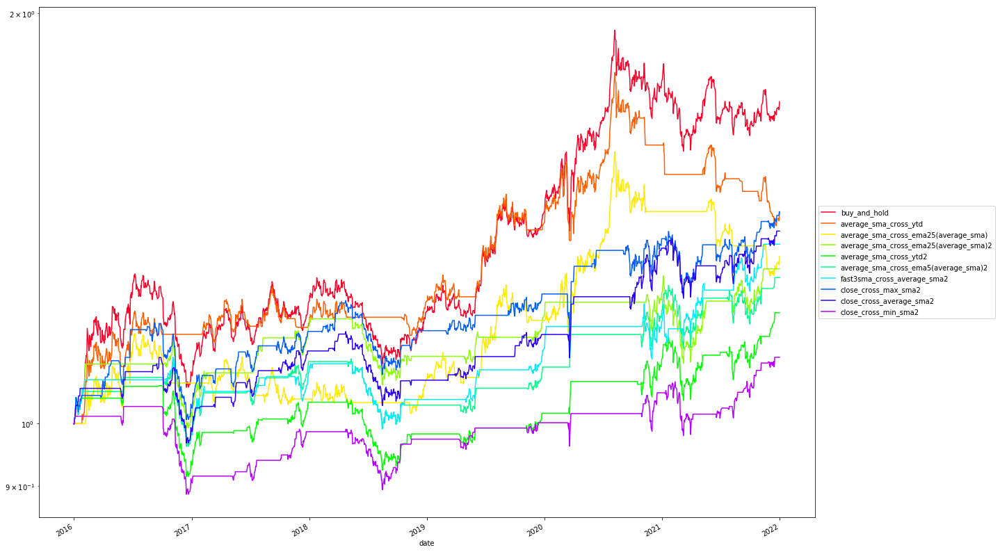

['buy_and_hold',
 'average_sma_cross_ytd',
 'average_sma_cross_ema25(average_sma)',
 'average_sma_cross_ema25(average_sma)2',
 'average_sma_cross_ytd2',
 'average_sma_cross_ema5(average_sma)2',
 'fast3sma_cross_average_sma2',
 'close_cross_max_sma2',
 'close_cross_average_sma2',
 'close_cross_min_sma2']

In [67]:
strategy_list_sel = print_all_result(ret_sma)

print_all_result(ret_sma['1988':'2000'], proba_sma, strategy_list_sel=strategy_list_sel)
print_all_result(ret_sma['2001':'2005'], strategy_list_sel=strategy_list_sel)
print_all_result(ret_sma['2006':'2008'], strategy_list_sel=strategy_list_sel)
print_all_result(ret_sma['2009':'2011'], strategy_list_sel=strategy_list_sel)
print_all_result(ret_sma['2012':'2015'], strategy_list_sel=strategy_list_sel)
print_all_result(ret_sma['2016':'2021'], strategy_list_sel=strategy_list_sel)

In [29]:
pred_all = pd.DataFrame()
proba_all = pd.DataFrame()

In [30]:
cases = ['vote_c3ema_rollM_lookback5_top1']
cross3ema_nofuture = pd.read_csv('output_others/prob_sub_cross_3ema_rolling_extend_ll.csv', index_col=0)
cross3ema_nofuture.index = pd.to_datetime(cross3ema_nofuture.index)
cross3ema_nofuture = cross3ema_nofuture[start:end]
# cross3ema_nofuture.columns = ["{} (no future)".format(col) for col in cross3ema_nofuture.columns]
cross3ema_nofuture = cross3ema_nofuture[cases]
pred_all = pd.concat([pred_all, cross3ema_nofuture], axis=1)

cross3ema_nofuture_proba = pd.read_csv('output_others/prob_sub_cross_3ema_rolling_extend_ll.csv', index_col=0)
cross3ema_nofuture_proba.index = pd.to_datetime(cross3ema_nofuture_proba.index)
cross3ema_nofuture_proba = cross3ema_nofuture_proba[start:end]
# cross3ema_nofuture.columns = ["{} (no future)".format(col) for col in cross3ema_nofuture.columns]
cross3ema_nofuture_proba = cross3ema_nofuture_proba[cases]
proba_all = pd.concat([proba_all, cross3ema_nofuture_proba], axis=1)

In [31]:
cases = ['vote_lookbackA_rollA_top20']
vote_lookback_nofuture = pd.read_csv('output_others/vote_lookback_without_c3ema.csv', index_col=0)
vote_lookback_nofuture.index = pd.to_datetime(vote_lookback_nofuture.index)
vote_lookback_nofuture = vote_lookback_nofuture[start:end]
vote_lookback_nofuture = vote_lookback_nofuture[cases]
pred_all = pd.concat([pred_all, vote_lookback_nofuture], axis=1)

vote_lookback_nofuture_proba = pd.read_csv('output_others/vote_lookback_without_c3ema_proba.csv', index_col=0)
vote_lookback_nofuture_proba.index = pd.to_datetime(vote_lookback_nofuture_proba.index)
vote_lookback_nofuture_proba = vote_lookback_nofuture_proba[start:end]
vote_lookback_nofuture_proba = vote_lookback_nofuture_proba[cases]
proba_all = pd.concat([proba_all, vote_lookback_nofuture_proba], axis=1)

In [32]:
proba_all = proba_all.fillna(1.0)
pred_all = pred_all.fillna(1.0)

In [33]:
pred_all['buy_and_hold'] = 1
pred_all['true_up'] = true_up.astype(int)
proba_all['buy_and_hold'] = 1
proba_all['true_up'] = 1

In [34]:
combine_cases = ['vote_lookbackA_rollA_top20', 'vote_c3ema_rollM_lookback5_top1']
proba_all['equal_weight_combine'] = proba_all[combine_cases].mean(axis=1)
pred_all['equal_weight_combine'] = (proba_all['equal_weight_combine']>=0.5).astype(int)
proba_all['biased1_combine'] = pred_all[combine_cases].mean(axis=1)
proba_all['biased0_combine'] = pred_all[combine_cases].mean(axis=1)
pred_all['biased1_combine'] = (proba_all['biased1_combine'] != 0).astype(int)
pred_all['biased0_combine'] = (proba_all['biased0_combine'] == 1).astype(int)

recal_number = pd.DataFrame()
total_number = 0
for case in combine_cases:
    case_number = case.split("_")[-1]
    case_number = case_number.replace('top', "")
    case_number = int(case_number)
    total_number += case_number
    recal_number[case] = proba_all[case] * case_number

proba_all['weight_combine'] = recal_number[combine_cases].sum(axis=1) / total_number
pred_all['weight_combine'] = (proba_all['weight_combine']>=0.5).astype(int)

In [35]:
def smooth_pred_by_flag(pred, flag):
    flag = flag.reindex(pred.index)
    
    """
    p_smooth = pred.copy()
    i_prev = pred.index[0]
    for i in pred.index[1:]:
        if not flag[i]:
            p_smooth[i] = p_smooth[i_prev]
        i_prev = i
    """
    #p_smooth = pd.Series(np.nan, pred.index)
    #p_smooth.loc[flag.values] = p.loc[flag.values]
    
    
    p_smooth = pred*(flag.apply(lambda x: np.nan if not x else 1))
    
    p_smooth[pred.index[0]] = pred[pred.index[0]]
    p_smooth = p_smooth.ffill()
    
    return p_smooth

def smooth_pred_by_flag_with_proba(pred, proba, flag):
    flag = flag.reindex(pred.index)
    
    """
    p_smooth = pred.copy()
    i_prev = pred.index[0]
    for i in pred.index[1:]:
        if not flag[i]:
            p_smooth[i] = p_smooth[i_prev]
        i_prev = i
    """
    #p_smooth = pd.Series(np.nan, pred.index)
    #p_smooth.loc[flag.values] = p.loc[flag.values]
    
    
    p_smooth = pred*(flag.apply(lambda x: np.nan if not x else 1))
    
    p_smooth[pred.index[0]] = pred[pred.index[0]]
    p_smooth = p_smooth.ffill()
    
    proba_smooth = pd.concat([proba, flag], axis=1).mean(axis=1)
    
    return p_smooth

## vote_lookbackA_rollA_top20 + pred_sma_cross

In [68]:
cases = ['vote_lookbackA_rollA_top20']

In [69]:
pred_case1 = pred_all[cases]

for base_case in pred_case1.columns:
    for s in pred_sma_cross.columns:
        if s == 'buy_and_hold':
            continue
        p_smooth = smooth_pred_by_flag(pred_case1[base_case], pred_sma_cross[s])
        pred_case1[base_case+'_smooth_'+s] = p_smooth
    
pred_case1['buy_and_hold'] = 1
pred_case1

,vote_lookbackA_rollA_top20,vote_lookbackA_rollA_top20_smooth_cross_sma_34_42,vote_lookbackA_rollA_top20_smooth_cross_sma_34_50,vote_lookbackA_rollA_top20_smooth_cross_sma_34_58,vote_lookbackA_rollA_top20_smooth_cross_sma_34_66,vote_lookbackA_rollA_top20_smooth_cross_sma_34_74,vote_lookbackA_rollA_top20_smooth_cross_sma_34_82,vote_lookbackA_rollA_top20_smooth_cross_sma_34_90,vote_lookbackA_rollA_top20_smooth_cross_sma_42_50,vote_lookbackA_rollA_top20_smooth_cross_sma_42_58,...,vote_lookbackA_rollA_top20_smooth_cross_sma_58_74,vote_lookbackA_rollA_top20_smooth_cross_sma_58_82,vote_lookbackA_rollA_top20_smooth_cross_sma_58_90,vote_lookbackA_rollA_top20_smooth_cross_sma_66_74,vote_lookbackA_rollA_top20_smooth_cross_sma_66_82,vote_lookbackA_rollA_top20_smooth_cross_sma_66_90,vote_lookbackA_rollA_top20_smooth_cross_sma_74_82,vote_lookbackA_rollA_top20_smooth_cross_sma_74_90,vote_lookbackA_rollA_top20_smooth_cross_sma_82_90,buy_and_hold
1985-01-02,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1
1985-01-03,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1
1985-01-04,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1
1985-01-07,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1
1985-01-08,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-27,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1
2021-12-28,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1
2021-12-29,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1
2021-12-30,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1


In [70]:
ret_pred_case1 = pred_case1.multiply(true_ret, 0)
ret_pred_case1.shape

(9612, 30)

'1985-01-02 00:00:00 to 2021-12-31 00:00:00'

,highlight_ratio,flip_ratio,accu,prec,mse
vote_lookbackA_rollA_top20_smooth_cross_sma_42_58,0.538910,0.080637,0.492197,0.508494,1.252695
vote_lookbackA_rollA_top20_smooth_cross_sma_34_66,0.538390,0.075642,0.496879,0.512850,1.246041
vote_lookbackA_rollA_top20_smooth_cross_sma_50_58,0.515918,0.079180,0.493550,0.510184,1.246033
vote_lookbackA_rollA_top20_smooth_cross_sma_34_42,0.523200,0.080221,0.496255,0.512627,1.244797
vote_lookbackA_rollA_top20_smooth_cross_sma_74_82,0.551914,0.081053,0.497503,0.513101,1.242571
vote_lookbackA_rollA_top20_smooth_cross_sma_42_66,0.541927,0.078972,0.493758,0.509887,1.243576
vote_lookbackA_rollA_top20_smooth_cross_sma_34_58,0.514565,0.078348,0.500936,0.517388,1.242582
vote_lookbackA_rollA_top20_smooth_cross_sma_50_90,0.577403,0.078348,0.498648,0.513514,1.240159
vote_lookbackA_rollA_top20_smooth_cross_sma_34_50,0.512068,0.078764,0.502809,0.519301,1.239605
vote_lookbackA_rollA_top20_smooth_cross_sma_42_50,0.510196,0.080845,0.499688,0.516313,1.239118


,annual_return,sharpe_ratio,max_drawdown,avg_drawdown,return/avgdd
buy_and_hold,0.047776,0.378081,-0.493126,-0.224901,0.212431
vote_lookbackA_rollA_top20_smooth_cross_sma_42_58,0.020254,0.232384,-0.463916,-0.200594,0.100969
vote_lookbackA_rollA_top20_smooth_cross_sma_34_66,0.028476,0.299901,-0.397989,-0.190319,0.149622
vote_lookbackA_rollA_top20_smooth_cross_sma_50_58,0.029266,0.318276,-0.455791,-0.175515,0.166741
vote_lookbackA_rollA_top20_smooth_cross_sma_34_42,0.030547,0.324723,-0.408140,-0.172779,0.176799
vote_lookbackA_rollA_top20_smooth_cross_sma_74_82,0.032594,0.329748,-0.422396,-0.167713,0.194345
vote_lookbackA_rollA_top20_smooth_cross_sma_42_66,0.031902,0.333010,-0.426544,-0.168699,0.189105
vote_lookbackA_rollA_top20_smooth_cross_sma_34_58,0.033287,0.346938,-0.423435,-0.164455,0.202409
vote_lookbackA_rollA_top20_smooth_cross_sma_50_90,0.035433,0.349015,-0.459793,-0.168755,0.209967
vote_lookbackA_rollA_top20_smooth_cross_sma_34_50,0.037262,0.384621,-0.347668,-0.129533,0.287661


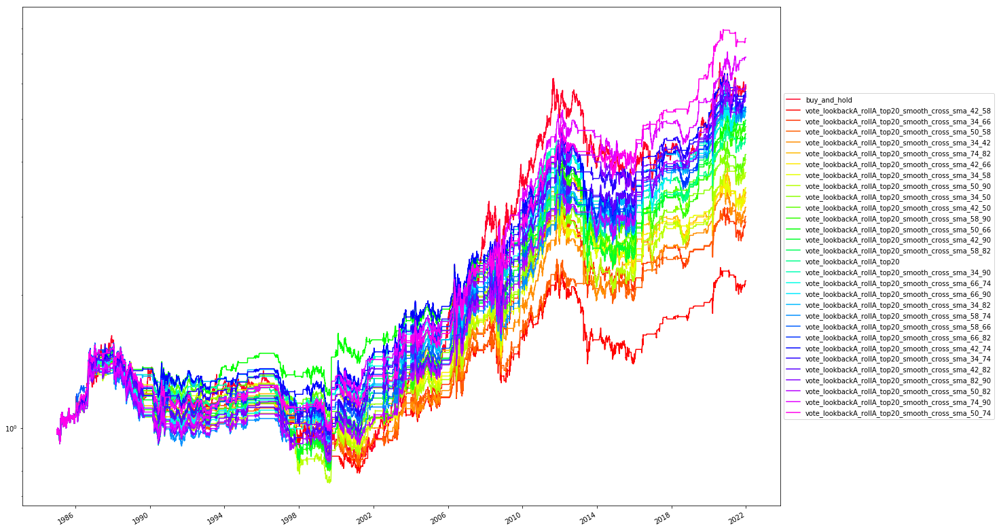

==================================== buy_and_hold


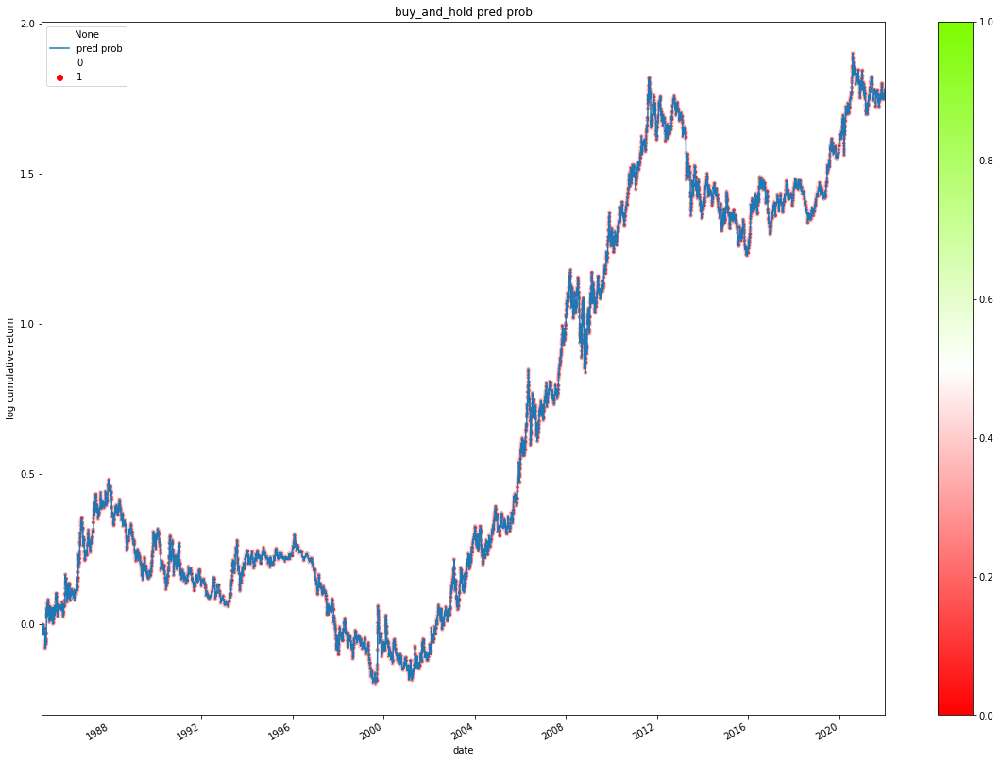

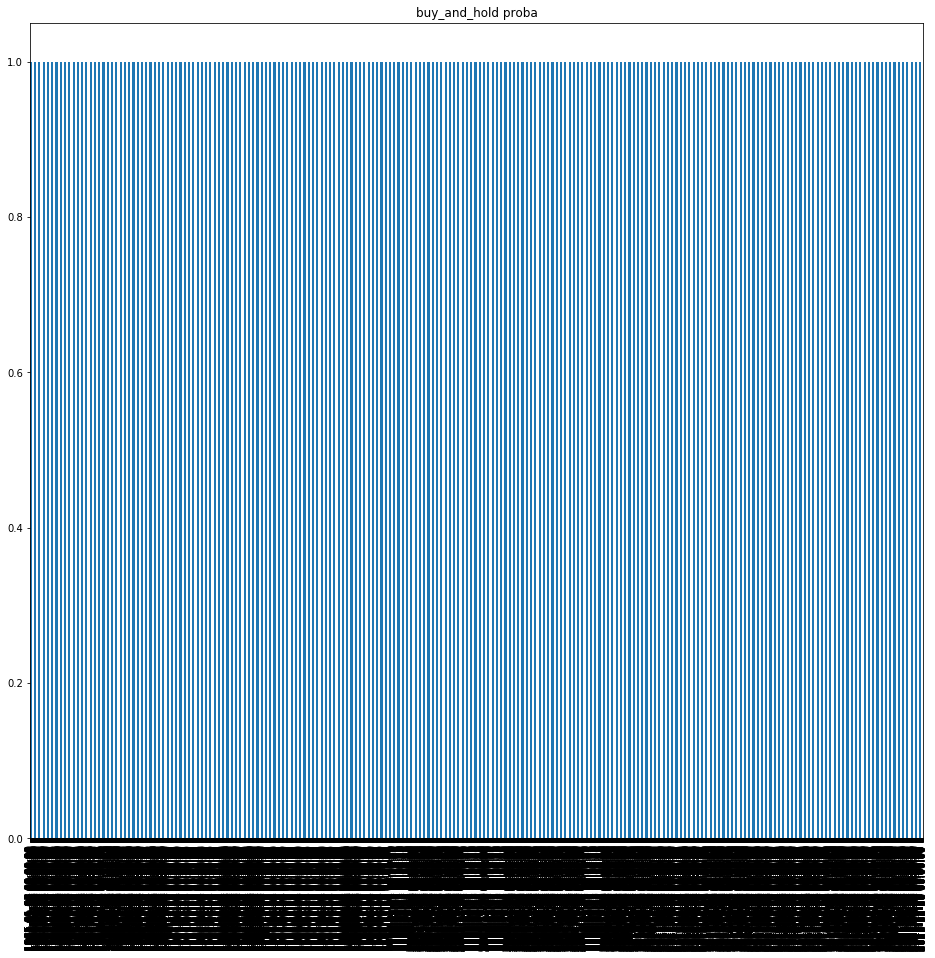

==================================== vote_lookbackA_rollA_top20


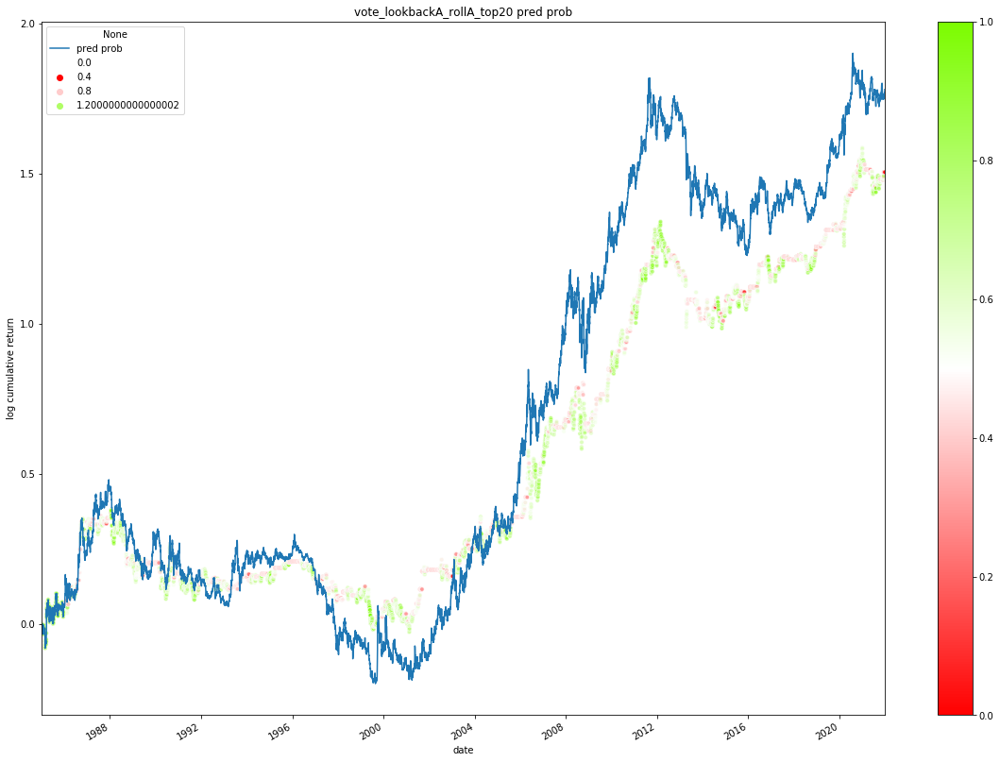

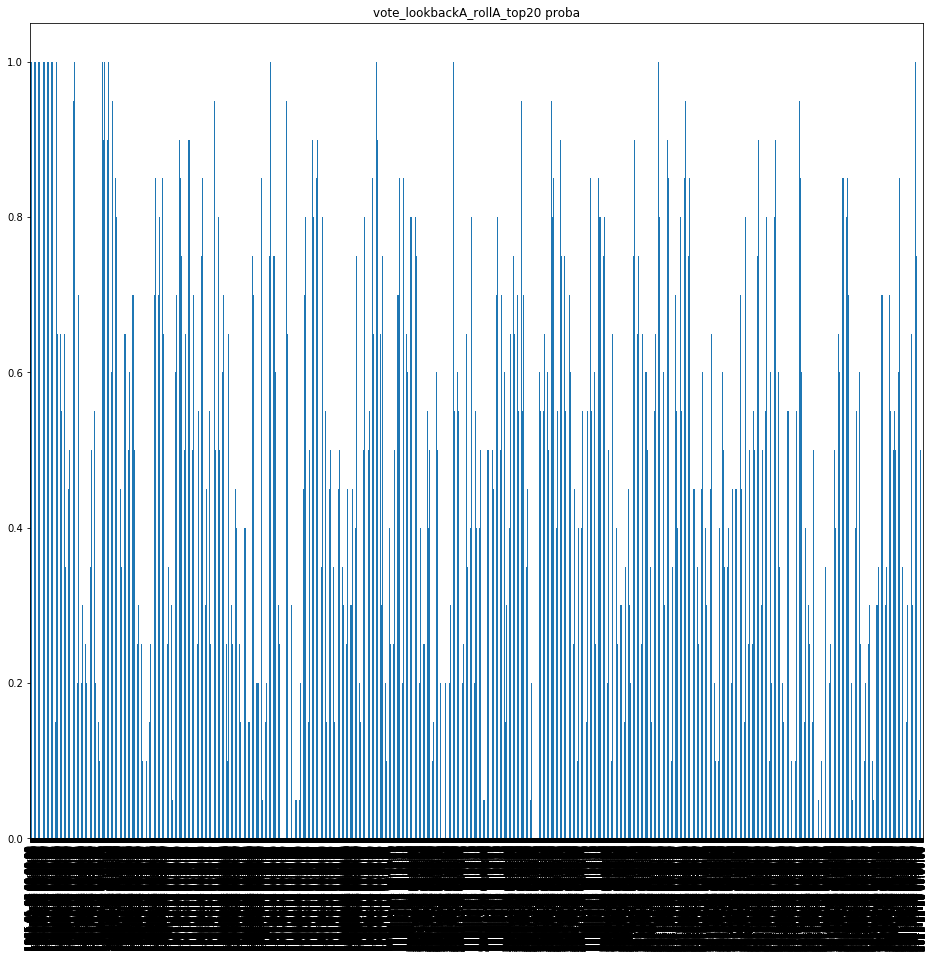

'1988-01-04 00:00:00 to 2000-12-29 00:00:00'

,highlight_ratio,flip_ratio,accu,prec,mse
vote_lookbackA_rollA_top20_smooth_cross_sma_42_58,0.573542,0.071936,0.479728,0.471620,1.268404
vote_lookbackA_rollA_top20_smooth_cross_sma_34_66,0.503107,0.067496,0.487422,0.475294,1.258466
vote_lookbackA_rollA_top20_smooth_cross_sma_50_58,0.552530,0.070160,0.480024,0.470809,1.267718
vote_lookbackA_rollA_top20_smooth_cross_sma_34_42,0.536549,0.074008,0.478840,0.468836,1.261560
vote_lookbackA_rollA_top20_smooth_cross_sma_74_82,0.547203,0.070752,0.490086,0.479719,1.243953
vote_lookbackA_rollA_top20_smooth_cross_sma_42_66,0.557857,0.069568,0.480024,0.471088,1.263672
vote_lookbackA_rollA_top20_smooth_cross_sma_34_58,0.516721,0.069272,0.492749,0.481100,1.263458
vote_lookbackA_rollA_top20_smooth_cross_sma_50_90,0.590707,0.064239,0.482687,0.474950,1.256210
vote_lookbackA_rollA_top20_smooth_cross_sma_34_50,0.522344,0.071640,0.489494,0.478187,1.254263
vote_lookbackA_rollA_top20_smooth_cross_sma_42_50,0.542764,0.074600,0.488606,0.478190,1.255391


,annual_return,sharpe_ratio,max_drawdown,avg_drawdown,return/avgdd
buy_and_hold,-0.042235,-0.283945,-0.481481,-0.272448,-0.155021
vote_lookbackA_rollA_top20_smooth_cross_sma_42_58,-0.038910,-0.412163,-0.449394,-0.248876,-0.156342
vote_lookbackA_rollA_top20_smooth_cross_sma_34_66,-0.028831,-0.325834,-0.369113,-0.237699,-0.121293
vote_lookbackA_rollA_top20_smooth_cross_sma_50_58,-0.037831,-0.430321,-0.436715,-0.287526,-0.131575
vote_lookbackA_rollA_top20_smooth_cross_sma_34_42,-0.031846,-0.361468,-0.383264,-0.232877,-0.136750
vote_lookbackA_rollA_top20_smooth_cross_sma_74_82,-0.015467,-0.132231,-0.334838,-0.222257,-0.069589
vote_lookbackA_rollA_top20_smooth_cross_sma_42_66,-0.034067,-0.375815,-0.406442,-0.273648,-0.124494
vote_lookbackA_rollA_top20_smooth_cross_sma_34_58,-0.033734,-0.380649,-0.407284,-0.244598,-0.137918
vote_lookbackA_rollA_top20_smooth_cross_sma_50_90,-0.028347,-0.238975,-0.458413,-0.269920,-0.105019
vote_lookbackA_rollA_top20_smooth_cross_sma_34_50,-0.024796,-0.273241,-0.329884,-0.200367,-0.123754


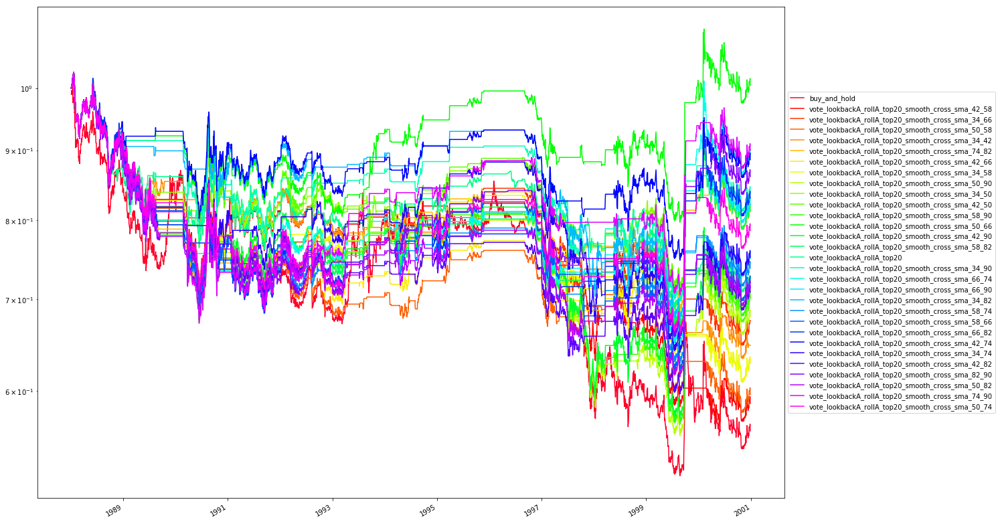

==================================== buy_and_hold


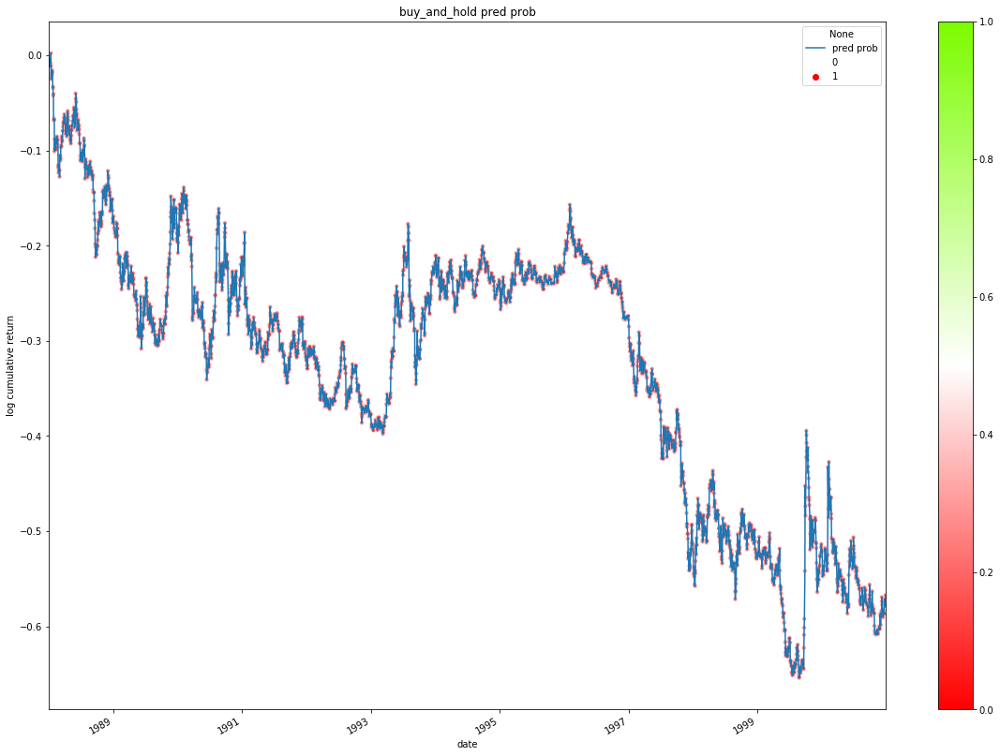

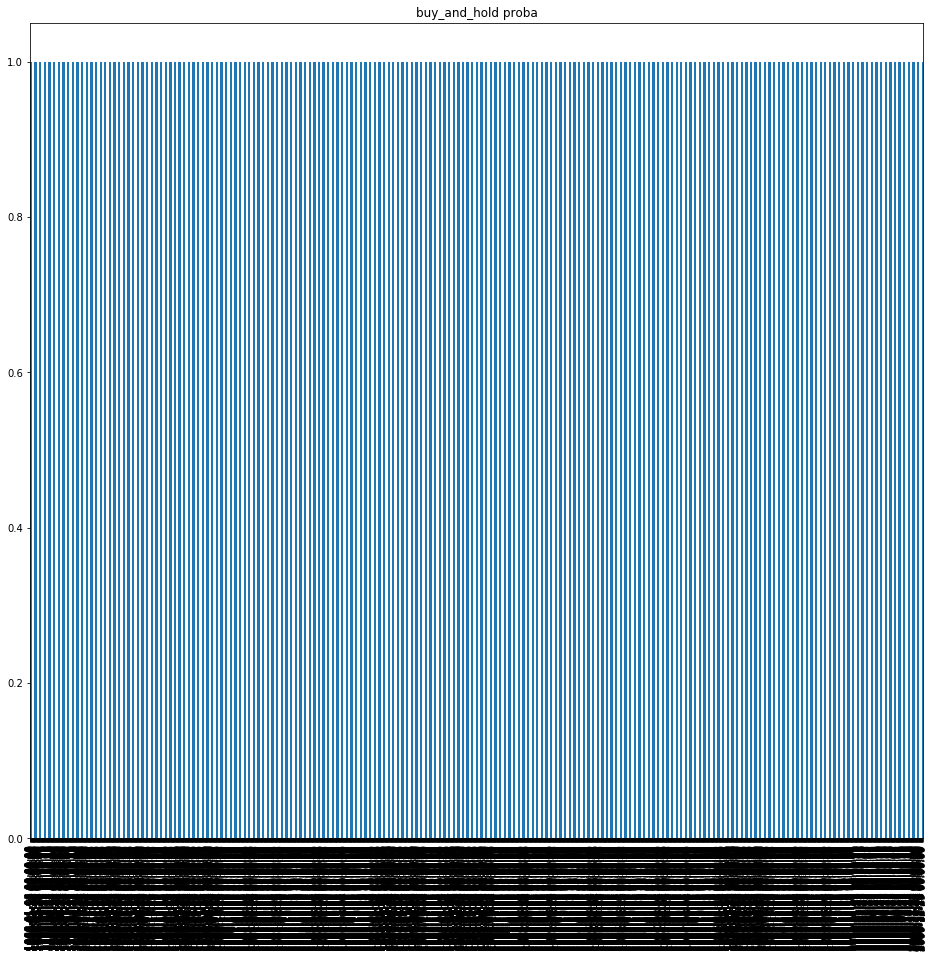

==================================== vote_lookbackA_rollA_top20


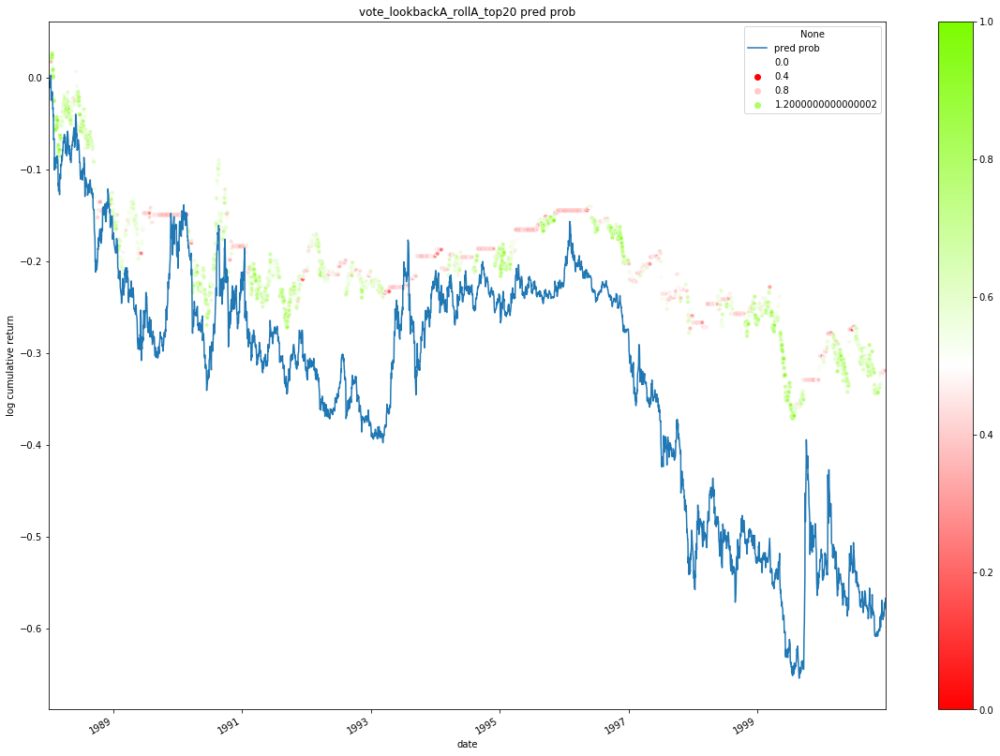

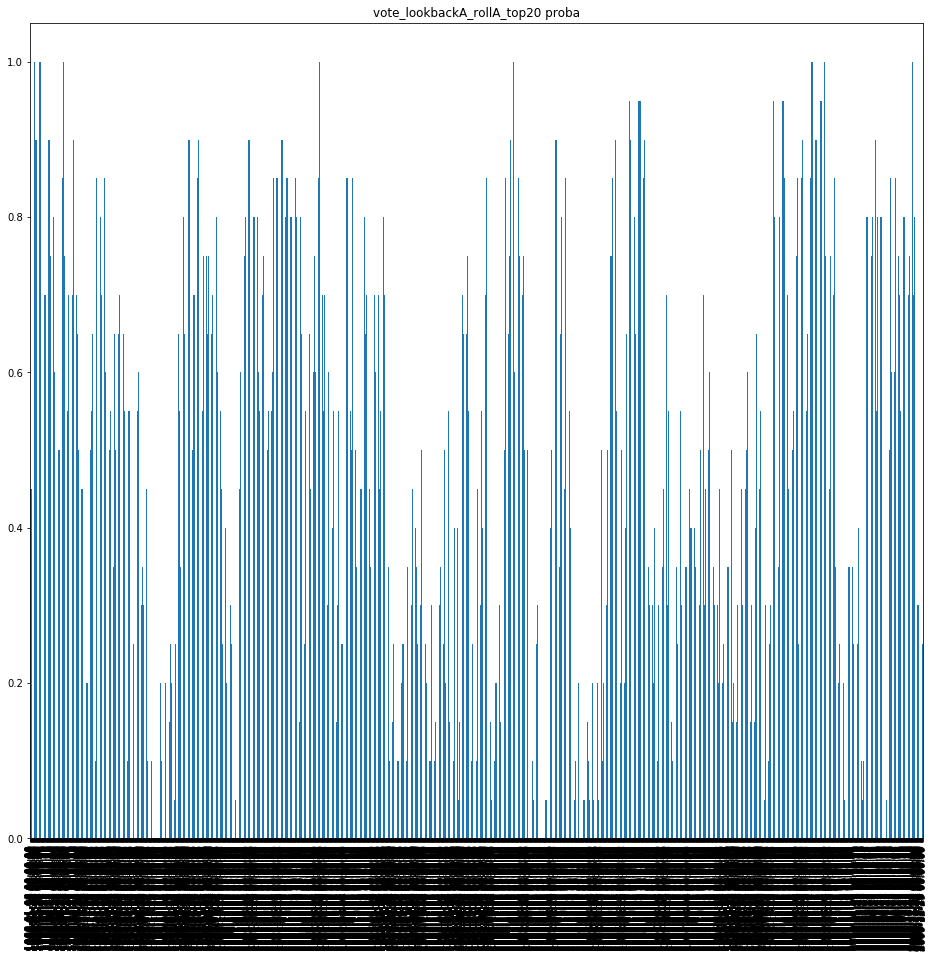

'2001-01-02 00:00:00 to 2005-12-30 00:00:00'

,highlight_ratio,flip_ratio,accu,prec,mse
vote_lookbackA_rollA_top20_smooth_cross_sma_42_58,0.483474,0.116154,0.497310,0.542130,1.251186
vote_lookbackA_rollA_top20_smooth_cross_sma_34_66,0.379708,0.100769,0.487317,0.540486,1.267586
vote_lookbackA_rollA_top20_smooth_cross_sma_50_58,0.521906,0.114615,0.501922,0.543446,1.256002
vote_lookbackA_rollA_top20_smooth_cross_sma_34_42,0.407379,0.096154,0.499616,0.552830,1.258401
vote_lookbackA_rollA_top20_smooth_cross_sma_74_82,0.428132,0.103846,0.497310,0.547576,1.263643
vote_lookbackA_rollA_top20_smooth_cross_sma_42_66,0.515757,0.114615,0.501922,0.543964,1.245731
vote_lookbackA_rollA_top20_smooth_cross_sma_34_58,0.441968,0.099231,0.498847,0.547826,1.253683
vote_lookbackA_rollA_top20_smooth_cross_sma_50_90,0.508071,0.119231,0.498847,0.541604,1.249717
vote_lookbackA_rollA_top20_smooth_cross_sma_34_50,0.399693,0.100769,0.505765,0.561538,1.243654
vote_lookbackA_rollA_top20_smooth_cross_sma_42_50,0.395081,0.099231,0.504228,0.560311,1.236597


,annual_return,sharpe_ratio,max_drawdown,avg_drawdown,return/avgdd
buy_and_hold,0.132401,0.936292,-0.154450,-0.042569,3.110238
vote_lookbackA_rollA_top20_smooth_cross_sma_42_58,0.066141,0.687546,-0.114507,-0.025073,2.637917
vote_lookbackA_rollA_top20_smooth_cross_sma_34_66,0.047276,0.551029,-0.135905,-0.026143,1.808347
vote_lookbackA_rollA_top20_smooth_cross_sma_50_58,0.060104,0.622621,-0.121232,-0.036247,1.658214
vote_lookbackA_rollA_top20_smooth_cross_sma_34_42,0.058037,0.645620,-0.110030,-0.022954,2.528443
vote_lookbackA_rollA_top20_smooth_cross_sma_74_82,0.051581,0.574274,-0.114507,-0.033818,1.525259
vote_lookbackA_rollA_top20_smooth_cross_sma_42_66,0.072284,0.716016,-0.121232,-0.030284,2.386845
vote_lookbackA_rollA_top20_smooth_cross_sma_34_58,0.063105,0.659028,-0.114507,-0.029095,2.168898
vote_lookbackA_rollA_top20_smooth_cross_sma_50_90,0.067730,0.692291,-0.121232,-0.032586,2.078494
vote_lookbackA_rollA_top20_smooth_cross_sma_34_50,0.075887,0.814376,-0.114507,-0.024222,3.133020


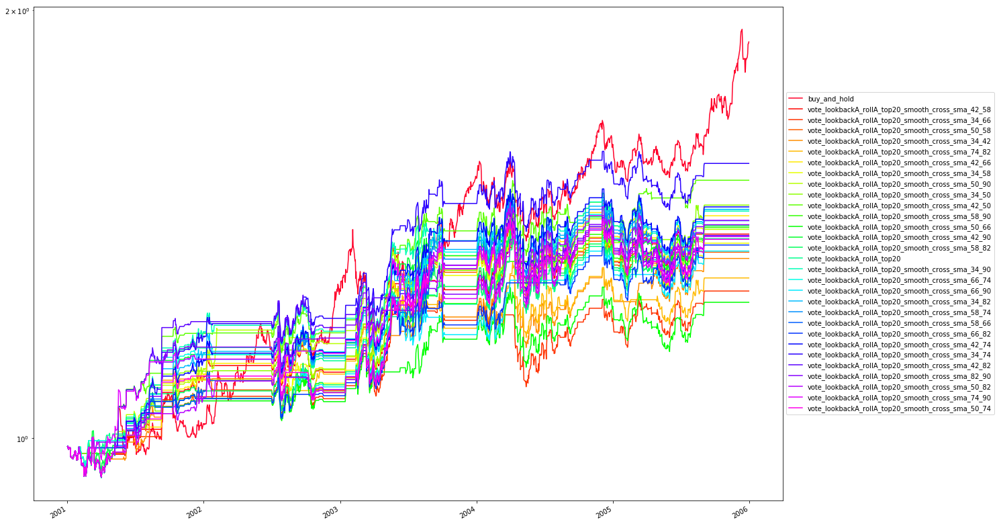

==================================== buy_and_hold


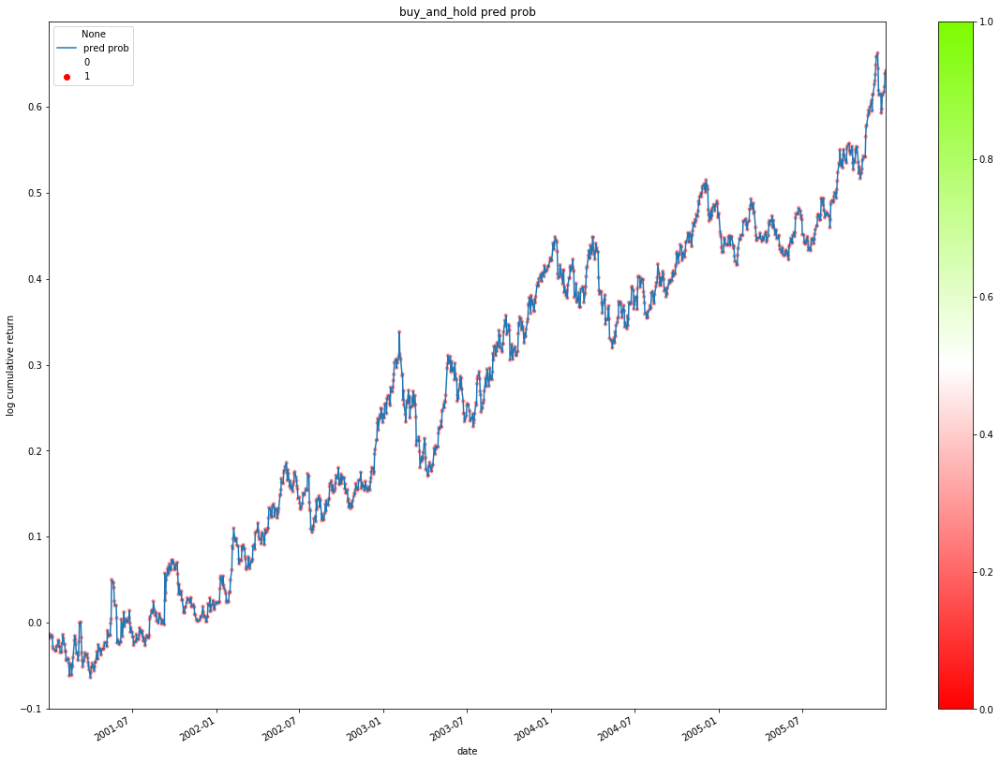

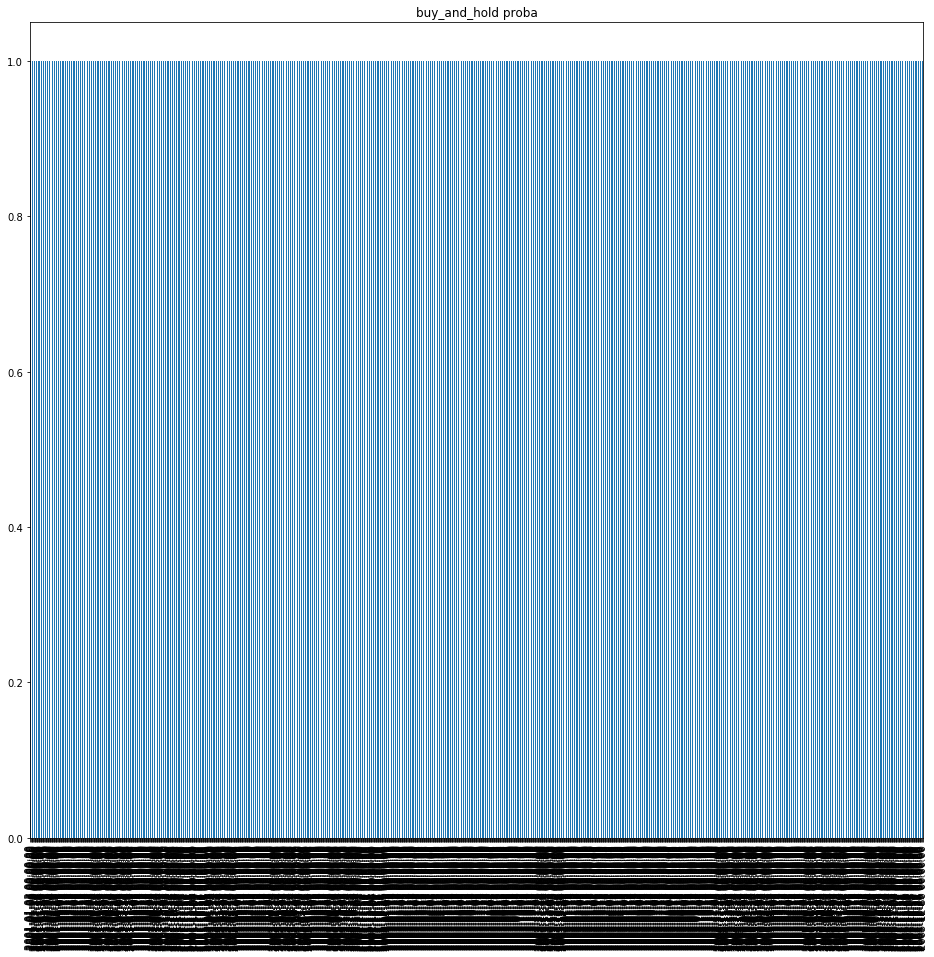

==================================== vote_lookbackA_rollA_top20


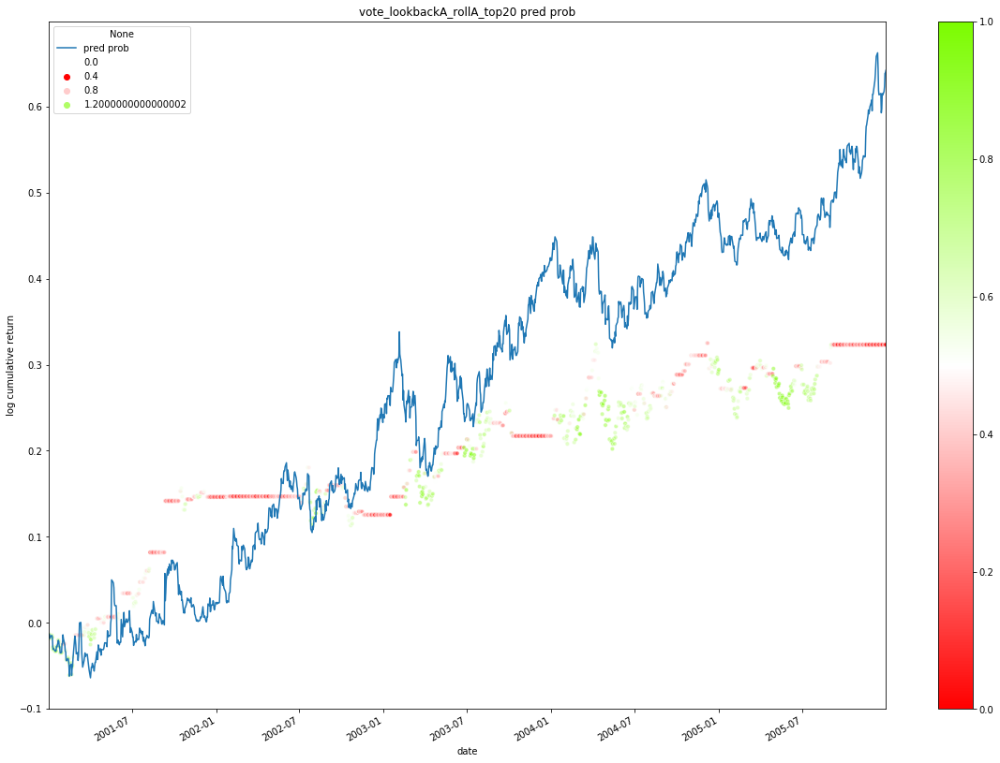

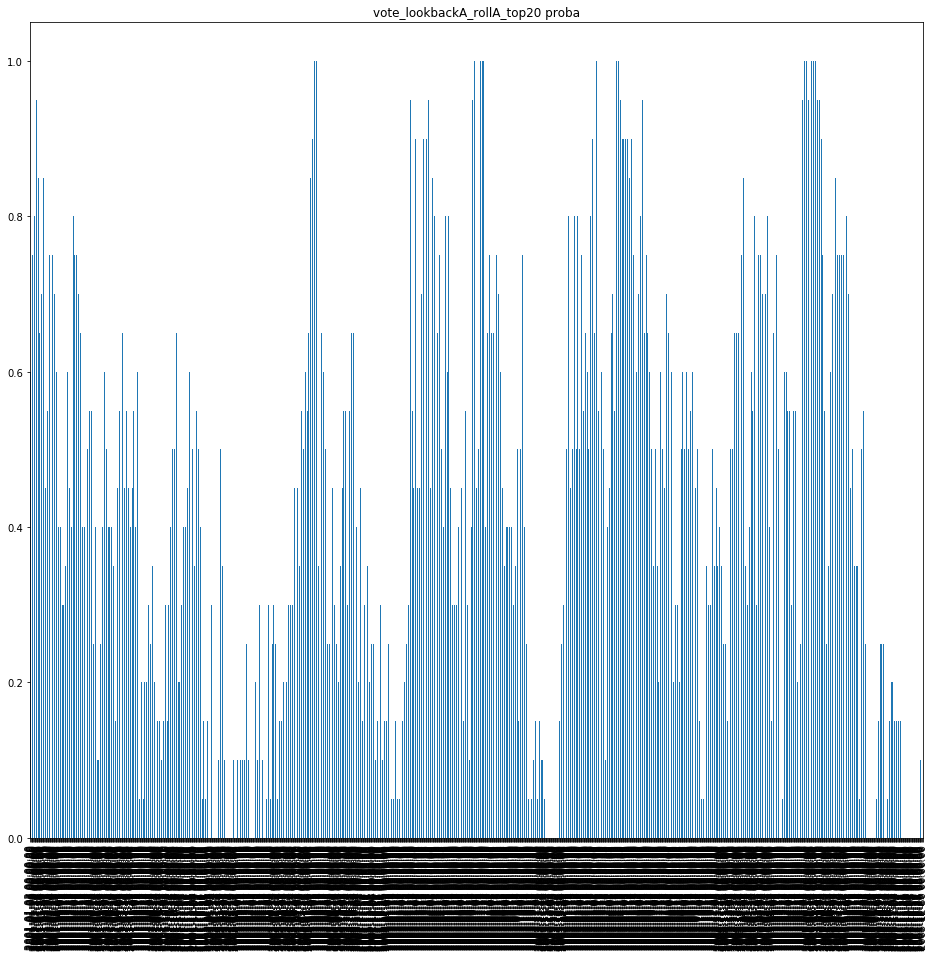

'2006-01-03 00:00:00 to 2008-12-31 00:00:00'

,highlight_ratio,flip_ratio,accu,prec,mse
vote_lookbackA_rollA_top20_smooth_cross_sma_42_58,0.635083,0.082051,0.512164,0.534274,1.274576
vote_lookbackA_rollA_top20_smooth_cross_sma_34_66,0.670935,0.084615,0.524968,0.541985,1.239762
vote_lookbackA_rollA_top20_smooth_cross_sma_50_58,0.642766,0.087179,0.514725,0.535857,1.266020
vote_lookbackA_rollA_top20_smooth_cross_sma_34_42,0.637644,0.089744,0.517286,0.538153,1.243871
vote_lookbackA_rollA_top20_smooth_cross_sma_74_82,0.647887,0.079487,0.512164,0.533597,1.241422
vote_lookbackA_rollA_top20_smooth_cross_sma_42_66,0.678617,0.083333,0.519846,0.537736,1.243590
vote_lookbackA_rollA_top20_smooth_cross_sma_34_58,0.618438,0.087179,0.518566,0.540373,1.240792
vote_lookbackA_rollA_top20_smooth_cross_sma_50_90,0.714469,0.088462,0.519846,0.535842,1.227764
vote_lookbackA_rollA_top20_smooth_cross_sma_34_50,0.663252,0.084615,0.519846,0.538610,1.249253
vote_lookbackA_rollA_top20_smooth_cross_sma_42_50,0.637644,0.087179,0.514725,0.536145,1.265277


,annual_return,sharpe_ratio,max_drawdown,avg_drawdown,return/avgdd
buy_and_hold,0.186867,0.824008,-0.290117,-0.090528,2.064197
vote_lookbackA_rollA_top20_smooth_cross_sma_42_58,0.036832,0.281663,-0.232269,-0.059532,0.618682
vote_lookbackA_rollA_top20_smooth_cross_sma_34_66,0.106527,0.587818,-0.222815,-0.053856,1.978002
vote_lookbackA_rollA_top20_smooth_cross_sma_50_58,0.054191,0.365800,-0.220799,-0.058828,0.921181
vote_lookbackA_rollA_top20_smooth_cross_sma_34_42,0.099645,0.572307,-0.250430,-0.062587,1.592105
vote_lookbackA_rollA_top20_smooth_cross_sma_74_82,0.103548,0.579296,-0.271890,-0.053422,1.938322
vote_lookbackA_rollA_top20_smooth_cross_sma_42_66,0.098296,0.551739,-0.243656,-0.057844,1.699323
vote_lookbackA_rollA_top20_smooth_cross_sma_34_58,0.104741,0.583351,-0.227132,-0.054693,1.915052
vote_lookbackA_rollA_top20_smooth_cross_sma_50_90,0.132298,0.695431,-0.231799,-0.047227,2.801344
vote_lookbackA_rollA_top20_smooth_cross_sma_34_50,0.086762,0.504178,-0.269108,-0.065720,1.320178


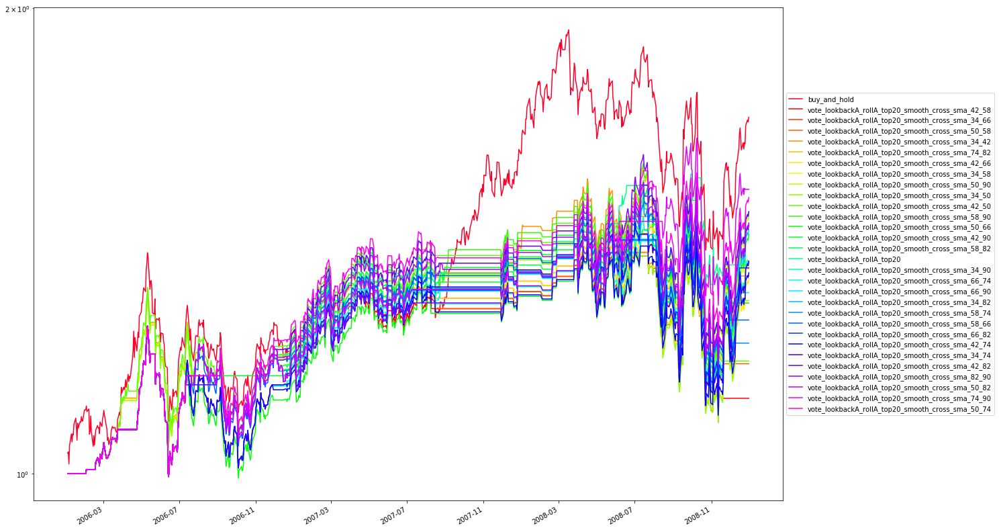

==================================== buy_and_hold


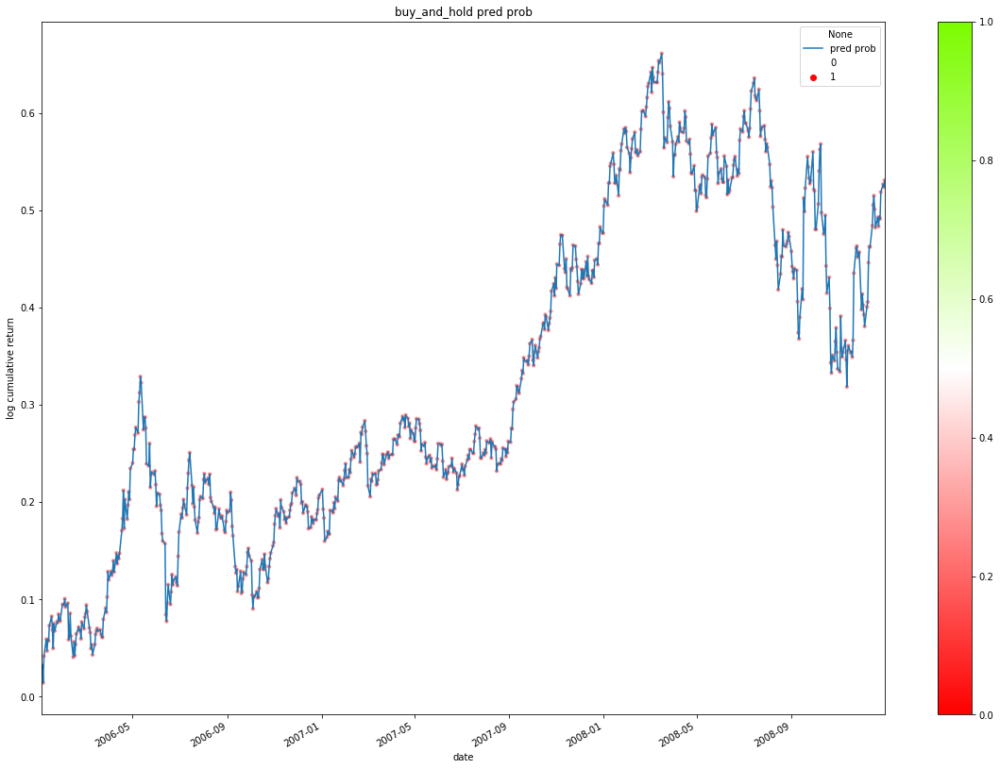

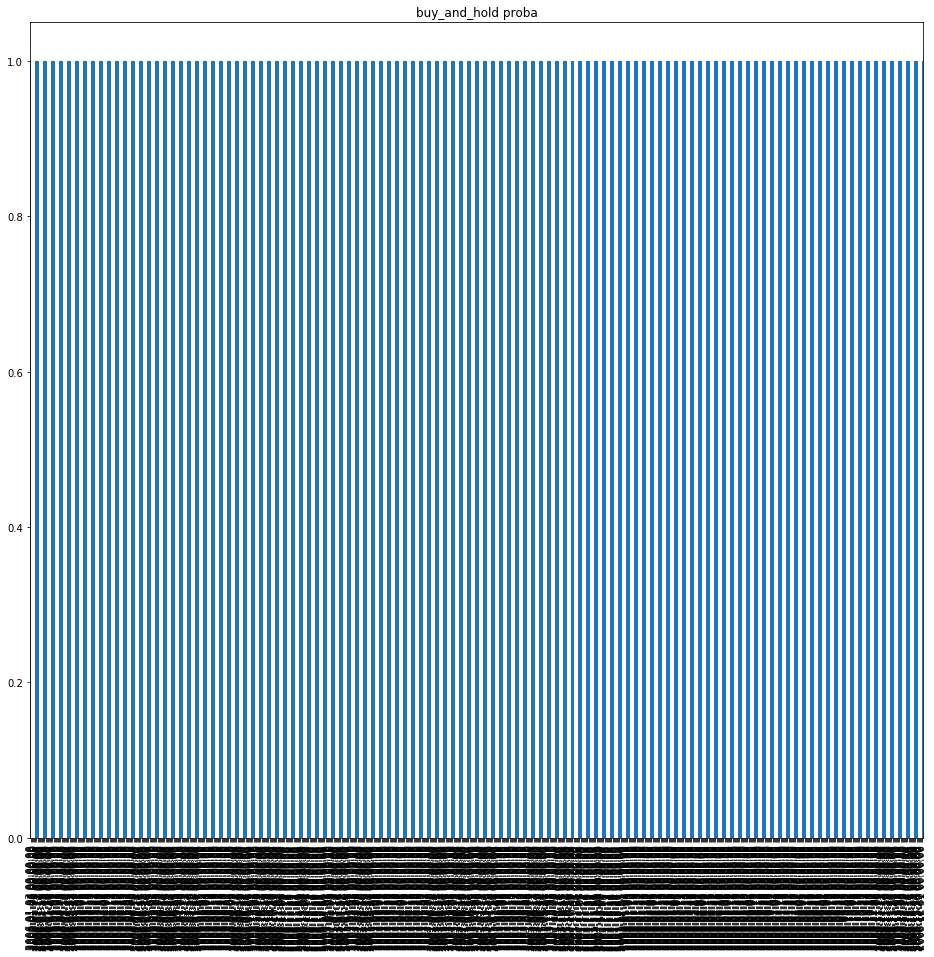

==================================== vote_lookbackA_rollA_top20


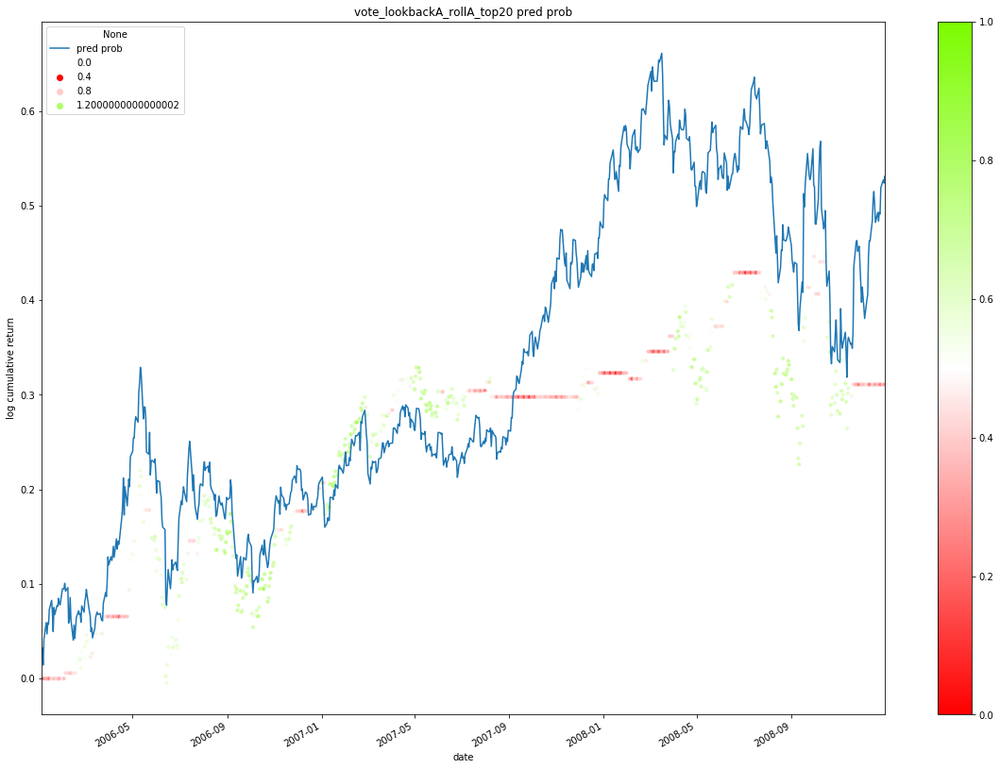

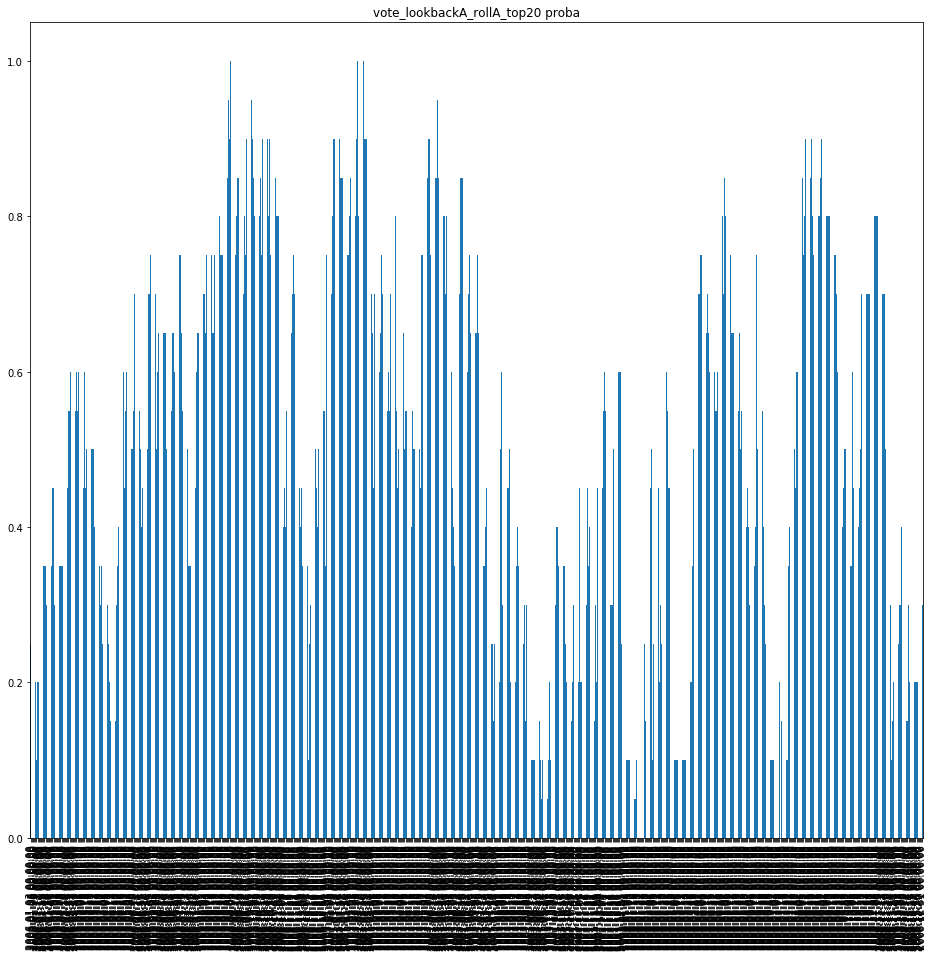

'2009-01-01 00:00:00 to 2011-12-30 00:00:00'

,highlight_ratio,flip_ratio,accu,prec,mse
vote_lookbackA_rollA_top20_smooth_cross_sma_42_58,0.569054,0.074264,0.514066,0.561798,1.225751
vote_lookbackA_rollA_top20_smooth_cross_sma_34_66,0.603581,0.074264,0.523018,0.565678,1.206100
vote_lookbackA_rollA_top20_smooth_cross_sma_50_58,0.579284,0.072983,0.516624,0.562914,1.225802
vote_lookbackA_rollA_top20_smooth_cross_sma_34_42,0.567775,0.079385,0.525575,0.572072,1.212674
vote_lookbackA_rollA_top20_smooth_cross_sma_74_82,0.534527,0.087068,0.520460,0.571770,1.201056
vote_lookbackA_rollA_top20_smooth_cross_sma_42_66,0.570332,0.071703,0.515345,0.562780,1.225079
vote_lookbackA_rollA_top20_smooth_cross_sma_34_58,0.557545,0.074264,0.517903,0.566514,1.224436
vote_lookbackA_rollA_top20_smooth_cross_sma_50_90,0.471867,0.085787,0.516624,0.577236,1.204157
vote_lookbackA_rollA_top20_smooth_cross_sma_34_50,0.553708,0.071703,0.519182,0.568129,1.225048
vote_lookbackA_rollA_top20_smooth_cross_sma_42_50,0.602302,0.076825,0.526854,0.569002,1.206744


,annual_return,sharpe_ratio,max_drawdown,avg_drawdown,return/avgdd
buy_and_hold,0.203590,1.084884,-0.186157,-0.044423,4.583029
vote_lookbackA_rollA_top20_smooth_cross_sma_42_58,0.143510,1.104105,-0.138741,-0.020142,7.124742
vote_lookbackA_rollA_top20_smooth_cross_sma_34_66,0.177388,1.333761,-0.138741,-0.014248,12.449844
vote_lookbackA_rollA_top20_smooth_cross_sma_50_58,0.143338,1.098674,-0.138741,-0.022429,6.390879
vote_lookbackA_rollA_top20_smooth_cross_sma_34_42,0.166639,1.304385,-0.113766,-0.014818,11.245390
vote_lookbackA_rollA_top20_smooth_cross_sma_74_82,0.185842,1.364351,-0.113994,-0.013864,13.404545
vote_lookbackA_rollA_top20_smooth_cross_sma_42_66,0.144649,1.111770,-0.138741,-0.020139,7.182708
vote_lookbackA_rollA_top20_smooth_cross_sma_34_58,0.146518,1.167773,-0.138519,-0.014548,10.071360
vote_lookbackA_rollA_top20_smooth_cross_sma_50_90,0.182359,1.479748,-0.080258,-0.014272,12.777322
vote_lookbackA_rollA_top20_smooth_cross_sma_34_50,0.145482,1.160645,-0.138519,-0.014460,10.061083


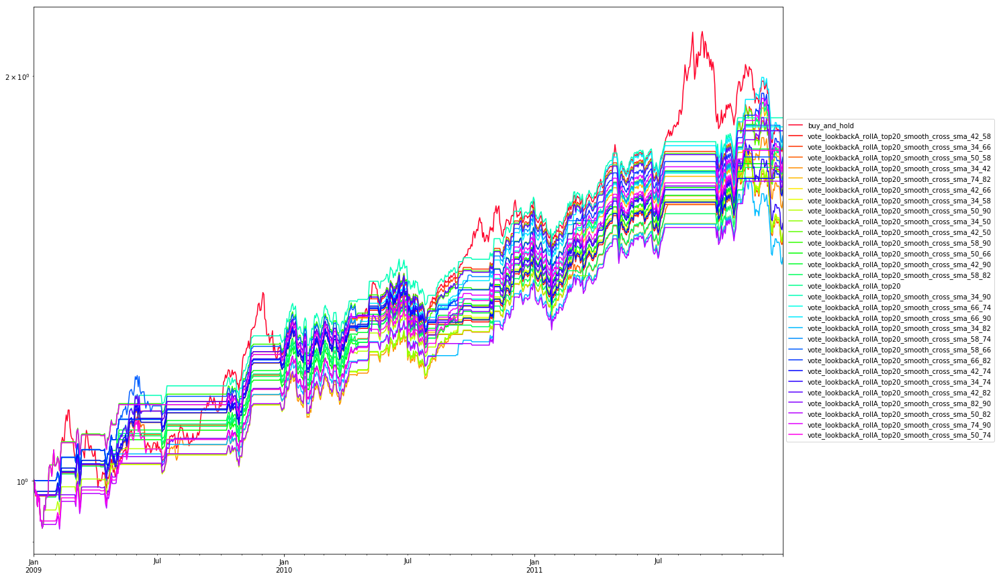

==================================== buy_and_hold


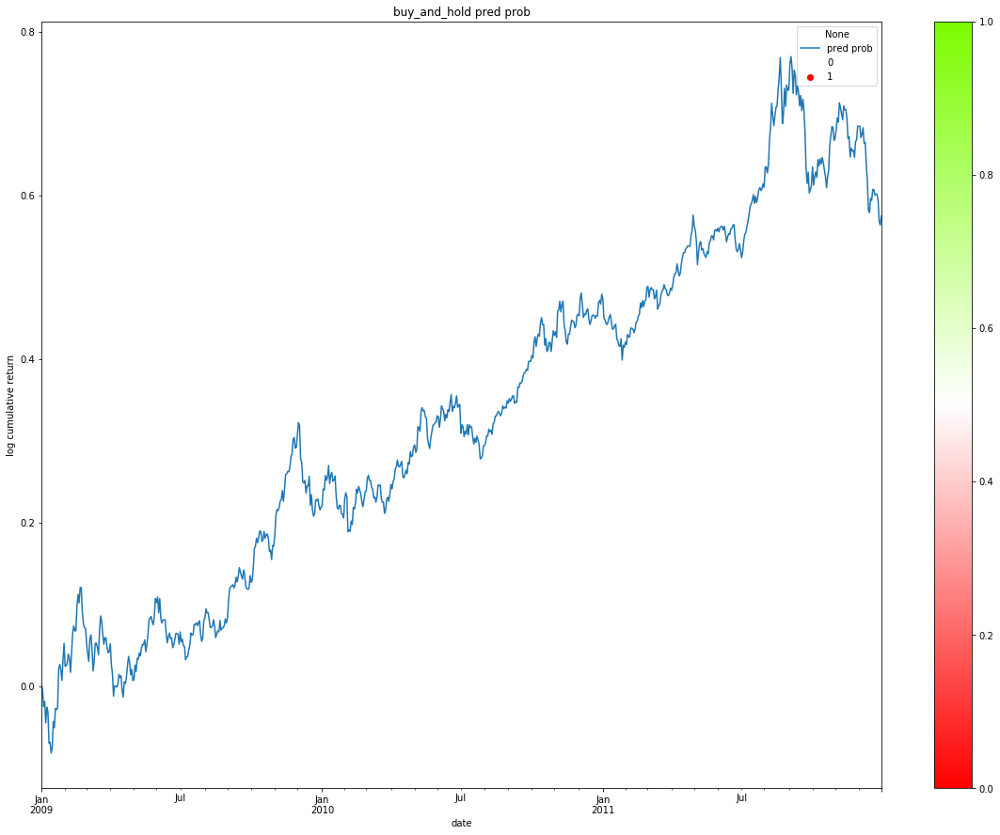

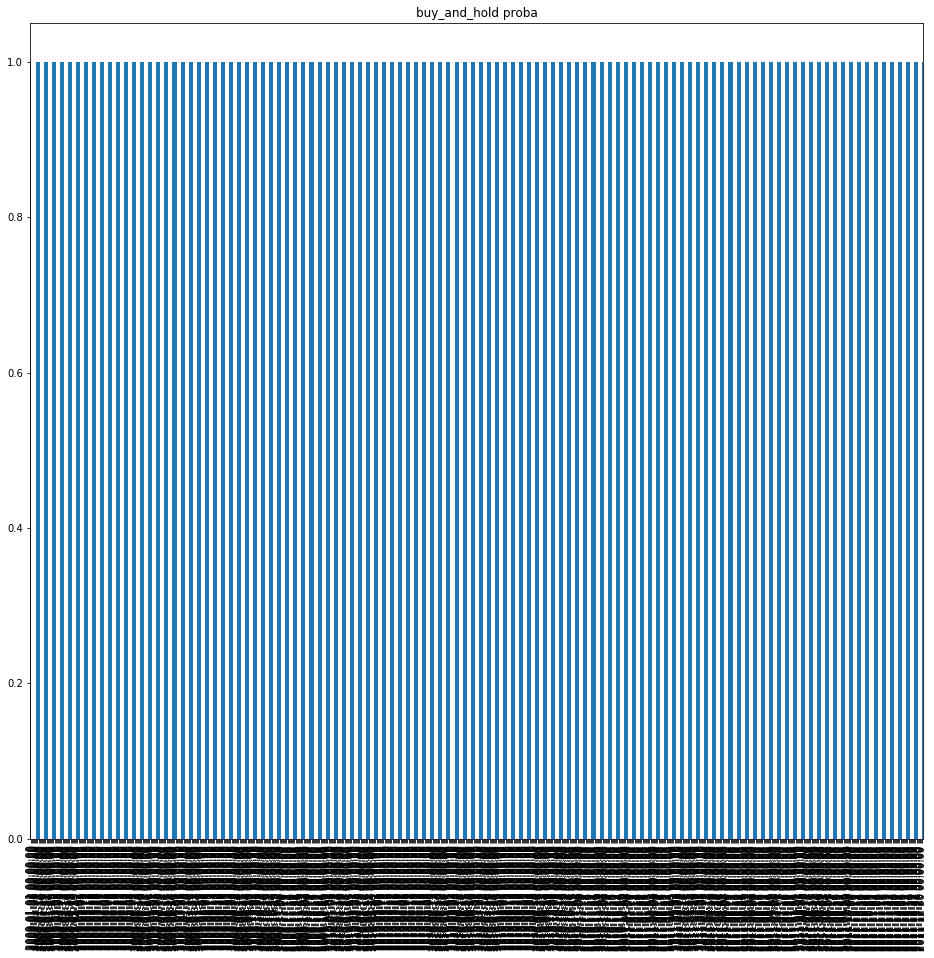

==================================== vote_lookbackA_rollA_top20


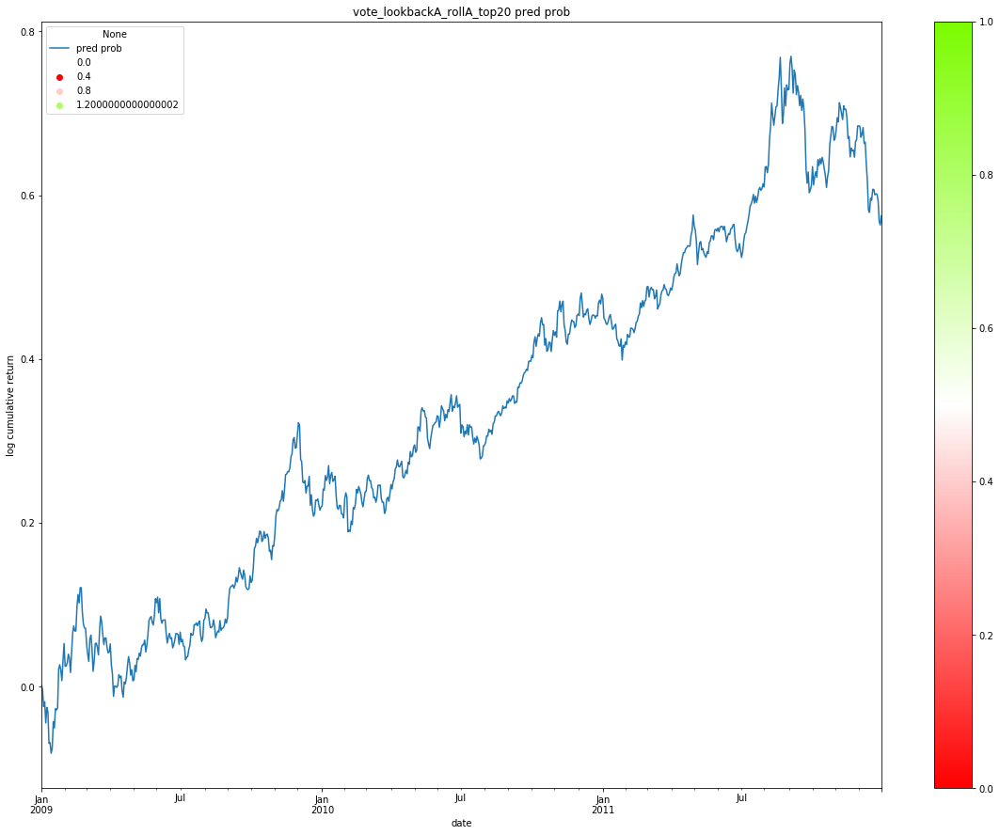

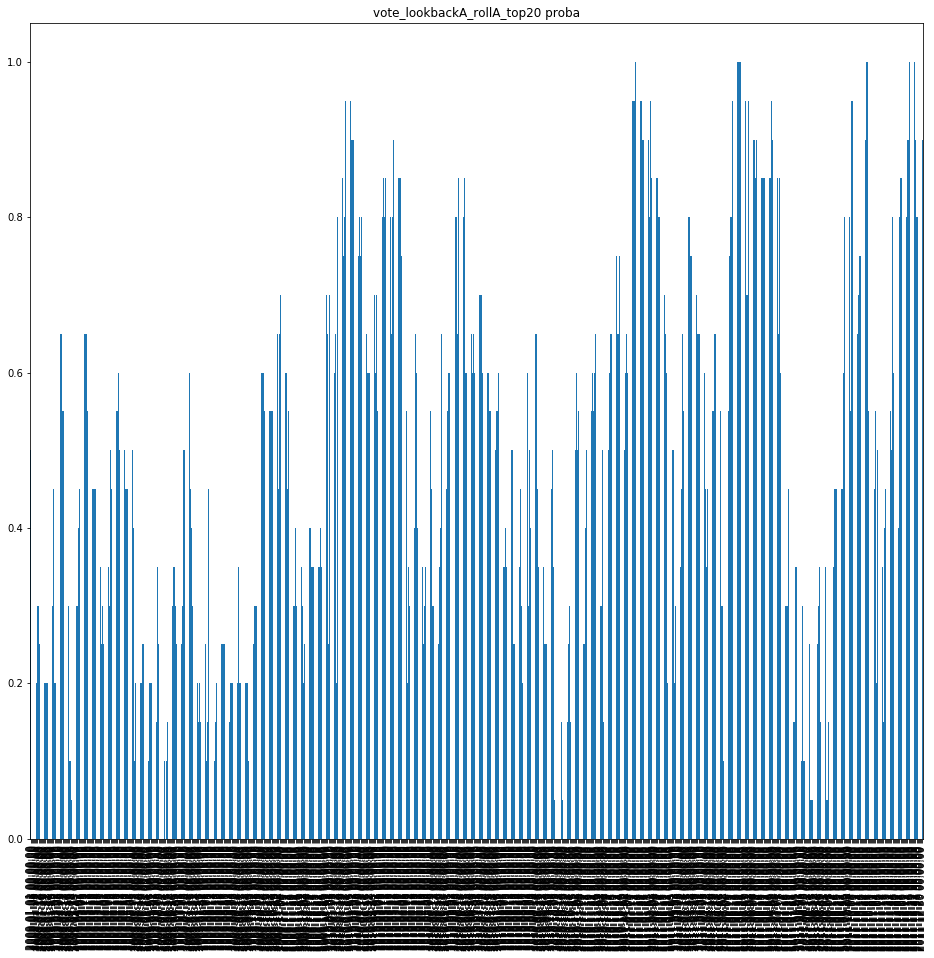

'2012-01-02 00:00:00 to 2015-12-31 00:00:00'

,highlight_ratio,flip_ratio,accu,prec,mse
vote_lookbackA_rollA_top20_smooth_cross_sma_42_58,0.761996,0.059558,0.492322,0.484887,1.275080
vote_lookbackA_rollA_top20_smooth_cross_sma_34_66,0.833973,0.057637,0.500960,0.491369,1.271255
vote_lookbackA_rollA_top20_smooth_cross_sma_50_58,0.563340,0.051873,0.489443,0.477002,1.227347
vote_lookbackA_rollA_top20_smooth_cross_sma_34_42,0.554702,0.061479,0.507678,0.493080,1.242308
vote_lookbackA_rollA_top20_smooth_cross_sma_74_82,0.684261,0.048031,0.493282,0.483871,1.285823
vote_lookbackA_rollA_top20_smooth_cross_sma_42_66,0.571977,0.053794,0.486564,0.474832,1.237820
vote_lookbackA_rollA_top20_smooth_cross_sma_34_58,0.627639,0.059558,0.494242,0.483180,1.249240
vote_lookbackA_rollA_top20_smooth_cross_sma_50_90,0.776392,0.048991,0.506718,0.494438,1.282782
vote_lookbackA_rollA_top20_smooth_cross_sma_34_50,0.529750,0.055716,0.505758,0.490942,1.235665
vote_lookbackA_rollA_top20_smooth_cross_sma_42_50,0.523033,0.059558,0.487524,0.473394,1.242207


,annual_return,sharpe_ratio,max_drawdown,avg_drawdown,return/avgdd
buy_and_hold,-0.089555,-0.494734,-0.412616,-0.229167,-0.390783
vote_lookbackA_rollA_top20_smooth_cross_sma_42_58,-0.079746,-0.503606,-0.384387,-0.248901,-0.320391
vote_lookbackA_rollA_top20_smooth_cross_sma_34_66,-0.076150,-0.447456,-0.394615,-0.253330,-0.300596
vote_lookbackA_rollA_top20_smooth_cross_sma_50_58,-0.017189,-0.097284,-0.202886,-0.120357,-0.142816
vote_lookbackA_rollA_top20_smooth_cross_sma_34_42,-0.037403,-0.243244,-0.355201,-0.220712,-0.169463
vote_lookbackA_rollA_top20_smooth_cross_sma_74_82,-0.092344,-0.602683,-0.422396,-0.270678,-0.341158
vote_lookbackA_rollA_top20_smooth_cross_sma_42_66,-0.030435,-0.216453,-0.236089,-0.135677,-0.224316
vote_lookbackA_rollA_top20_smooth_cross_sma_34_58,-0.045394,-0.326981,-0.283661,-0.163529,-0.277593
vote_lookbackA_rollA_top20_smooth_cross_sma_50_90,-0.089131,-0.564381,-0.370484,-0.219400,-0.406250
vote_lookbackA_rollA_top20_smooth_cross_sma_34_50,-0.027217,-0.200419,-0.239434,-0.155992,-0.174478


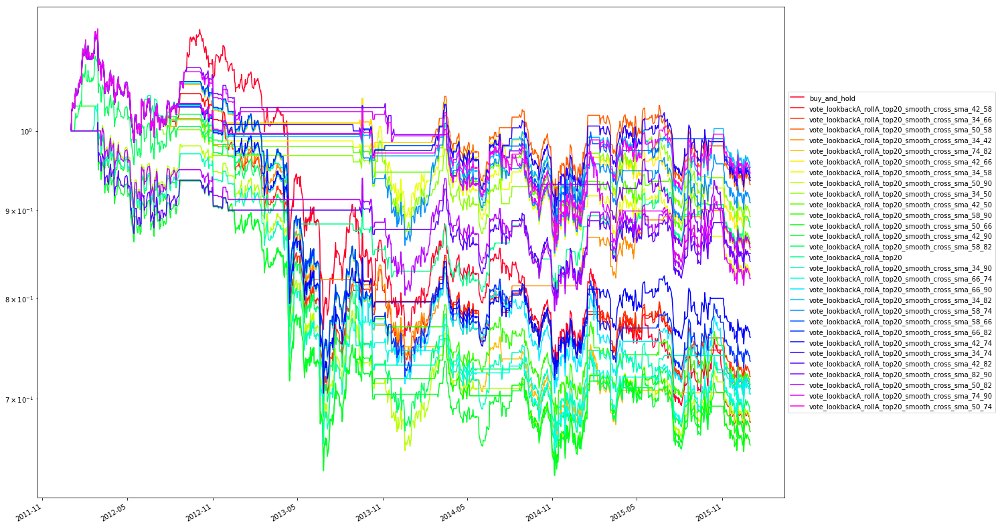

==================================== buy_and_hold


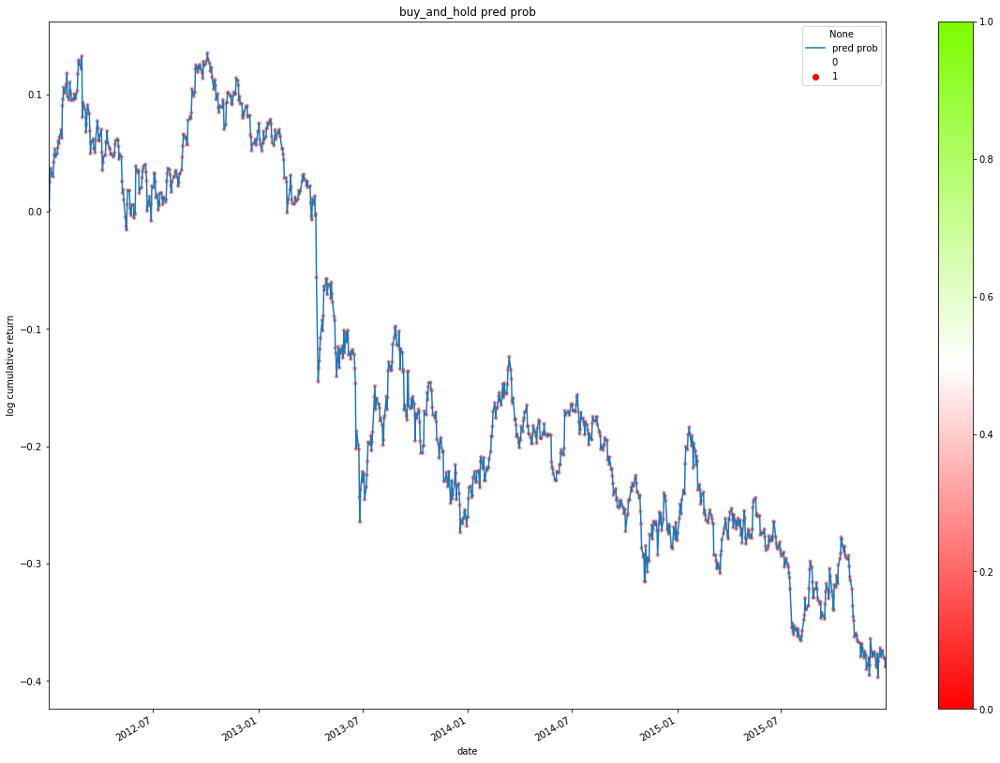

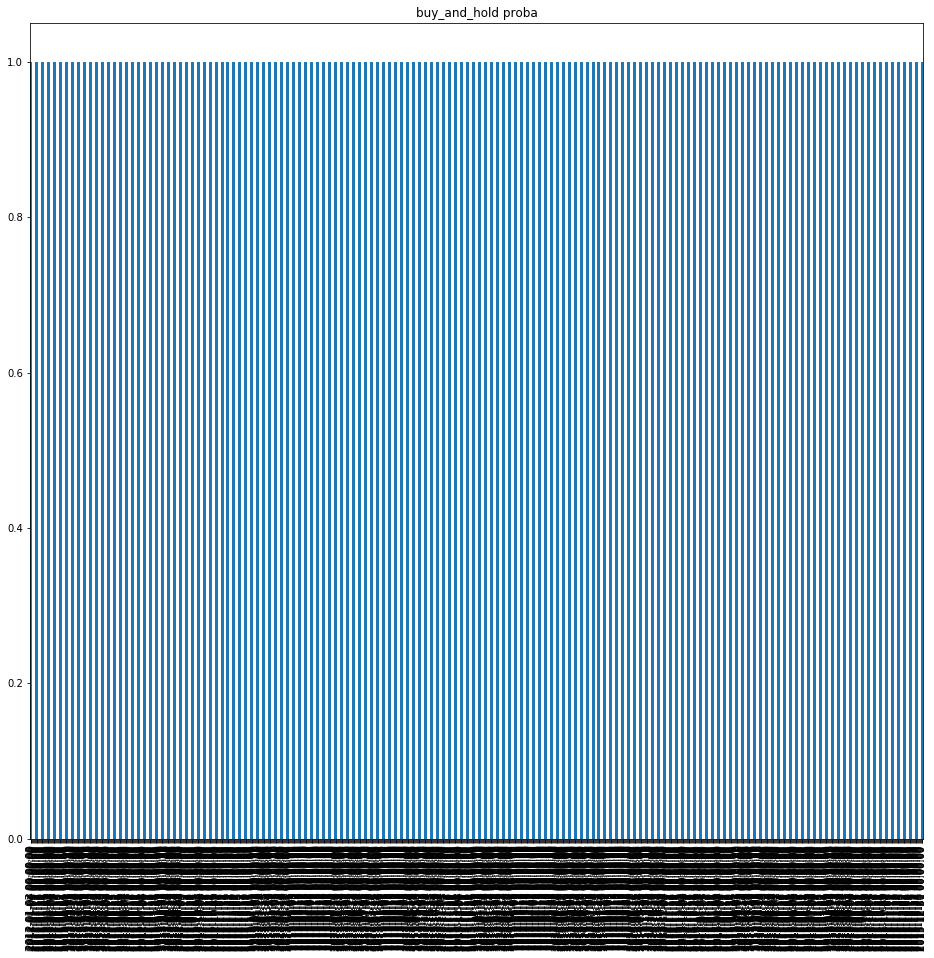

==================================== vote_lookbackA_rollA_top20


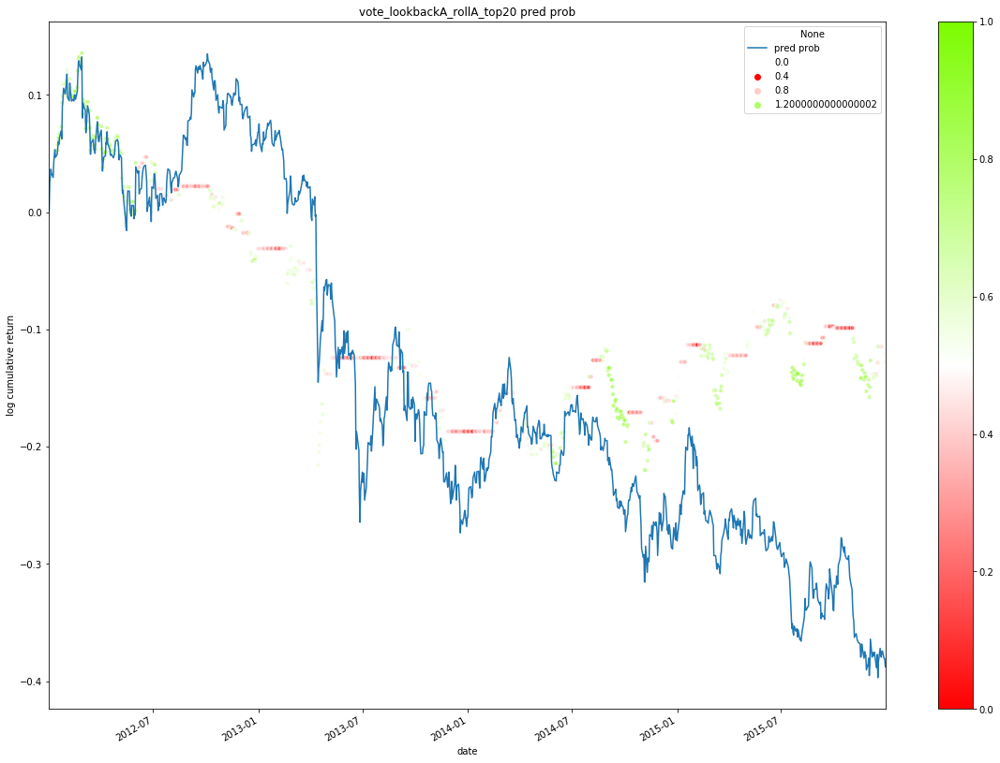

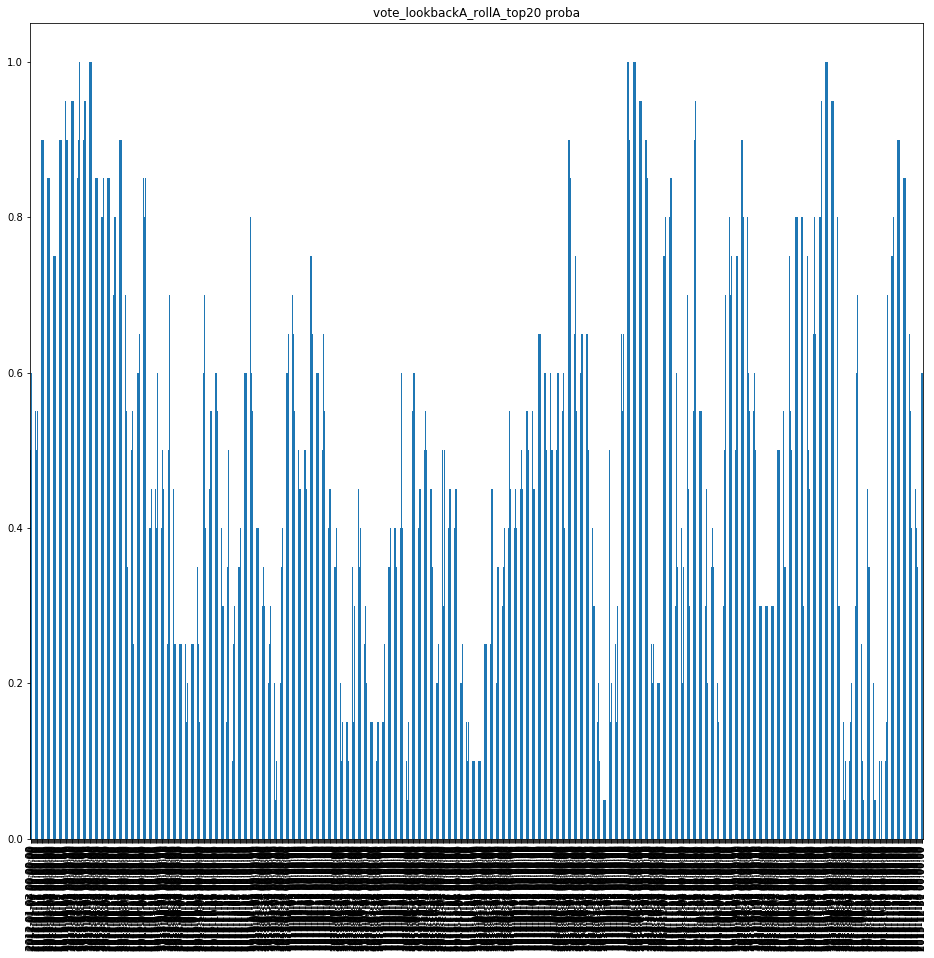

'2016-01-01 00:00:00 to 2021-12-31 00:00:00'

,highlight_ratio,flip_ratio,accu,prec,mse
vote_lookbackA_rollA_top20_smooth_cross_sma_42_58,0.247601,0.065941,0.492642,0.558140,1.230348
vote_lookbackA_rollA_top20_smooth_cross_sma_34_66,0.406270,0.063380,0.500320,0.544882,1.239866
vote_lookbackA_rollA_top20_smooth_cross_sma_50_58,0.232885,0.065941,0.497121,0.571429,1.229251
vote_lookbackA_rollA_top20_smooth_cross_sma_34_42,0.420345,0.065941,0.501599,0.544901,1.241754
vote_lookbackA_rollA_top20_smooth_cross_sma_74_82,0.491363,0.076184,0.506078,0.542969,1.234026
vote_lookbackA_rollA_top20_smooth_cross_sma_42_66,0.355086,0.063380,0.497761,0.547748,1.243791
vote_lookbackA_rollA_top20_smooth_cross_sma_34_58,0.342930,0.065941,0.506078,0.561567,1.227063
vote_lookbackA_rollA_top20_smooth_cross_sma_50_90,0.470250,0.068502,0.519514,0.559184,1.208751
vote_lookbackA_rollA_top20_smooth_cross_sma_34_50,0.394754,0.067222,0.511836,0.560778,1.226705
vote_lookbackA_rollA_top20_smooth_cross_sma_42_50,0.335253,0.068502,0.503519,0.559160,1.226485


,annual_return,sharpe_ratio,max_drawdown,avg_drawdown,return/avgdd
buy_and_hold,0.091659,0.718013,-0.185126,-0.066784,1.372467
vote_lookbackA_rollA_top20_smooth_cross_sma_42_58,0.070678,0.974401,-0.130234,-0.015297,4.620268
vote_lookbackA_rollA_top20_smooth_cross_sma_34_66,0.058426,0.681824,-0.160818,-0.031009,1.884147
vote_lookbackA_rollA_top20_smooth_cross_sma_50_58,0.072063,1.013555,-0.094273,-0.011112,6.485312
vote_lookbackA_rollA_top20_smooth_cross_sma_34_42,0.056132,0.647025,-0.172816,-0.043137,1.301260
vote_lookbackA_rollA_top20_smooth_cross_sma_74_82,0.064348,0.695169,-0.178038,-0.042094,1.528666
vote_lookbackA_rollA_top20_smooth_cross_sma_42_66,0.054280,0.657832,-0.149802,-0.028927,1.876408
vote_lookbackA_rollA_top20_smooth_cross_sma_34_58,0.073313,0.865515,-0.159758,-0.021459,3.416400
vote_lookbackA_rollA_top20_smooth_cross_sma_50_90,0.094199,1.047935,-0.134805,-0.024832,3.793390
vote_lookbackA_rollA_top20_smooth_cross_sma_34_50,0.073217,0.819385,-0.158505,-0.030889,2.370345


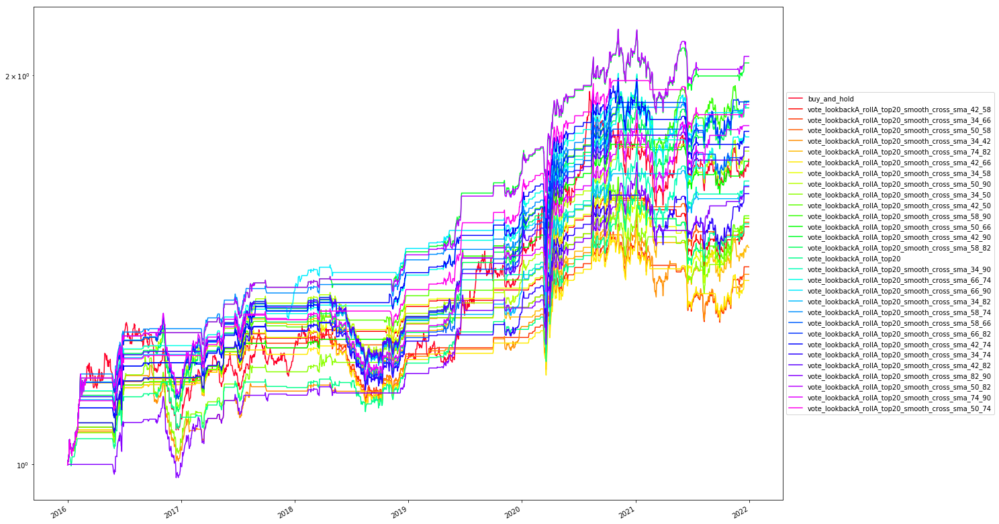

==================================== buy_and_hold


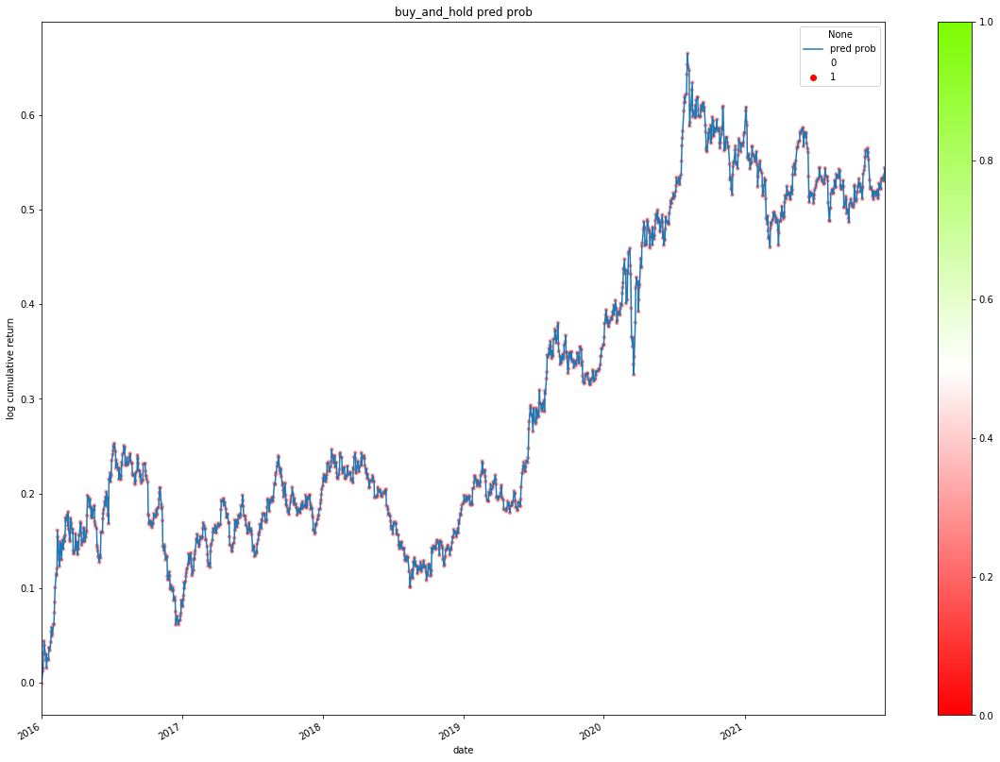

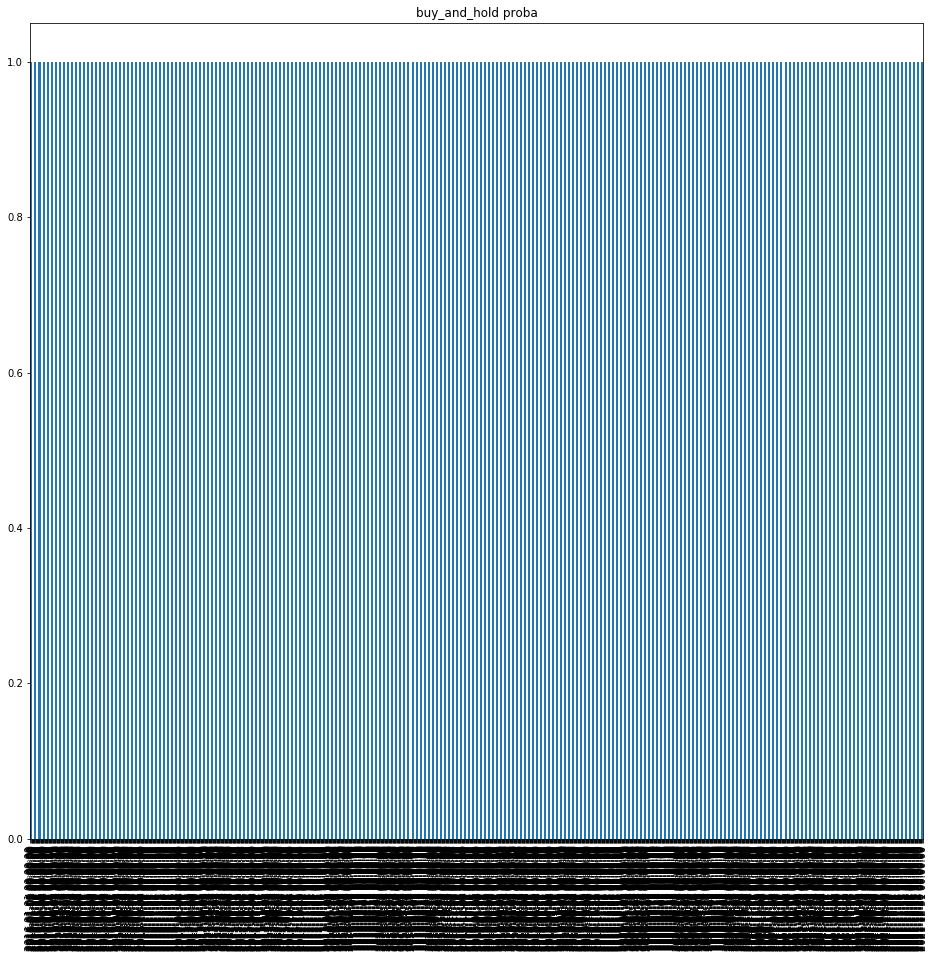

==================================== vote_lookbackA_rollA_top20


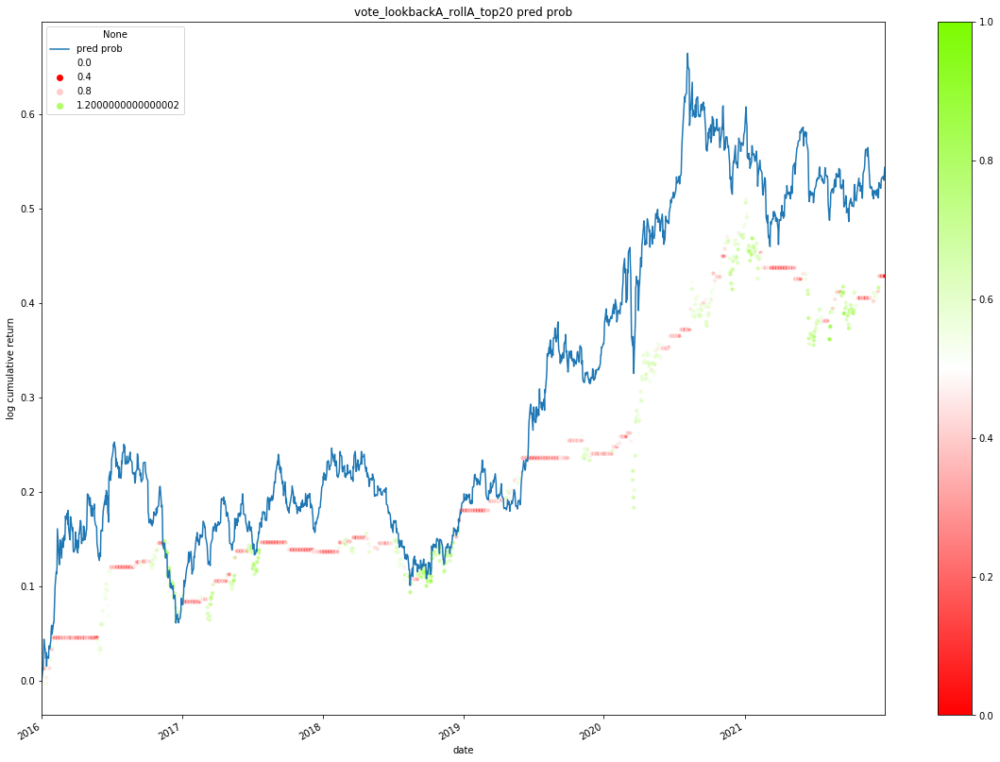

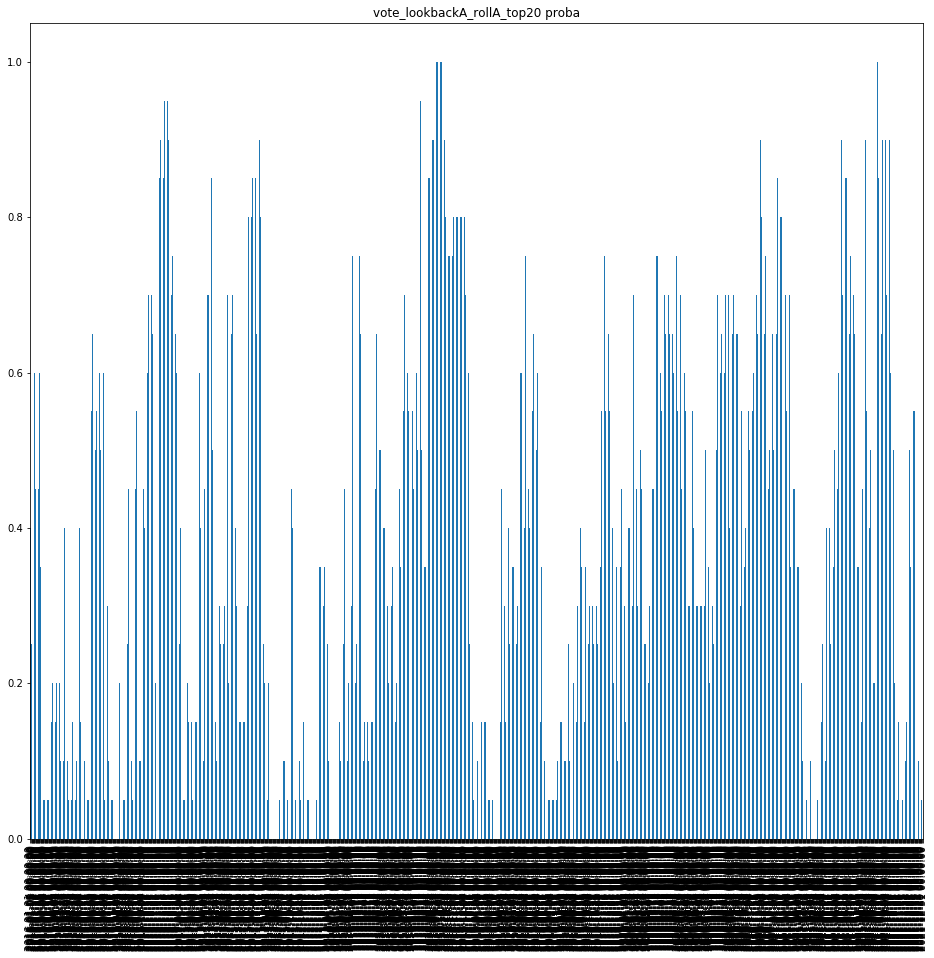

['buy_and_hold',
 'vote_lookbackA_rollA_top20_smooth_cross_sma_42_58',
 'vote_lookbackA_rollA_top20_smooth_cross_sma_34_66',
 'vote_lookbackA_rollA_top20_smooth_cross_sma_50_58',
 'vote_lookbackA_rollA_top20_smooth_cross_sma_34_42',
 'vote_lookbackA_rollA_top20_smooth_cross_sma_74_82',
 'vote_lookbackA_rollA_top20_smooth_cross_sma_42_66',
 'vote_lookbackA_rollA_top20_smooth_cross_sma_34_58',
 'vote_lookbackA_rollA_top20_smooth_cross_sma_50_90',
 'vote_lookbackA_rollA_top20_smooth_cross_sma_34_50',
 'vote_lookbackA_rollA_top20_smooth_cross_sma_42_50',
 'vote_lookbackA_rollA_top20_smooth_cross_sma_58_90',
 'vote_lookbackA_rollA_top20_smooth_cross_sma_50_66',
 'vote_lookbackA_rollA_top20_smooth_cross_sma_42_90',
 'vote_lookbackA_rollA_top20_smooth_cross_sma_58_82',
 'vote_lookbackA_rollA_top20',
 'vote_lookbackA_rollA_top20_smooth_cross_sma_34_90',
 'vote_lookbackA_rollA_top20_smooth_cross_sma_66_74',
 'vote_lookbackA_rollA_top20_smooth_cross_sma_66_90',
 'vote_lookbackA_rollA_top20_smoot

In [76]:
# cases = list(ret_pred_all.columns)
# cases.remove('true_up')

# cases = ['vote_lookbackA_rollA_top20', 'biased1_combine', 'buy_and_hold']

strategy_list_sel = print_all_result(ret_pred_case1, proba_all, base_case=cases, topn = len(ret_pred_case1))

print_all_result(ret_pred_case1['1988':'2000'], proba_all, strategy_list_sel=strategy_list_sel)
print_all_result(ret_pred_case1['2001':'2005'], proba_all, strategy_list_sel=strategy_list_sel)
print_all_result(ret_pred_case1['2006':'2008'], proba_all, strategy_list_sel=strategy_list_sel)
print_all_result(ret_pred_case1['2009':'2011'], proba_all, strategy_list_sel=strategy_list_sel)
print_all_result(ret_pred_case1['2012':'2015'], proba_all, strategy_list_sel=strategy_list_sel)
print_all_result(ret_pred_case1['2016':'2021'], proba_all, strategy_list_sel=strategy_list_sel)

## vote_lookbackA_rollA_top20 + pred_sma our cross

In [36]:
cases = ['vote_lookbackA_rollA_top20']

In [37]:
pred_case2 = pred_all[cases]

for base_case in pred_case2.columns:
    for s in pred_sma.columns:
        if s == 'buy_and_hold':
            continue
        p_smooth = smooth_pred_by_flag(pred_case2[base_case], pred_sma[s])
        pred_case2[base_case+'_smooth_'+s] = p_smooth
    
pred_case2['buy_and_hold'] = 1
pred_case2

,vote_lookbackA_rollA_top20,vote_lookbackA_rollA_top20_smooth_average_sma_cross_ema25(average_sma),vote_lookbackA_rollA_top20_smooth_average_sma_cross_ytd,vote_lookbackA_rollA_top20_smooth_average_sma_cross_ema5(average_sma),vote_lookbackA_rollA_top20_smooth_close_cross_average_sma,vote_lookbackA_rollA_top20_smooth_fast3sma_cross_average_sma,vote_lookbackA_rollA_top20_smooth_close_cross_min_sma,vote_lookbackA_rollA_top20_smooth_close_cross_max_sma,vote_lookbackA_rollA_top20_smooth_average_sma_cross_ema25(average_sma)2,vote_lookbackA_rollA_top20_smooth_average_sma_cross_ytd2,vote_lookbackA_rollA_top20_smooth_average_sma_cross_ema5(average_sma)2,vote_lookbackA_rollA_top20_smooth_close_cross_average_sma2,vote_lookbackA_rollA_top20_smooth_fast3sma_cross_average_sma2,vote_lookbackA_rollA_top20_smooth_close_cross_min_sma2,vote_lookbackA_rollA_top20_smooth_close_cross_max_sma2,buy_and_hold
1985-01-02,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1
1985-01-03,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1
1985-01-04,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1
1985-01-07,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1
1985-01-08,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-27,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1
2021-12-28,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1
2021-12-29,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1
2021-12-30,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1


In [38]:
ret_pred_case2 = pred_case2.multiply(true_ret, 0)
ret_pred_case2.shape

(9612, 16)

'1985-01-02 00:00:00 to 2021-12-31 00:00:00'

,highlight_ratio,flip_ratio,accu,prec,mse
vote_lookbackA_rollA_top20_smooth_close_cross_average_sma,0.385560,0.071689,0.495318,0.515920,1.247192
vote_lookbackA_rollA_top20_smooth_close_cross_max_sma,0.314503,0.051712,0.497087,0.522329,1.249279
vote_lookbackA_rollA_top20_smooth_close_cross_min_sma,0.407407,0.088128,0.499896,0.520684,1.243820
vote_lookbackA_rollA_top20_smooth_fast3sma_cross_average_sma,0.514045,0.064822,0.495214,0.511840,1.238119
vote_lookbackA_rollA_top20_smooth_close_cross_min_sma2,0.700166,0.058267,0.505514,0.516048,1.231941
vote_lookbackA_rollA_top20_smooth_fast3sma_cross_average_sma2,0.472742,0.057954,0.504057,0.522227,1.239212
vote_lookbackA_rollA_top20,0.490012,0.126834,0.504890,0.522293,1.237725
vote_lookbackA_rollA_top20_smooth_average_sma_cross_ytd2,0.649709,0.071377,0.509779,0.520576,1.226431
vote_lookbackA_rollA_top20_smooth_average_sma_cross_ema25(average_sma),0.510612,0.080221,0.505306,0.521801,1.225271


,annual_return,sharpe_ratio,max_drawdown,avg_drawdown,return/avgdd
buy_and_hold,0.047776,0.378081,-0.493126,-0.224901,0.212431
vote_lookbackA_rollA_top20_smooth_close_cross_average_sma,0.029217,0.347819,-0.415544,-0.165568,0.176463
vote_lookbackA_rollA_top20_smooth_close_cross_max_sma,0.027516,0.359307,-0.270694,-0.074497,0.369358
vote_lookbackA_rollA_top20_smooth_close_cross_min_sma,0.033097,0.375893,-0.359917,-0.138951,0.238189
vote_lookbackA_rollA_top20_smooth_fast3sma_cross_average_sma,0.038668,0.386202,-0.461645,-0.173435,0.222953
vote_lookbackA_rollA_top20_smooth_close_cross_min_sma2,0.044483,0.395894,-0.439362,-0.202099,0.220103
vote_lookbackA_rollA_top20_smooth_fast3sma_cross_average_sma2,0.038263,0.405347,-0.409529,-0.180545,0.211930
vote_lookbackA_rollA_top20,0.040238,0.424901,-0.334195,-0.136446,0.294903
vote_lookbackA_rollA_top20_smooth_average_sma_cross_ytd2,0.052400,0.468540,-0.333737,-0.135329,0.387203
vote_lookbackA_rollA_top20_smooth_average_sma_cross_ema25(average_sma),0.055024,0.515075,-0.364046,-0.118829,0.463055


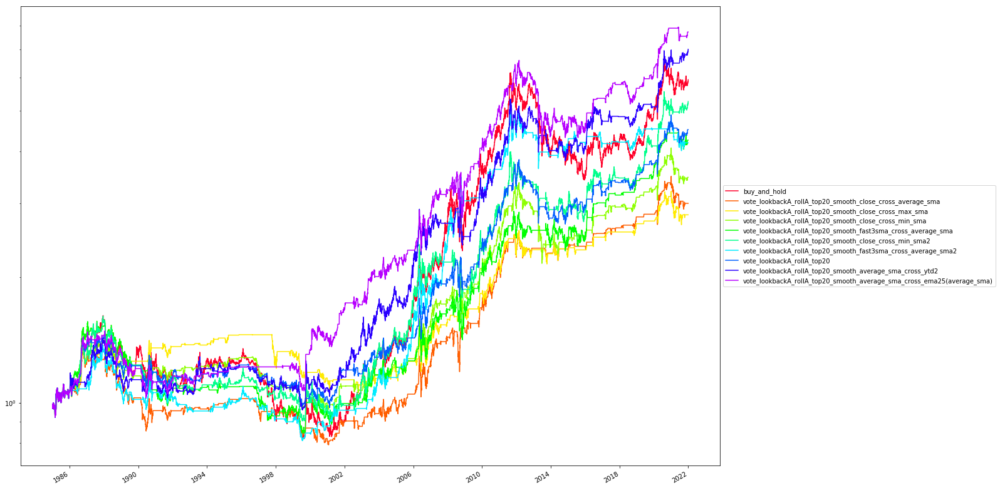

==================================== buy_and_hold


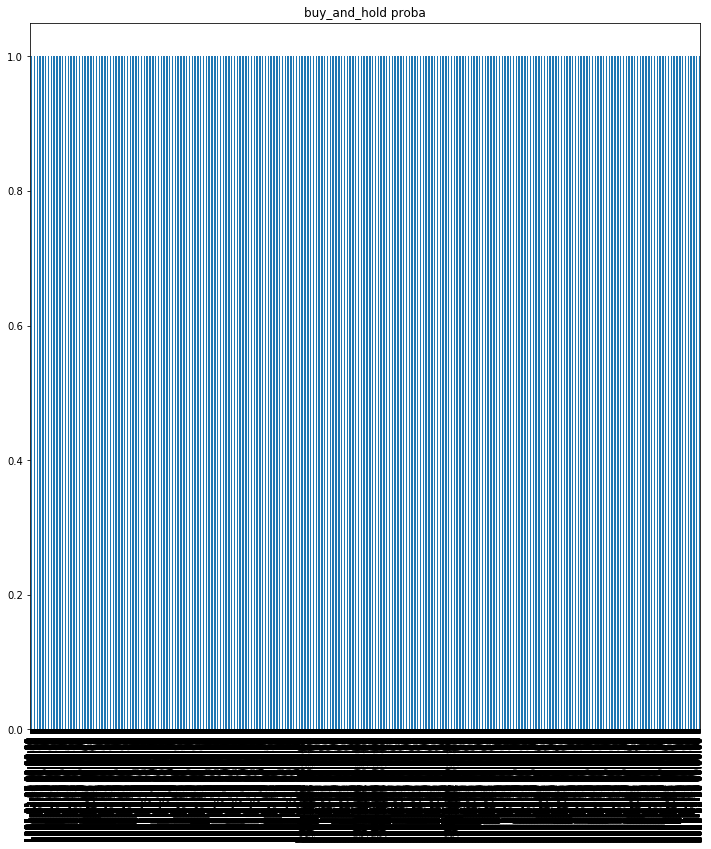

==================================== vote_lookbackA_rollA_top20


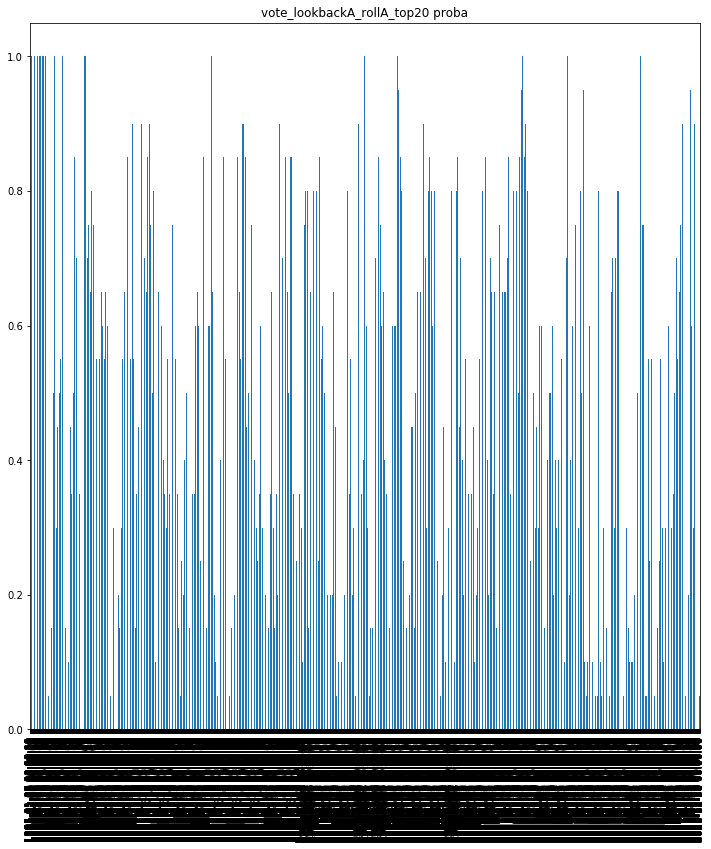

'1988-01-04 00:00:00 to 2000-12-29 00:00:00'

,highlight_ratio,flip_ratio,accu,prec,mse
vote_lookbackA_rollA_top20_smooth_close_cross_average_sma,0.393608,0.051510,0.491566,0.473684,1.262185
vote_lookbackA_rollA_top20_smooth_close_cross_max_sma,0.238828,0.033156,0.505475,0.485750,1.241409
vote_lookbackA_rollA_top20_smooth_close_cross_min_sma,0.388577,0.067496,0.497780,0.481340,1.254756
vote_lookbackA_rollA_top20_smooth_fast3sma_cross_average_sma,0.466410,0.048845,0.480912,0.466371,1.264439
vote_lookbackA_rollA_top20_smooth_close_cross_min_sma2,0.643386,0.083481,0.485647,0.479301,1.263303
vote_lookbackA_rollA_top20_smooth_fast3sma_cross_average_sma2,0.508139,0.080225,0.500740,0.488643,1.261025
vote_lookbackA_rollA_top20,0.517017,0.125518,0.500740,0.488838,1.253208
vote_lookbackA_rollA_top20_smooth_average_sma_cross_ytd2,0.604913,0.099763,0.490382,0.481898,1.247144
vote_lookbackA_rollA_top20_smooth_average_sma_cross_ema25(average_sma),0.419355,0.053582,0.498372,0.483416,1.228113


,annual_return,sharpe_ratio,max_drawdown,avg_drawdown,return/avgdd
buy_and_hold,-0.042235,-0.283945,-0.481481,-0.272448,-0.155021
vote_lookbackA_rollA_top20_smooth_close_cross_average_sma,-0.031917,-0.405088,-0.378052,-0.242851,-0.131425
vote_lookbackA_rollA_top20_smooth_close_cross_max_sma,-0.010797,-0.158476,-0.233433,-0.060734,-0.177768
vote_lookbackA_rollA_top20_smooth_close_cross_min_sma,-0.024386,-0.329981,-0.323528,-0.176179,-0.138416
vote_lookbackA_rollA_top20_smooth_fast3sma_cross_average_sma,-0.034877,-0.379192,-0.460613,-0.305809,-0.114049
vote_lookbackA_rollA_top20_smooth_close_cross_min_sma2,-0.035019,-0.313452,-0.426481,-0.287770,-0.121690
vote_lookbackA_rollA_top20_smooth_fast3sma_cross_average_sma2,-0.030836,-0.386787,-0.395964,-0.263019,-0.117241
vote_lookbackA_rollA_top20,-0.023533,-0.271225,-0.328532,-0.205708,-0.114399
vote_lookbackA_rollA_top20_smooth_average_sma_cross_ytd2,-0.019055,-0.158299,-0.318430,-0.191742,-0.099378
vote_lookbackA_rollA_top20_smooth_average_sma_cross_ema25(average_sma),0.000193,0.045543,-0.308228,-0.182908,0.001056


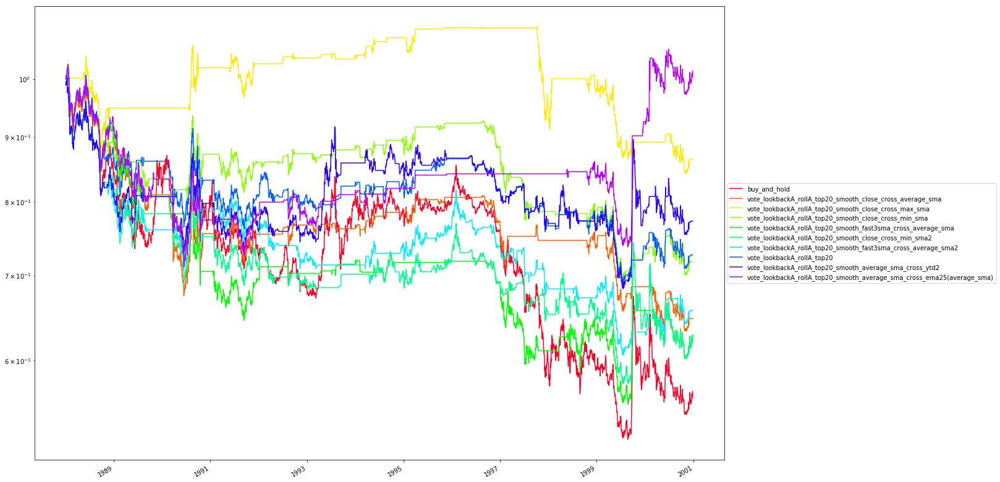

==================================== buy_and_hold


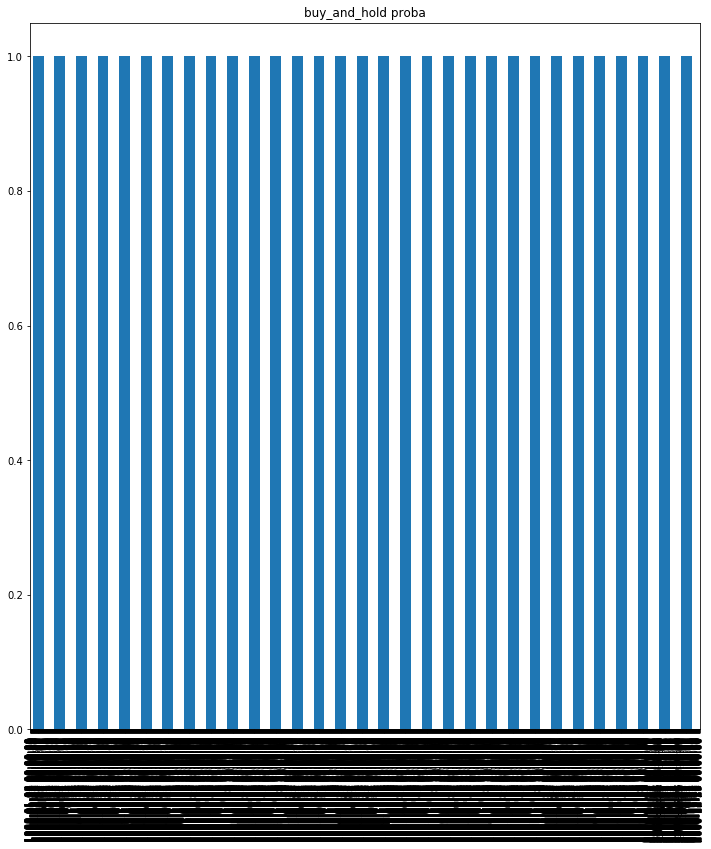

==================================== vote_lookbackA_rollA_top20


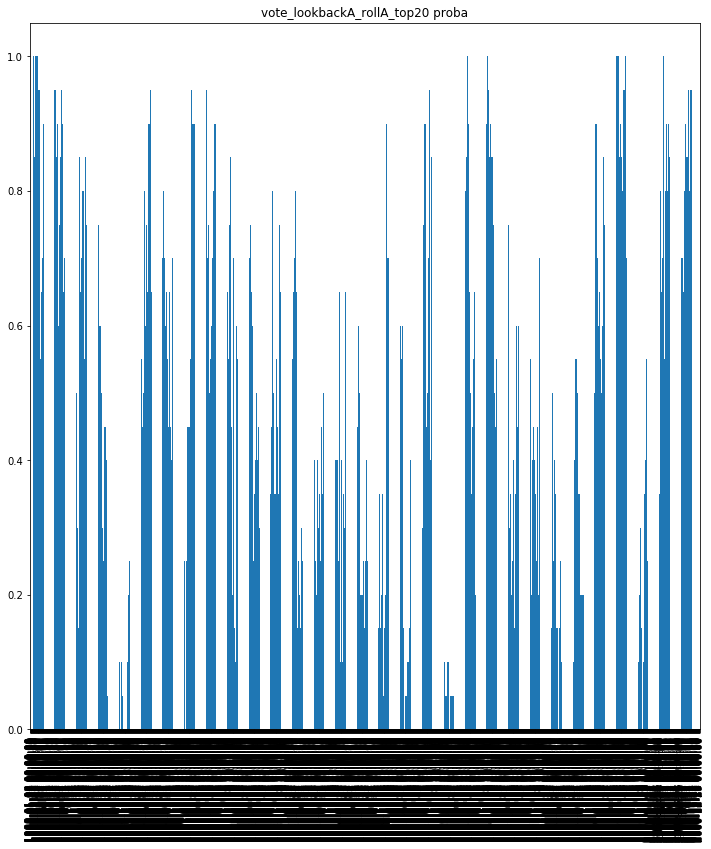

'2001-01-02 00:00:00 to 2005-12-30 00:00:00'

,highlight_ratio,flip_ratio,accu,prec,mse
vote_lookbackA_rollA_top20_smooth_close_cross_average_sma,0.369716,0.106923,0.486549,0.540541,1.266680
vote_lookbackA_rollA_top20_smooth_close_cross_max_sma,0.312836,0.063846,0.471176,0.523342,1.293242
vote_lookbackA_rollA_top20_smooth_close_cross_min_sma,0.357417,0.120769,0.488086,0.544086,1.266596
vote_lookbackA_rollA_top20_smooth_fast3sma_cross_average_sma,0.475019,0.094615,0.491929,0.537217,1.258419
vote_lookbackA_rollA_top20_smooth_close_cross_min_sma2,0.774789,0.049231,0.530361,0.547619,1.208067
vote_lookbackA_rollA_top20_smooth_fast3sma_cross_average_sma2,0.392006,0.046923,0.510377,0.568627,1.216563
vote_lookbackA_rollA_top20,0.417371,0.151538,0.503459,0.556169,1.252899
vote_lookbackA_rollA_top20_smooth_average_sma_cross_ytd2,0.821676,0.066923,0.534204,0.547240,1.193013
vote_lookbackA_rollA_top20_smooth_average_sma_cross_ema25(average_sma),0.491929,0.123846,0.504228,0.548438,1.227605


,annual_return,sharpe_ratio,max_drawdown,avg_drawdown,return/avgdd
buy_and_hold,0.132401,0.936292,-0.154450,-0.042569,3.110238
vote_lookbackA_rollA_top20_smooth_close_cross_average_sma,0.048568,0.576217,-0.114507,-0.022346,2.173441
vote_lookbackA_rollA_top20_smooth_close_cross_max_sma,0.017968,0.261255,-0.114507,-0.023118,0.777215
vote_lookbackA_rollA_top20_smooth_close_cross_min_sma,0.048494,0.565648,-0.114507,-0.024984,1.940996
vote_lookbackA_rollA_top20_smooth_fast3sma_cross_average_sma,0.057009,0.586055,-0.121232,-0.030467,1.871158
vote_lookbackA_rollA_top20_smooth_close_cross_min_sma2,0.116359,0.921545,-0.148496,-0.042554,2.734383
vote_lookbackA_rollA_top20_smooth_fast3sma_cross_average_sma2,0.109659,1.137670,-0.114507,-0.031223,3.512184
vote_lookbackA_rollA_top20,0.064622,0.706298,-0.114507,-0.025840,2.500834
vote_lookbackA_rollA_top20_smooth_average_sma_cross_ytd2,0.135304,1.033344,-0.148496,-0.042077,3.215638
vote_lookbackA_rollA_top20_smooth_average_sma_cross_ema25(average_sma),0.094999,0.935871,-0.114507,-0.022544,4.213834


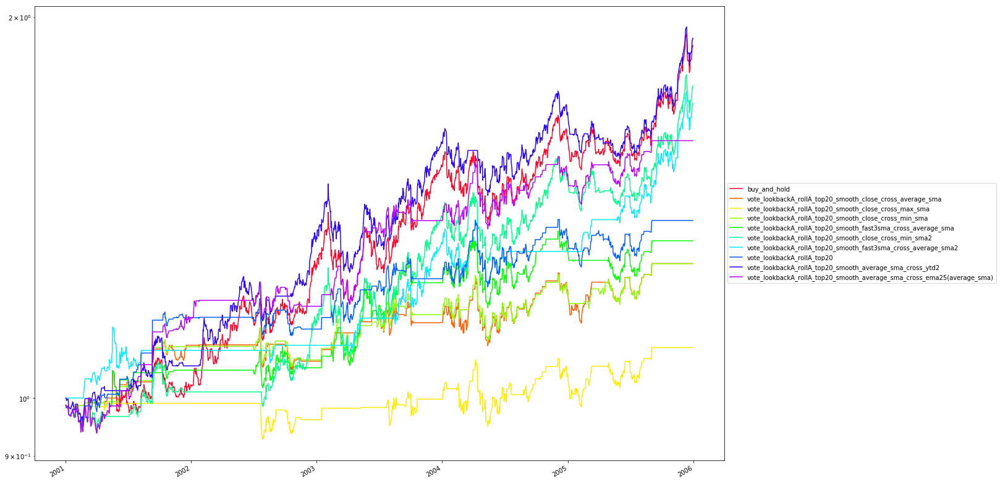

==================================== buy_and_hold


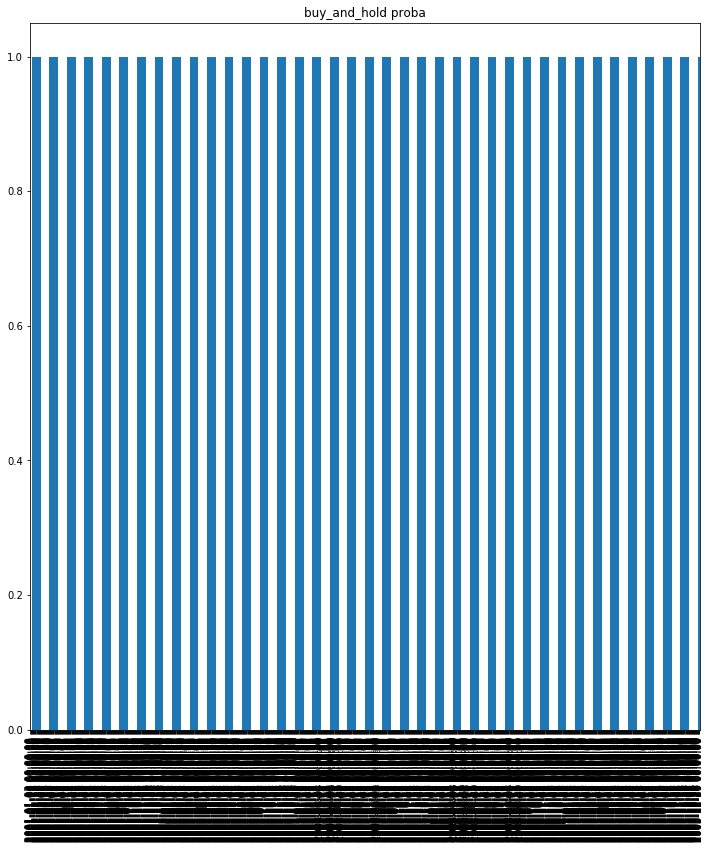

==================================== vote_lookbackA_rollA_top20


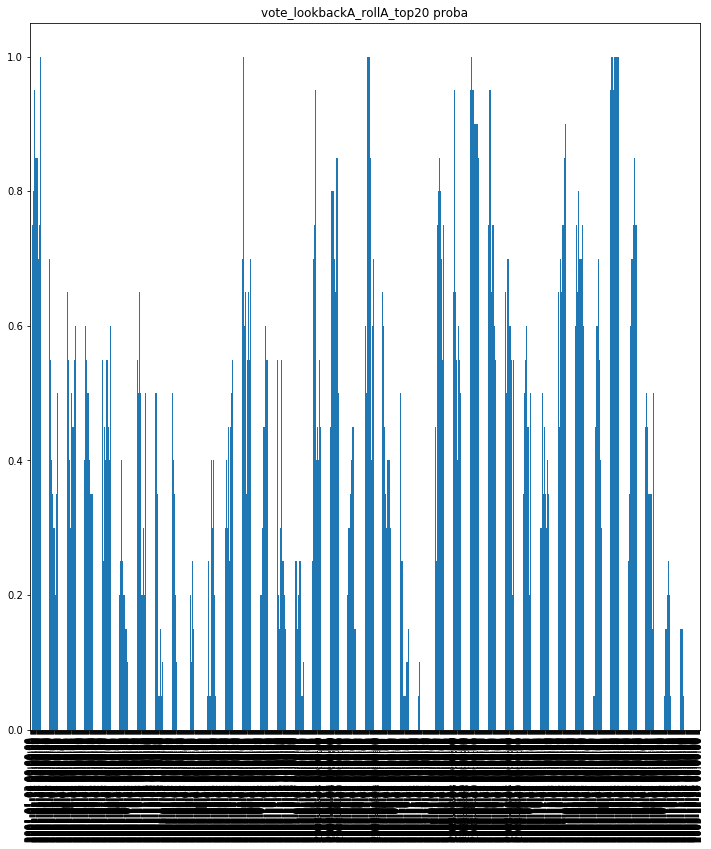

'2006-01-03 00:00:00 to 2008-12-31 00:00:00'

,highlight_ratio,flip_ratio,accu,prec,mse
vote_lookbackA_rollA_top20_smooth_close_cross_average_sma,0.480154,0.097436,0.513444,0.546667,1.235948
vote_lookbackA_rollA_top20_smooth_close_cross_max_sma,0.390525,0.071795,0.521127,0.567213,1.255363
vote_lookbackA_rollA_top20_smooth_close_cross_min_sma,0.483995,0.110256,0.524968,0.558201,1.236026
vote_lookbackA_rollA_top20_smooth_fast3sma_cross_average_sma,0.723431,0.080769,0.516005,0.532743,1.237074
vote_lookbackA_rollA_top20_smooth_close_cross_min_sma2,0.704225,0.016667,0.494238,0.518182,1.278691
vote_lookbackA_rollA_top20_smooth_fast3sma_cross_average_sma2,0.815621,0.042308,0.539052,0.543171,1.174315
vote_lookbackA_rollA_top20,0.554417,0.117949,0.523688,0.549654,1.242969
vote_lookbackA_rollA_top20_smooth_average_sma_cross_ytd2,0.632522,0.032051,0.514725,0.536437,1.263167
vote_lookbackA_rollA_top20_smooth_average_sma_cross_ema25(average_sma),0.670935,0.092308,0.524968,0.541985,1.228808


,annual_return,sharpe_ratio,max_drawdown,avg_drawdown,return/avgdd
buy_and_hold,0.186867,0.824008,-0.290117,-0.090528,2.064197
vote_lookbackA_rollA_top20_smooth_close_cross_average_sma,0.124529,0.803050,-0.214658,-0.037098,3.356753
vote_lookbackA_rollA_top20_smooth_close_cross_max_sma,0.088886,0.749128,-0.201061,-0.032924,2.699716
vote_lookbackA_rollA_top20_smooth_close_cross_min_sma,0.123999,0.795642,-0.201061,-0.038074,3.256783
vote_lookbackA_rollA_top20_smooth_fast3sma_cross_average_sma,0.111610,0.604174,-0.238715,-0.056253,1.984081
vote_lookbackA_rollA_top20_smooth_close_cross_min_sma2,0.026740,0.230815,-0.254526,-0.103120,0.259313
vote_lookbackA_rollA_top20_smooth_fast3sma_cross_average_sma2,0.254970,1.171280,-0.222369,-0.067194,3.794560
vote_lookbackA_rollA_top20,0.105524,0.640843,-0.201061,-0.042987,2.454806
vote_lookbackA_rollA_top20_smooth_average_sma_cross_ytd2,0.059202,0.386082,-0.231416,-0.082976,0.713487
vote_lookbackA_rollA_top20_smooth_average_sma_cross_ema25(average_sma),0.130542,0.693208,-0.222815,-0.046658,2.797851


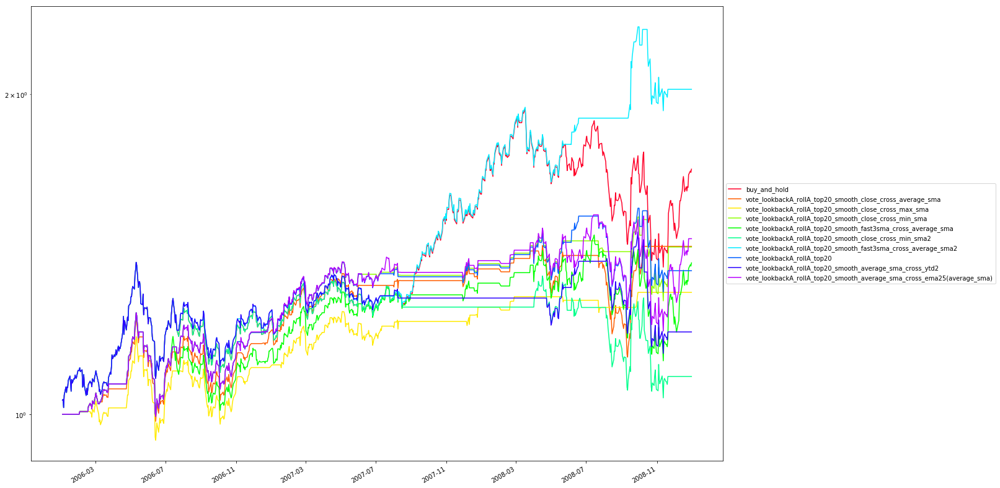

==================================== buy_and_hold


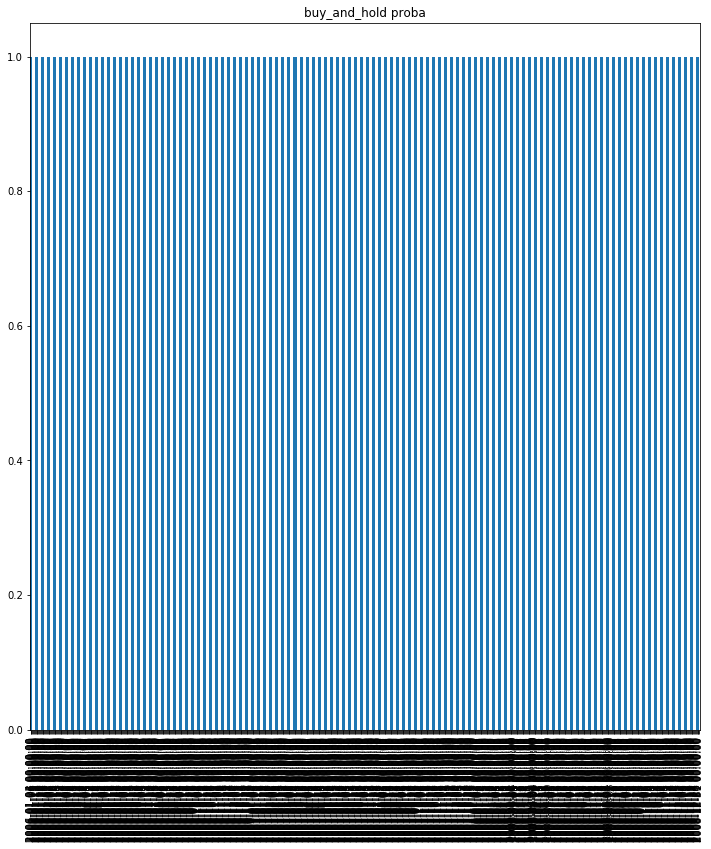

==================================== vote_lookbackA_rollA_top20


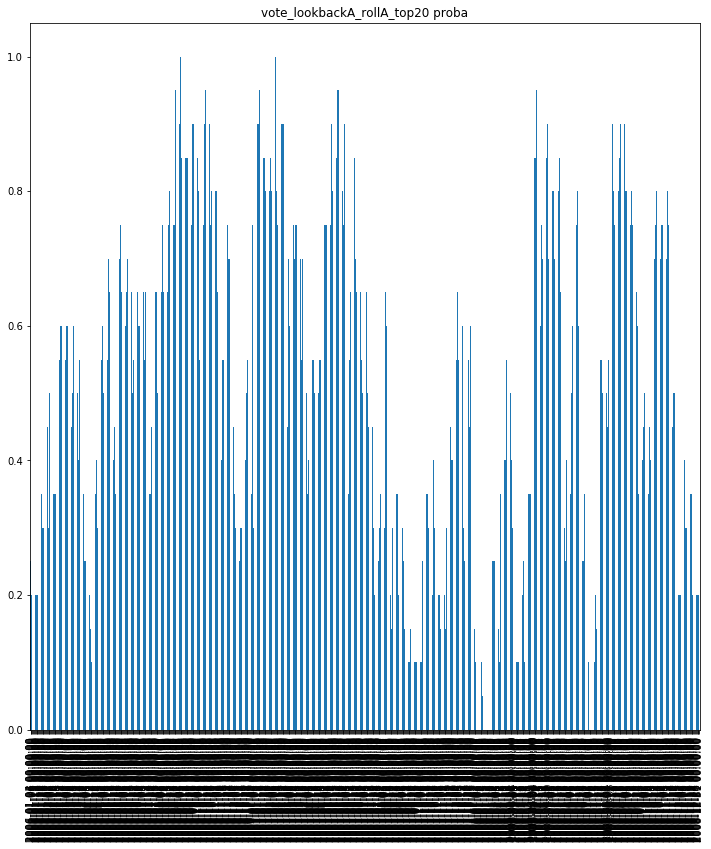

'2009-01-01 00:00:00 to 2011-12-30 00:00:00'

,highlight_ratio,flip_ratio,accu,prec,mse
vote_lookbackA_rollA_top20_smooth_close_cross_average_sma,0.473146,0.087068,0.510230,0.570270,1.230165
vote_lookbackA_rollA_top20_smooth_close_cross_max_sma,0.446292,0.081946,0.503836,0.567335,1.246842
vote_lookbackA_rollA_top20_smooth_close_cross_min_sma,0.501279,0.099872,0.520460,0.576531,1.213432
vote_lookbackA_rollA_top20_smooth_fast3sma_cross_average_sma,0.606138,0.066581,0.517903,0.561181,1.237544
vote_lookbackA_rollA_top20_smooth_close_cross_min_sma2,0.892583,0.014085,0.561381,0.565903,1.189707
vote_lookbackA_rollA_top20_smooth_fast3sma_cross_average_sma2,0.452685,0.021767,0.517903,0.581921,1.238357
vote_lookbackA_rollA_top20,0.515345,0.107554,0.524297,0.578164,1.200138
vote_lookbackA_rollA_top20_smooth_average_sma_cross_ytd2,0.814578,0.019206,0.560102,0.571429,1.186186
vote_lookbackA_rollA_top20_smooth_average_sma_cross_ema25(average_sma),0.517903,0.104994,0.524297,0.577778,1.200747


,annual_return,sharpe_ratio,max_drawdown,avg_drawdown,return/avgdd
buy_and_hold,0.203590,1.084884,-0.186157,-0.044423,4.583029
vote_lookbackA_rollA_top20_smooth_close_cross_average_sma,0.138290,1.206173,-0.113766,-0.013891,9.955378
vote_lookbackA_rollA_top20_smooth_close_cross_max_sma,0.110903,1.018231,-0.113766,-0.011508,9.637332
vote_lookbackA_rollA_top20_smooth_close_cross_min_sma,0.165996,1.346388,-0.113766,-0.013340,12.443356
vote_lookbackA_rollA_top20_smooth_fast3sma_cross_average_sma,0.122746,0.923679,-0.138741,-0.024931,4.923406
vote_lookbackA_rollA_top20_smooth_close_cross_min_sma2,0.199376,1.168157,-0.186157,-0.036460,5.468422
vote_lookbackA_rollA_top20_smooth_fast3sma_cross_average_sma2,0.122785,0.984278,-0.153481,-0.016201,7.578982
vote_lookbackA_rollA_top20,0.188887,1.482983,-0.113766,-0.012949,14.587200
vote_lookbackA_rollA_top20_smooth_average_sma_cross_ytd2,0.207088,1.253306,-0.169501,-0.033394,6.201332
vote_lookbackA_rollA_top20_smooth_average_sma_cross_ema25(average_sma),0.187804,1.474776,-0.113766,-0.012982,14.466209


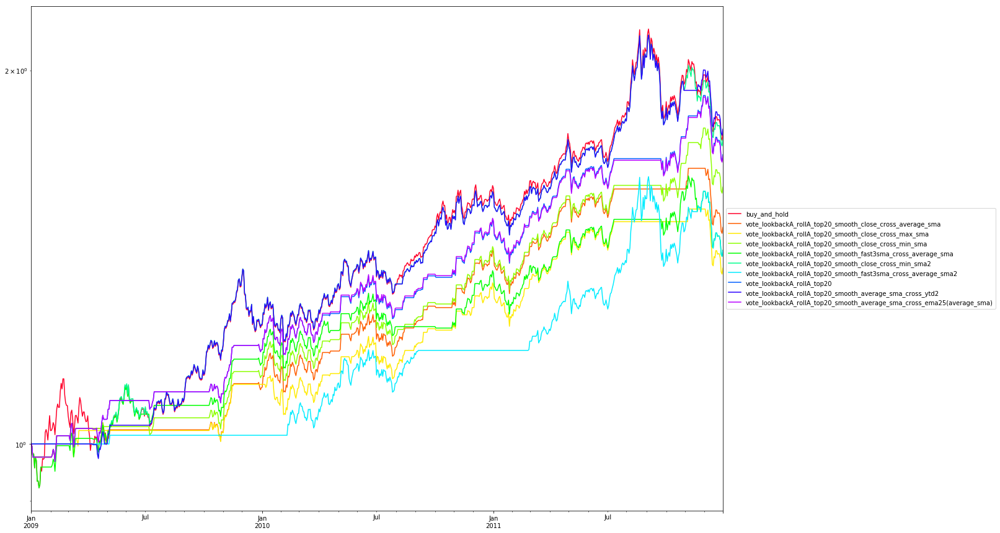

==================================== buy_and_hold


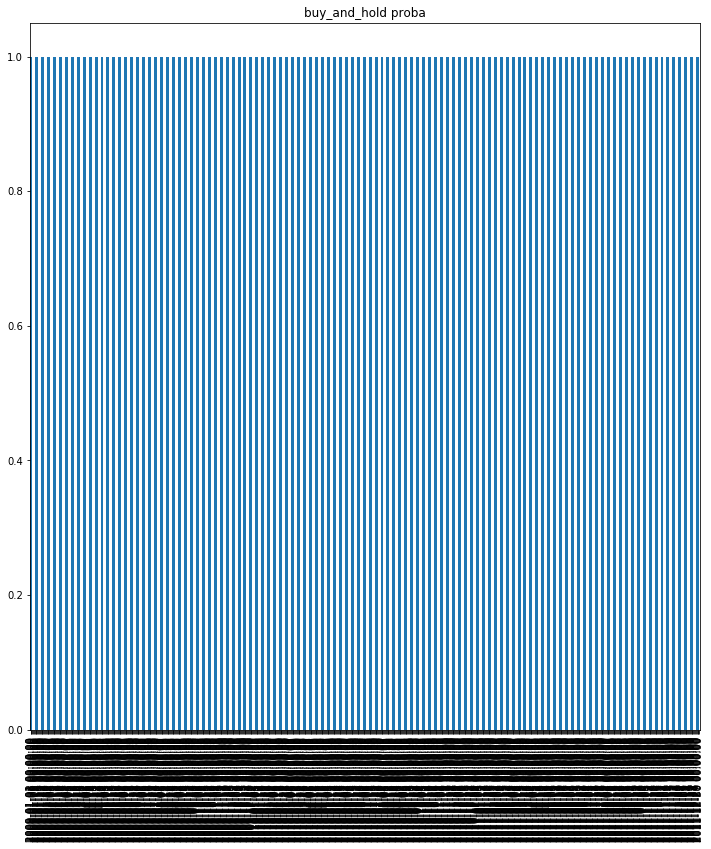

==================================== vote_lookbackA_rollA_top20


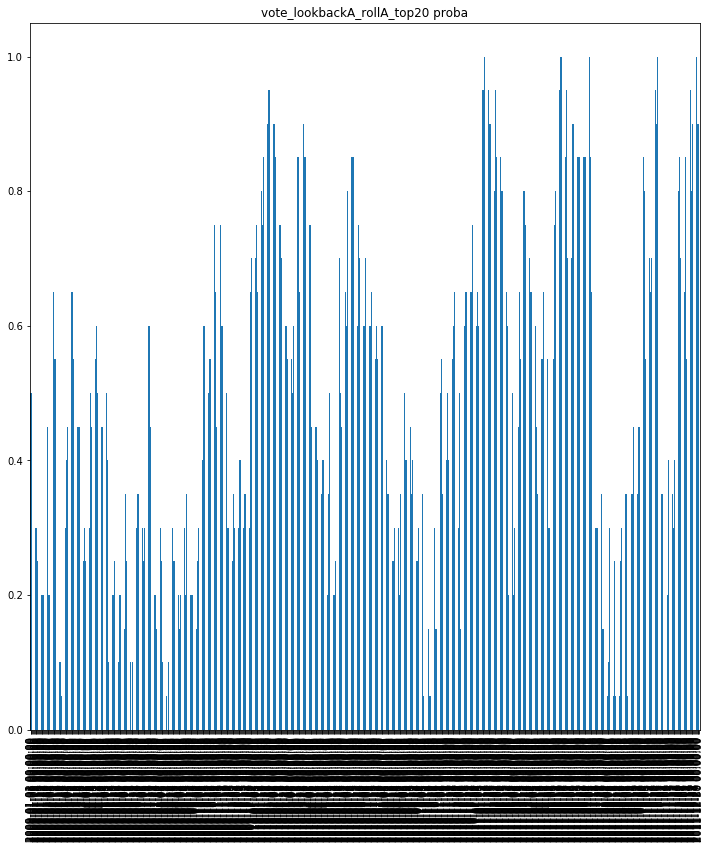

'2012-01-02 00:00:00 to 2015-12-31 00:00:00'

,highlight_ratio,flip_ratio,accu,prec,mse
vote_lookbackA_rollA_top20_smooth_close_cross_average_sma,0.276392,0.043228,0.517274,0.503472,1.207019
vote_lookbackA_rollA_top20_smooth_close_cross_max_sma,0.334933,0.029779,0.514395,0.498567,1.211299
vote_lookbackA_rollA_top20_smooth_close_cross_min_sma,0.381958,0.065322,0.501919,0.482412,1.246357
vote_lookbackA_rollA_top20_smooth_fast3sma_cross_average_sma,0.699616,0.038425,0.499040,0.488340,1.216588
vote_lookbackA_rollA_top20_smooth_close_cross_min_sma2,0.511516,0.065322,0.495202,0.480300,1.242423
vote_lookbackA_rollA_top20_smooth_fast3sma_cross_average_sma2,0.327255,0.059558,0.516315,0.501466,1.224215
vote_lookbackA_rollA_top20,0.492322,0.124880,0.506718,0.491228,1.237453
vote_lookbackA_rollA_top20_smooth_average_sma_cross_ytd2,0.528791,0.088377,0.504798,0.490018,1.231923
vote_lookbackA_rollA_top20_smooth_average_sma_cross_ema25(average_sma),0.824376,0.049952,0.508637,0.495925,1.258255


,annual_return,sharpe_ratio,max_drawdown,avg_drawdown,return/avgdd
buy_and_hold,-0.089555,-0.494734,-0.412616,-0.229167,-0.390783
vote_lookbackA_rollA_top20_smooth_close_cross_average_sma,0.012069,0.188689,-0.157860,-0.089029,0.135559
vote_lookbackA_rollA_top20_smooth_close_cross_max_sma,0.005818,0.109742,-0.169712,-0.100375,0.057967
vote_lookbackA_rollA_top20_smooth_close_cross_min_sma,-0.041497,-0.305136,-0.359917,-0.219476,-0.189074
vote_lookbackA_rollA_top20_smooth_fast3sma_cross_average_sma,-0.004919,0.023262,-0.192594,-0.102123,-0.048172
vote_lookbackA_rollA_top20_smooth_close_cross_min_sma2,-0.037057,-0.252755,-0.279349,-0.175866,-0.210711
vote_lookbackA_rollA_top20_smooth_fast3sma_cross_average_sma2,-0.012229,-0.067268,-0.269951,-0.153290,-0.079779
vote_lookbackA_rollA_top20,-0.030529,-0.204333,-0.299361,-0.199546,-0.152991
vote_lookbackA_rollA_top20_smooth_average_sma_cross_ytd2,-0.023871,-0.140584,-0.260508,-0.153555,-0.155458
vote_lookbackA_rollA_top20_smooth_average_sma_cross_ema25(average_sma),-0.060588,-0.335151,-0.364046,-0.227586,-0.266220


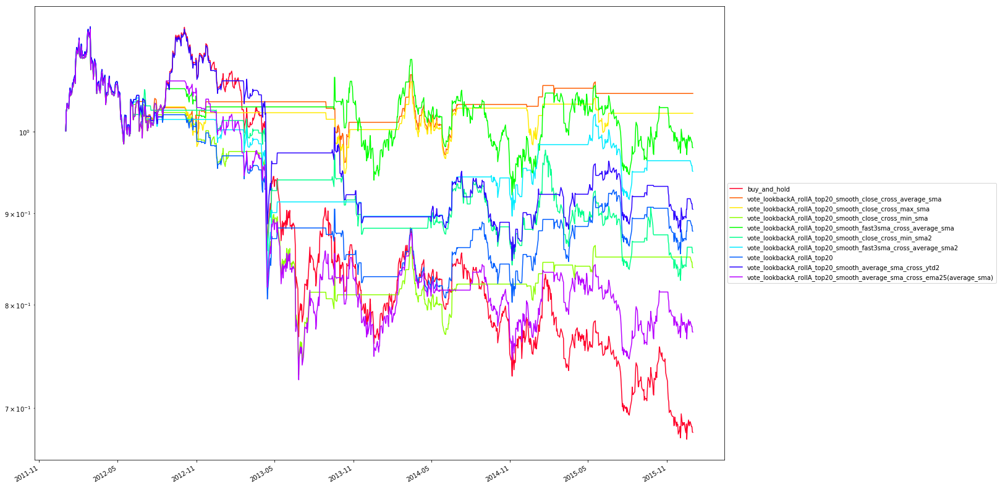

==================================== buy_and_hold


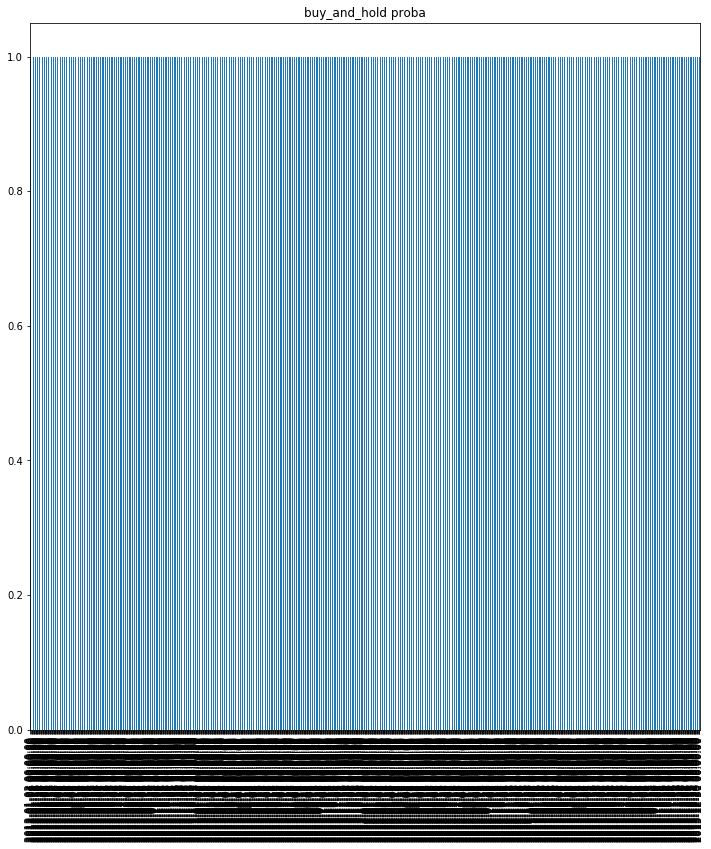

==================================== vote_lookbackA_rollA_top20


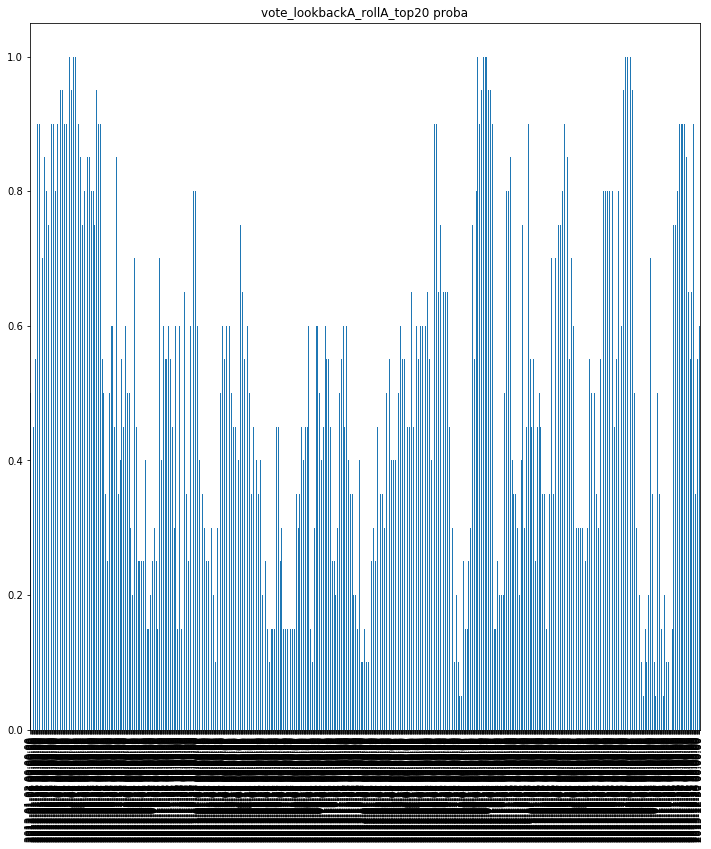

'2016-01-01 00:00:00 to 2021-12-31 00:00:00'

,highlight_ratio,flip_ratio,accu,prec,mse
vote_lookbackA_rollA_top20_smooth_close_cross_average_sma,0.255278,0.055058,0.490083,0.551378,1.258313
vote_lookbackA_rollA_top20_smooth_close_cross_max_sma,0.234805,0.040973,0.484965,0.544959,1.265136
vote_lookbackA_rollA_top20_smooth_close_cross_min_sma,0.339091,0.076184,0.498401,0.550943,1.242858
vote_lookbackA_rollA_top20_smooth_fast3sma_cross_average_sma,0.281510,0.055698,0.504798,0.572727,1.210945
vote_lookbackA_rollA_top20_smooth_close_cross_min_sma2,0.678823,0.040333,0.510557,0.534402,1.195914
vote_lookbackA_rollA_top20_smooth_fast3sma_cross_average_sma2,0.308381,0.040973,0.476647,0.520747,1.293039
vote_lookbackA_rollA_top20,0.384517,0.108835,0.505438,0.554077,1.228728
vote_lookbackA_rollA_top20_smooth_average_sma_cross_ytd2,0.535509,0.048015,0.507997,0.541219,1.209103
vote_lookbackA_rollA_top20_smooth_average_sma_cross_ema25(average_sma),0.353167,0.071063,0.509917,0.565217,1.211483


,annual_return,sharpe_ratio,max_drawdown,avg_drawdown,return/avgdd
buy_and_hold,0.091659,0.718013,-0.185126,-0.066784,1.372467
vote_lookbackA_rollA_top20_smooth_close_cross_average_sma,0.038846,0.537987,-0.165981,-0.021882,1.775266
vote_lookbackA_rollA_top20_smooth_close_cross_max_sma,0.031674,0.473956,-0.168298,-0.021322,1.485533
vote_lookbackA_rollA_top20_smooth_close_cross_min_sma,0.055705,0.703536,-0.180014,-0.026546,2.098465
vote_lookbackA_rollA_top20_smooth_fast3sma_cross_average_sma,0.092678,1.169851,-0.092613,-0.011042,8.393282
vote_lookbackA_rollA_top20_smooth_close_cross_min_sma2,0.106480,0.938888,-0.124046,-0.054270,1.962028
vote_lookbackA_rollA_top20_smooth_fast3sma_cross_average_sma2,0.001790,0.060008,-0.178881,-0.046442,0.038541
vote_lookbackA_rollA_top20,0.071581,0.863926,-0.143071,-0.025895,2.764327
vote_lookbackA_rollA_top20_smooth_average_sma_cross_ytd2,0.092453,0.914865,-0.105992,-0.041375,2.234510
vote_lookbackA_rollA_top20_smooth_average_sma_cross_ema25(average_sma),0.092162,1.182802,-0.119257,-0.018094,5.093593


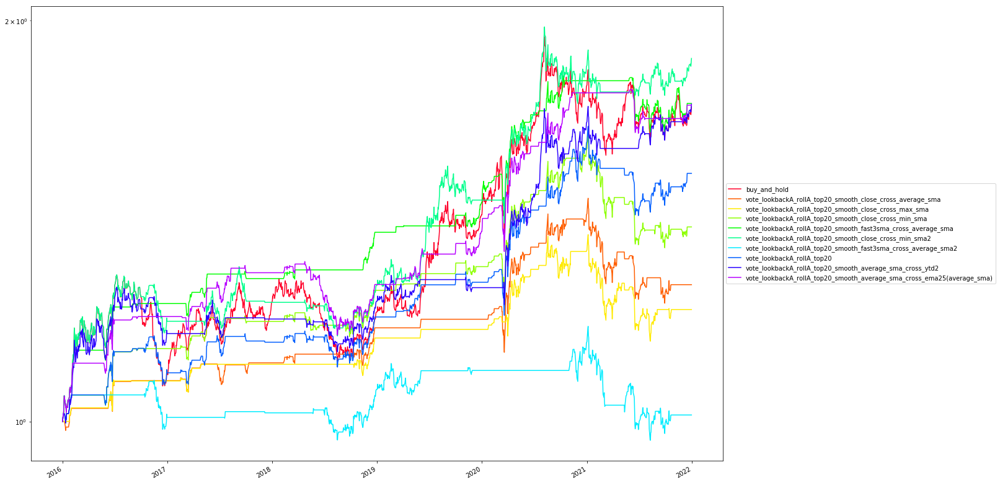

==================================== buy_and_hold


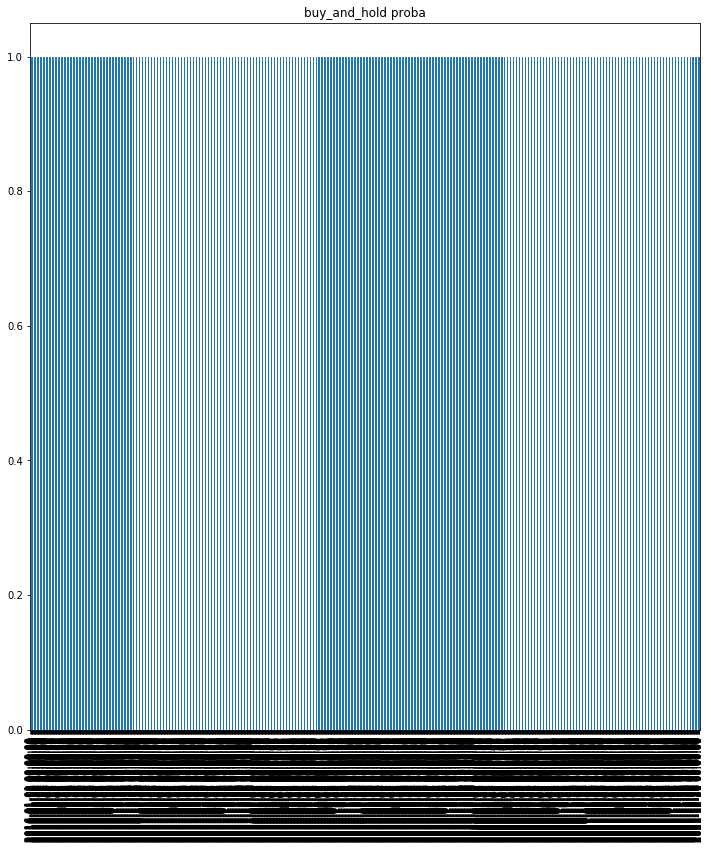

==================================== vote_lookbackA_rollA_top20


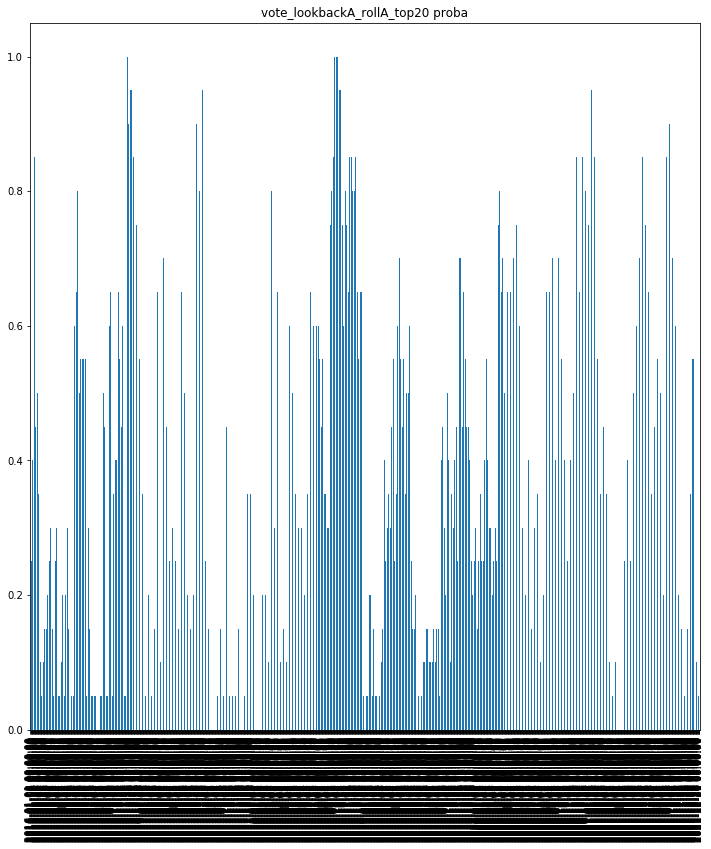

['buy_and_hold',
 'vote_lookbackA_rollA_top20_smooth_close_cross_average_sma',
 'vote_lookbackA_rollA_top20_smooth_close_cross_max_sma',
 'vote_lookbackA_rollA_top20_smooth_close_cross_min_sma',
 'vote_lookbackA_rollA_top20_smooth_fast3sma_cross_average_sma',
 'vote_lookbackA_rollA_top20_smooth_close_cross_min_sma2',
 'vote_lookbackA_rollA_top20_smooth_fast3sma_cross_average_sma2',
 'vote_lookbackA_rollA_top20',
 'vote_lookbackA_rollA_top20_smooth_average_sma_cross_ytd2',
 'vote_lookbackA_rollA_top20_smooth_average_sma_cross_ema25(average_sma)']

In [66]:
# cases = list(ret_pred_all.columns)
# cases.remove('true_up')

# cases = ['vote_lookbackA_rollA_top20', 'biased1_combine', 'buy_and_hold']

strategy_list_sel = print_all_result(ret_pred_case2, proba_all, base_case=cases)

print_all_result(ret_pred_case2['1988':'2000'], proba_all, strategy_list_sel=strategy_list_sel)
print_all_result(ret_pred_case2['2001':'2005'], proba_all, strategy_list_sel=strategy_list_sel)
print_all_result(ret_pred_case2['2006':'2008'], proba_all, strategy_list_sel=strategy_list_sel)
print_all_result(ret_pred_case2['2009':'2011'], proba_all, strategy_list_sel=strategy_list_sel)
print_all_result(ret_pred_case2['2012':'2015'], proba_all, strategy_list_sel=strategy_list_sel)
print_all_result(ret_pred_case2['2016':'2021'], proba_all, strategy_list_sel=strategy_list_sel)

NameError: name 'ret_pred_all' is not defined

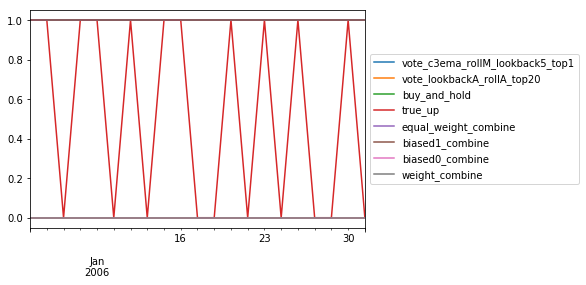

In [43]:
for year in [2006, 2007, 2008]:
    for m in range(1, 13):
        if m < 10:
            m = "{}-0{}".format(year, m)
        else:
            m = "{}-{}".format(year, m)
        pred_all[m].plot().legend(loc='center left', bbox_to_anchor=(1, 0.5))
        print_all_result(ret_pred_all[m], proba_all)